In [2]:
#!/usr/bin/py
import sklearn
import logging
import os
import warnings
import numpy as np
import tsfel
from collections import namedtuple
from contextlib import contextmanager
from datetime import datetime
from zipfile import ZipFile, is_zipfile
import matplotlib.pyplot as plt
import pandas as pd
import math
import tsfresh.feature_extraction.feature_calculators as feature
from tsfresh.utilities.distribution import MultiprocessingDistributor
import seaborn as sns
from datetime import date

In [3]:
HEADER_LINE_PREFIX = '% '
HEADER_END_LINE_PREFIX = '%-'
HEADER_KEYS = ['date_time', 'prog_version', 'serial', 'mech_unit', 'axis', 'sampling_period', 'tool', 'rob_ax', 'ext_ax']
DATETIME_FORMAT = '%Y%m%d_%H%M%S'

MIN_SAMPLES = 600
SAMPLING_PERIOD = 0.004032
FREQUENCY = 1/SAMPLING_PERIOD

# Retrieves a pre-defined feature configuration file to extract all available features
cfg = tsfel.get_features_by_domain()



In [4]:
MccRun = namedtuple('MccRun', 'mode series')
MccResult = namedtuple('MccResult', 'status value average distance')
OperationMode = namedtuple('OperationMode', ['axis', 'mech_unit', 'tool', 'rob_ax', 'ext_ax', 'prog_version'])

In [5]:
@contextmanager
def open_zip(file):
    if not is_zipfile(file):
        raise TypeError(f'{file} is not a valid zip file')

    zip_archive = ZipFile(file, 'r')
    files = zip_archive.namelist()
    try:
        extracted = [zip_archive.open(f) for f in files]
        yield extracted
    finally:
        for f in extracted:
            f.close()
        zip_archive.close()

In [6]:
def read_header(file):
    header = {}
    for line in file:
        line = line.decode('utf-8')
        if line.startswith(HEADER_LINE_PREFIX):
    
            parameter, value = (element.strip() for element in line.split(':'))
            if 'Meas time' in parameter:
                header['date_time'] = datetime.strptime(value, DATETIME_FORMAT)
            if 'Program version' in parameter:
                header['prog_version'] = value
            elif 'Robot serial number' in parameter:
                header['serial'] = value
            elif 'Mech unit' in parameter:
                header['mech_unit'] = value
            elif 'Axis' in parameter:
                header['axis'] = int(value)
            elif 'Sample time' in parameter:
                header['sampling_period'] = float(value)
            elif 'Tool' in parameter:
                header['tool'] = value
            elif 'RobAx' in parameter:
                header['rob_ax'] = value
            elif 'ExtAx' in parameter:
                header['ext_ax'] = value
            elif 'Meas type' in parameter:
                continue
            else:
                #logging.debug(f'Parameter {parameter} and value {value} not handled')
                continue

        elif line.startswith(HEADER_END_LINE_PREFIX):
            continue

        else:
            break
#     if not header:
#         logging.warning(f'Empty header in {file.name}')
#         return None
    return header

In [7]:
def read_data(file):
    with warnings.catch_warnings():
        warnings.filterwarnings('error')
        try:
            data = np.loadtxt(file, dtype=np.float64, delimiter='\t')
        except Warning:
            logging.warning(f'{file.name} has no data')
            return None
#         except Exception:
#             logging.error(f'{file.name} is broken')
            return None

    n_samples, n_columns = data.shape

    if n_columns == 3:
        data = _decrypt3(data)
    elif n_columns == 4:
        data = _decrypt3(data[:, 1:]) 
    elif n_columns == 5:
        data = _decrypt4(data[:, 1:])
    else:
        logging.warning(f'Unhandled case with {n_columns} columns in {handle.name}')
        return None
    if n_samples < MIN_SAMPLES:
        logging.warning(f'Case with {n_samples} samples')

    data = data[10:-10]
    return np.asarray(data)
def _decrypt3(data):
    return data * np.matrix([[0.5, 0.5, 0], [-0.5, 0, 0.5], [0, 0.5, -0.5]])


def _decrypt4(data):
    return data * np.matrix([[0.5, 0.5, 0, 0], [-0.5, 0, 0, 0.5], [0, 0, 0.5, -0.5], [0, 0.5, -0.5, 0]])

In [8]:

class MccTimeSeries():
    def __init__(self, series, date_time, sampling_period):
        self.series = series
        self.date_time = date_time
        self.sampling_period = sampling_period
    
    def __getitem__(self, index):
        return self.series[index]

    def __len__(self):
        return len(self.series)

    @property
    def torque_ff(self):
        return self.series[:, 0]

    @property
    def velocity(self):
        return self.series[:, 1]
    
    @property
    def torque(self):
        return self.series[:, 2]

    @property
    def time_index(self):
        return np.arange(0, self.torque.size)[:, np.newaxis] * self.sampling_period

    @property
    def sampling_frequency(self):
        return 1 / self.sampling_period

    def normalized_torque(self):
        return (self.torque - self.torque.min()) / (self.torque.max() - self.torque.min())
    
    def standardized_torque(self):
        return (self.torque - self.torque.mean()) / self.torque.std()
    def mean_torque(self):
        return self.torque.mean()
    
    def find_reference_point(self):
        ref = self.standardized_torque()
        mean_value = self.torque.mean()
        stv = self.torque.std(ddof=0)
        return ref, mean_value, stv
        
    
    

# Get the reference points

# Failure Case 2

In [9]:
axes = ['axis1', 'axis2', 'axis3', 'axis4', 'axis5', 'axis6']

def process_file(file_path):
    ref = {}
    mean = {}
    stv = {}

    with ZipFile(file_path) as File:
        print(File)
        for file in File.namelist():
            with File.open(file) as f:
                header = read_header(f)
                data = read_data(f)
                mode = OperationMode(axis=header['axis'], mech_unit=header['mech_unit'], tool=header['tool'], rob_ax=header['rob_ax'], ext_ax=header['ext_ax'], prog_version=header['prog_version'])
                series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))                
                for ax in axes:
                    if ax in file:
                        ref[ax], mean[ax], stv[ax] = series.find_reference_point()
                        

        return ref, mean, stv



In [10]:
# Use the standard deviation and the mean of reference points
def standardized_torque(data,ref_mean,ref_stv):
    return (data - ref_mean) / ref_stv

In [11]:
# Caculate the corss-correlation of two consecutive measurements
from scipy import signal
def cross_correlation(ref,d):
    Shift = []
    corr = signal.correlate(ref,d)
#Find the index of the maximum of cross-correlation
    indx = np.argmax(corr, axis=0)
#Offset of the two series
    lags = signal.correlation_lags(len(ref), len(d))
    Shift.append(lags[indx])
    offset = lags[indx]
    min_length = min(d.size,ref.size)-abs(offset)
    d_m, ref_m = shift_signal(offset, min_length, d, ref)
    return d_m, ref_m, offset

In [13]:
def shift_signal(offset, min_length, d, ref):    
    if offset > 0:
        d = d[:min_length] ;
        ref = ref[offset:];
    elif offset < 0:
        d = d[-offset:];
        ref = ref[:min_length]
    return d,ref

In [14]:
def trimmedMean(mcc_torque):   
    mcc_torque = mcc_torque[np.abs(mcc_torque) > 1e-4]
    try:
          return mcc_torque.mean()      
    except:
          return null

In [15]:
def torque_fftFeatures_maxamplitude(mcc_torque):   
    amplitudes = np.fft.fft(mcc_torque)
    realAmplitudes = abs(amplitudes)  # real valued amplitudes
    maxAmplitude = np.max(realAmplitudes)
    return maxAmplitude

In [16]:
def torque_fftFeatures_entropy(mcc_torque):
      try:  
            amplitudes = np.fft.fft(mcc_torque)
            realAmplitudes = abs(amplitudes)  # real valued amplitudes
            N = mcc_torque.shape[0]
            entropy = 0
            for i in realAmplitudes:
                  try:
                        entropy += i * log(i)
                  except:
                        entropy += 0
            entropy = -entropy / np.float(log(N))
            return entropy
      except:
            return 0           


In [17]:
def area_signal(d, ref, ref_mean, dx):
    abs(np.trapz(abs(d), axis = ref_mean, dx=dx) - np.trapz(abs(ref), axis = ref_mean, dx=dx))

In [28]:
def generate_more_feature(Filepath,ref,mean,stv):    
    File_path = Filepath
    ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    RMS_Value=pd.DataFrame(columns=columns)
    Skewness_value = pd.DataFrame(columns=columns)
    Kurtosis_value = pd.DataFrame(columns=columns)
    
    Energy = pd.DataFrame(columns=columns)
    Stv = pd.DataFrame(columns=columns)
    Variance = pd.DataFrame(columns=columns)
    Impulse_factor = pd.DataFrame(columns=columns)
    Shape_factor = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    torque_areaUnderSignal = pd.DataFrame(columns=columns)
    torque_trimmedMean = pd.DataFrame(columns=columns)
    torque_signalNoise = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    fig, (x1, x2, xf1) = plt.subplots(3)
    fig, (x3, x4, xf2) = plt.subplots(3)
    fig, (x5, x6, xf3) = plt.subplots(3)
    fig, (x7, x8, xf4) = plt.subplots(3)
    fig, (x9, x10, xf5) = plt.subplots(3)
    fig, (x11, x12, xf6) = plt.subplots(3)
    
    i = 0
    for loop_file in os.listdir(File_path):
        route = os.path.join(File_path,loop_file)

        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    #Set the index
                    date = header['date_time']
    #                 i = date.date()
                    #Read data
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    index = series.time_index
                    if ax1 in file:
                    # Extract features for axis1
                        d1 = standardized_torque(series.torque,mean[ax1], stv[ax1])
                        s1 = series.velocity
                        xf1.plot(s1)
                        
                        #ff_d1 = series.torque_ff
                        #xf1.plot(ff_d1)
                        xf1.set_xlabel('Timestamp')  
                        xf1.set_ylabel('Speed axis1')
                        d_m1, ref_m1,offset1 = cross_correlation(ref[ax1], d1) 
                        corr_1 = np.corrcoef(d_m1, ref_m1)
                        
                        if abs(offset1) > 10 or corr_1[0,1] <0.9:
                            continue
                        else:
                            torque_areaUnderSignal.loc[i, 'time'] = date.date()
                            torque_areaUnderSignal.loc[i, 'axis1'] = abs(np.trapz(abs(d_m1), dx = index[1] - index[0]) - np.trapz(abs(ref_m1), dx = index[1] - index[0]))
                            
                            torque_trimmedMean.loc[i, 'time'] = date.date()
                            torque_trimmedMean.loc[i, 'axis1'] = abs(trimmedMean(d_m1)- trimmedMean(ref_m1))

                            torque_signalNoise.loc[i, 'time'] = date.date()
                            torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))
                            
                            RMS_Value.loc[i, 'time'] = date.date()
                            RMS_Value.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)

                            Skewness_value.loc[i, 'time'] = date.date()
                            Skewness_value.loc[i, 'axis1'] = feature.skewness(d_m1-ref_m1)

                            Kurtosis_value.loc[i, 'time'] = date.date()
                            Kurtosis_value.loc[i, 'axis1'] = feature.kurtosis(d_m1-ref_m1)

                            Energy.loc[i, 'time'] = date.date()
                            Energy.loc[i, 'axis1'] = feature.abs_energy(d_m1-ref_m1)

                            Stv.loc[i, 'time'] = date.date()
                            Stv.loc[i, 'axis1'] = (d_m1-ref_m1).std(ddof=0)

                            Variance.loc[i, 'time'] = date.date()
                            Variance.loc[i, 'axis1'] = (d_m1-ref_m1).var()

                            Impulse_factor.loc[i, 'time'] = date.date()
                            Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                            Shape_factor.loc[i, 'time'] = date.date()
                            Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
                            
                            MAX_AMP.loc[i, 'time'] = date.date()
                            MAX_AMP.loc[i, 'axis1'] = torque_fftFeatures_maxamplitude(d_m1-ref_m1)
                            
                            

                            x1.plot(d1)
                            x2.plot(d_m1)
                            x1.set_xlabel('Timestamp')  
                            x1.set_ylabel('Torque axis1')
                            x2.set_xlabel('Timestamp')  
                            x2.set_ylabel('Torque axis1')


                    elif ax2 in file:
                    # Extract features for axis2
                        ff_d2 = series.torque_ff
                        xf2.plot(ff_d2)
                        xf2.set_xlabel('Timestamp')  
                        xf2.set_ylabel('FF Torque axis2')

                        d2 = standardized_torque(series.torque,mean[ax2], stv[ax2])
                        d_m2, ref_m2, offset2 = cross_correlation(ref[ax2], d2)
                        corr_2 = np.corrcoef(d_m2, ref_m2)
                        if abs(offset2) > 10 or corr_2[0,1] <0.9:
                            continue
                        else:
                            x3.plot(d2)
                            x4.plot(d_m2)
                            x3.set_xlabel('Timestamp')  
                            x3.set_ylabel('Torque axis2')
                            x4.set_xlabel('Timestamp')  
                            x4.set_ylabel('Torque axis2')
                            torque_areaUnderSignal.loc[i, 'axis2'] = abs(np.trapz(abs(d_m2), dx = index[1] - index[0]) - np.trapz(abs(ref_m2), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis2'] = abs(trimmedMean(d_m2)- trimmedMean(ref_m2))
                            torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
                            RMS_Value.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)
                            Skewness_value.loc[i, 'axis2'] = feature.skewness(d_m2-ref_m2)
                            Kurtosis_value.loc[i, 'axis2'] = feature.kurtosis(d_m2-ref_m2)
                            Energy.loc[i, 'axis2'] = feature.abs_energy(d_m2-ref_m2)
                            Stv.loc[i, 'axis2'] = (d_m2-ref_m2).std(ddof=0)
                            Variance.loc[i, 'axis2'] = (d_m2-ref_m2).var()
                            Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            Shape_factor.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            MAX_AMP.loc[i, 'axis2'] = torque_fftFeatures_maxamplitude(d_m2-ref_m2)                        
                            
                            
                            
                    elif ax3 in file:
                    # Extract features for axis3
                        ff_d3 = series.torque_ff
                        xf3.plot(ff_d3)
                        xf3.set_xlabel('Timestamp')  
                        xf3.set_ylabel('FF Torque axis3')
                        d3 = standardized_torque(series.torque,mean[ax3], stv[ax3])
                        d_m3, ref_m3,offset3 = cross_correlation(ref[ax3], d3)
                        corr_3 = np.corrcoef(d_m3, ref_m3)
                        
                        if abs(offset3) > 10 or corr_3[0,1] <0.9:
                            continue
                        else:
                            
                            x5.plot(d3)
                            x6.plot(d_m3)
                            x5.set_xlabel('Timestamp')  
                            x5.set_ylabel('Torque axis3')
                            x6.set_xlabel('Timestamp')  
                            x6.set_ylabel('Torque axis3')
                            torque_areaUnderSignal.loc[i, 'axis3'] = abs(np.trapz(abs(d_m3), dx = index[1] - index[0]) - np.trapz(abs(ref_m3), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis3'] = abs(trimmedMean(d_m3)- trimmedMean(ref_m3))
                            torque_signalNoise.loc[i, 'axis3'] = abs((d_m3-ref_m3).mean()/(d_m3-ref_m3).std(ddof=0))
                            RMS_Value.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)
                            Skewness_value.loc[i, 'axis3'] = feature.skewness(d_m3-ref_m3)
                            Kurtosis_value.loc[i, 'axis3'] = feature.kurtosis(d_m3-ref_m3)
                            Stv.loc[i, 'axis3'] = (d_m3-ref_m3).std(ddof=0)
                            Variance.loc[i, 'axis3'] = (d_m3-ref_m3).var()
                            Energy.loc[i, 'axis3'] = feature.abs_energy(d_m3-ref_m3)
                            Impulse_factor.loc[i, 'axis3'] = max(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            Shape_factor.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            MAX_AMP.loc[i, 'axis3'] = torque_fftFeatures_maxamplitude(d_m3-ref_m3)                        
                        
                    elif ax4 in file:
                    # Extract features for axis4
                        ff_d4 = series.torque_ff
                        xf4.plot(ff_d4)
                        xf4.set_xlabel('Timestamp')  
                        xf4.set_ylabel('FF Torque axis4')
                        d4 = standardized_torque(series.torque,mean[ax4], stv[ax4])
                        d_m4, ref_m4, offset4 = cross_correlation(ref[ax4], d4)
                        corr_4 = np.corrcoef(d_m4, ref_m4)
                        if abs(offset4) > 10 or corr_4[0,1] < 0.9:
                            continue
                        else:
                            x7.plot(d4)

                            x8.plot(d_m4)
                            x7.set_xlabel('Timestamp')  
                            x7.set_ylabel('Torque axis4')
                            x8.set_xlabel('Timestamp')  
                            x8.set_ylabel('Torque axis4')
                            torque_areaUnderSignal.loc[i, 'axis4'] = abs(np.trapz(abs(d_m4), dx = index[1] - index[0]) - np.trapz(abs(ref_m4), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis4'] = abs(trimmedMean(d_m4)- trimmedMean(ref_m4))
                            torque_signalNoise.loc[i, 'axis4'] = abs((d_m4-ref_m4).mean()/(d_m4-ref_m4).std(ddof=0))
                            RMS_Value.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)
                            Skewness_value.loc[i, 'axis4'] = feature.skewness(d_m4-ref_m4)
                            Kurtosis_value.loc[i, 'axis4'] = feature.kurtosis(d_m4-ref_m4)
                            Energy.loc[i, 'axis4'] = feature.abs_energy(d_m4-ref_m4)
                            Stv.loc[i, 'axis4'] = (d_m4-ref_m4).std(ddof=0)
                            Variance.loc[i, 'axis4'] = (d_m4-ref_m4).var()
                            Impulse_factor.loc[i, 'axis4'] = max(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            Shape_factor.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            MAX_AMP.loc[i, 'axis4'] = torque_fftFeatures_maxamplitude(d_m4-ref_m4) 
                            
                    elif ax5 in file:
                    # Extract features for axis5
                        ff_d5 = series.torque_ff
                        xf5.plot(ff_d5)
                        xf5.set_xlabel('Timestamp')  
                        xf5.set_ylabel('FF Torque axis5')
                        d5 = standardized_torque(series.torque,mean[ax5], stv[ax5])
                        d_m5, ref_m5,offset5 = cross_correlation(ref[ax5], d5)
                        corr_5 = np.corrcoef(d_m5, ref_m5)
                        if abs(offset5) > 10 or corr_5[0,1] <0.9:
                            continue
                        else:
                            x9.plot(d5)
                            x10.plot(d_m5)
                            x9.set_xlabel('Timestamp')  
                            x9.set_ylabel('Torque axis5')
                            x10.set_xlabel('Timestamp')  
                            x10.set_ylabel('Torque axis5')
                            torque_areaUnderSignal.loc[i, 'axis5'] = abs(np.trapz(abs(d_m5), dx = index[1] - index[0]) - np.trapz(abs(ref_m5), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis5'] = abs(trimmedMean(d_m5)- trimmedMean(ref_m5))
                            torque_signalNoise.loc[i, 'axis5'] = abs((d_m5-ref_m5).mean()/(d_m5-ref_m5).std(ddof=0))
                            RMS_Value.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)
                            Skewness_value.loc[i, 'axis5'] = feature.skewness(d_m5-ref_m5)
                            Kurtosis_value.loc[i, 'axis5'] = feature.kurtosis(d_m5-ref_m5)
                            Energy.loc[i, 'axis5'] = feature.abs_energy(d_m5-ref_m5)
                            Stv.loc[i, 'axis5'] = (d_m5-ref_m5).std(ddof=0)
                            Variance.loc[i, 'axis5'] = (d_m5-ref_m5).var()
                            Impulse_factor.loc[i, 'axis5'] = max(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            Shape_factor.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            MAX_AMP.loc[i, 'axis5'] = torque_fftFeatures_maxamplitude(d_m5-ref_m5)         
                            
                    elif ax6 in file:
                    # Extract features for axis6
                        ff_d6 = series.torque_ff
                        xf6.plot(ff_d6)
                        xf6.set_xlabel('Timestamp')  
                        xf6.set_ylabel('FF Torque axis6')
                        d6 = standardized_torque(series.torque,mean[ax6], stv[ax6])
                        d_m6, ref_m6,offset6 = cross_correlation(ref[ax6], d6)
                        corr_6 = np.corrcoef(d_m6, ref_m6)
                        
                        if abs(offset6) > 10 or corr_6[0,1] <0.9:
                            continue
                        else:
                            
                            x11.plot(d6)
                            x12.plot(d_m6)
                            x11.set_xlabel('Timestamp')  
                            x11.set_ylabel('Torque axis6')
                            x12.set_xlabel('Timestamp')  
                            x12.set_ylabel('Torque axis6')
                            torque_areaUnderSignal.loc[i, 'axis6'] = abs(np.trapz(abs(d_m6), dx = index[1] - index[0]) - np.trapz(abs(ref_m6), dx = index[1] - index[0])) 
                            torque_trimmedMean.loc[i, 'axis6'] = abs(trimmedMean(d_m6)- trimmedMean(ref_m6))
                            torque_signalNoise.loc[i, 'axis6'] = abs((d_m6-ref_m6).mean()/(d_m6-ref_m6).std(ddof=0))
                            RMS_Value.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)
                            Skewness_value.loc[i, 'axis6'] = feature.skewness(d_m6-ref_m6)
                            Kurtosis_value.loc[i, 'axis6'] = feature.kurtosis(d_m6-ref_m6)
                            Energy.loc[i, 'axis6'] = feature.abs_energy(d_m6-ref_m6)
                            Stv.loc[i, 'axis6'] = (d_m6-ref_m6).std(ddof=0)
                            Variance.loc[i, 'axis6'] = (d_m6-ref_m6).var()
                            Impulse_factor.loc[i, 'axis6'] = max(d_m6-ref_m6)/feature.mean(d_m6-ref_m6)
                            Shape_factor.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)/abs(feature.mean(d_m6-ref_m6))
                            MAX_AMP.loc[i, 'axis6'] = torque_fftFeatures_maxamplitude(d_m6-ref_m6)                        
                            
        i = i + 1
    return RMS_Value,Stv,Impulse_factor,Shape_factor,torque_areaUnderSignal, torque_trimmedMean, torque_signalNoise, MAX_AMP
               

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/1343-0024-56_DIAGDATA_20140822_185018__MCC.zip' mode='r'>


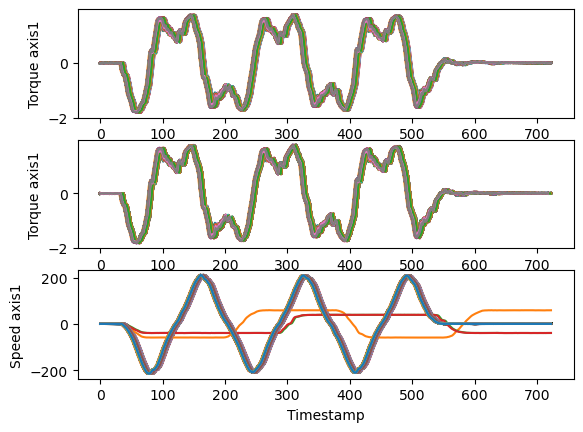

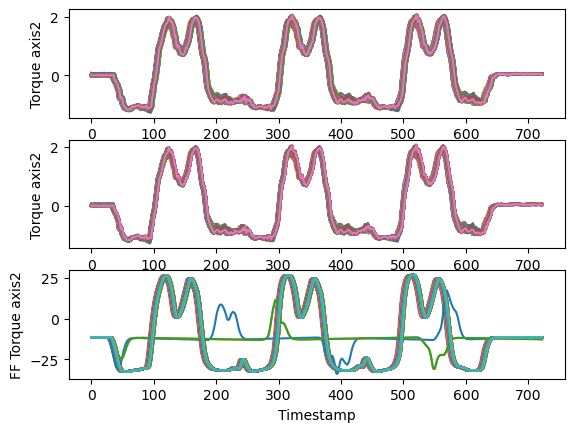

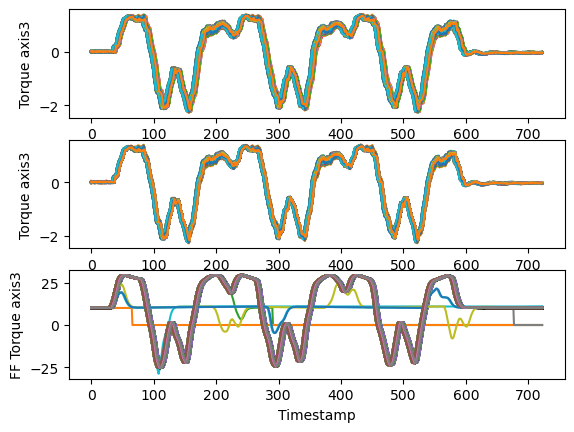

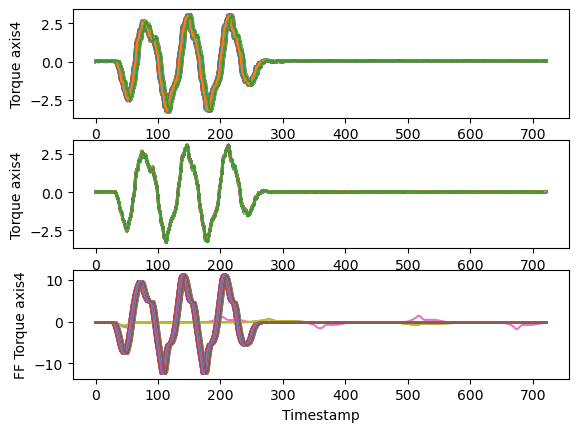

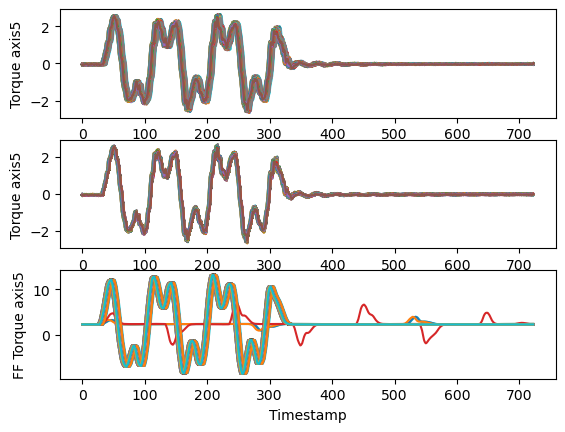

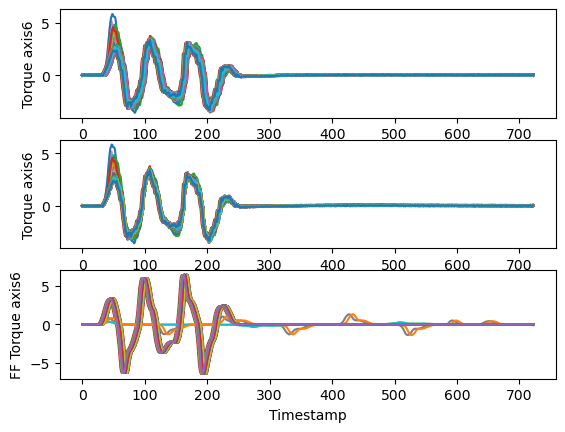

In [29]:
#Failure Case 2
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/1343-0024-56_DIAGDATA_20140822_185018__MCC.zip'
ref_FC2, mean_FC2, stv_FC2 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/MCCFiles'
RMS_Value_FC2,Stv_FC2,Impulse_factor_FC2,Shape_factor_FC2,torque_areaUnderSignal_FC2, torque_trimmedMean_FC2,torque_signalNoise_FC2, MAX_AMP_FC2 = generate_more_feature(File_path,ref_FC2, mean_FC2, stv_FC2)



In [33]:
RMS_Value_FC2 = RMS_Value_FC2.dropna(axis=0,how='any')
Stv_FC2 = Stv_FC2.dropna(axis=0,how='any')
torque_areaUnderSignal_FC2 = torque_areaUnderSignal_FC2.dropna(axis=0,how='any')
torque_trimmedMean_FC2 = torque_trimmedMean_FC2.dropna(axis=0,how='any')
torque_signalNoise_FC2 = torque_signalNoise_FC2.dropna(axis=0,how='any')
MAX_AMP_FC2 = MAX_AMP_FC2.dropna(axis=0,how='any')


In [34]:
RMS_Value_FC2 = RMS_Value_FC2.groupby(by='time').mean()
Stv_FC2 = Stv_FC2.groupby(by='time').mean()
torque_areaUnderSignal_FC2 = torque_areaUnderSignal_FC2.groupby(by='time').mean()
torque_trimmedMean_FC2 = torque_trimmedMean_FC2.groupby(by='time').mean()
torque_signalNoise_FC2 = torque_signalNoise_FC2.groupby(by='time').mean()
MAX_AMP_FC2 = MAX_AMP_FC2.groupby(by='time').mean()

In [36]:

torque_areaUnderSignal_FC2[0:50]


,axis1,axis2,axis3,axis4,axis5,axis6
time,,,,,,
2014-09-26,0.015946,0.018150,0.016609,0.009165,0.009720,0.003995
2014-10-29,0.054080,0.061065,0.050208,0.008392,0.001397,0.102831
2015-02-11,0.010258,0.018231,0.017847,0.019098,0.008196,0.012665
2015-02-12,0.008562,0.008768,0.002636,0.022316,0.001500,0.032136
2015-02-13,0.037204,0.046645,0.031456,0.006791,0.003871,0.069228
2015-02-14,0.005610,0.014042,0.013077,0.001159,0.006936,0.013381
2015-02-15,0.051205,0.058113,0.046213,0.005281,0.003743,0.091842
2015-02-16,0.014091,0.027886,0.019791,0.012239,0.009480,0.013246
2015-02-17,0.011958,0.016582,0.016073,0.024291,0.007615,0.006476


<AxesSubplot:xlabel='time'>

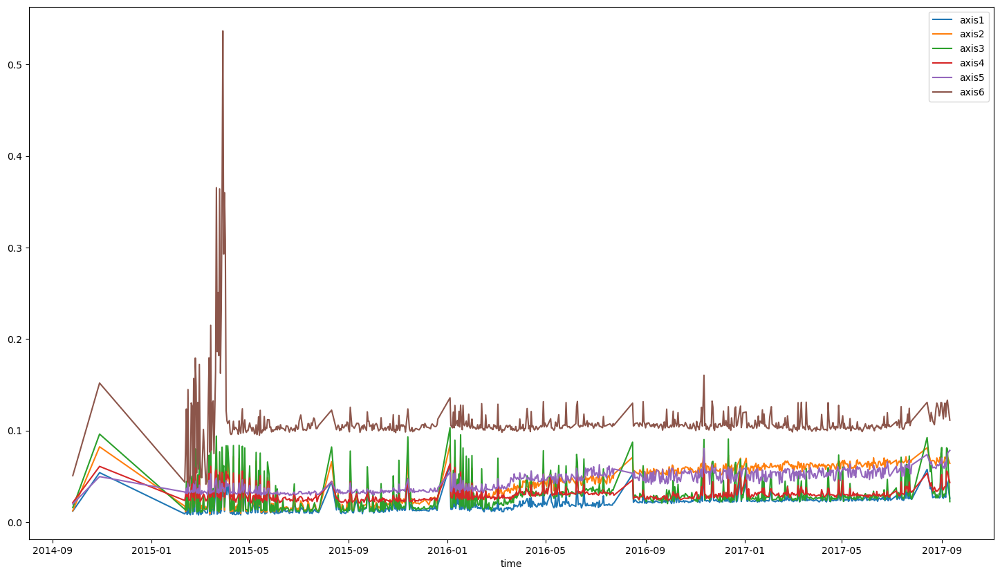

In [35]:

RMS_Value_FC2.plot(figsize=(18,10))


<AxesSubplot:xlabel='time'>

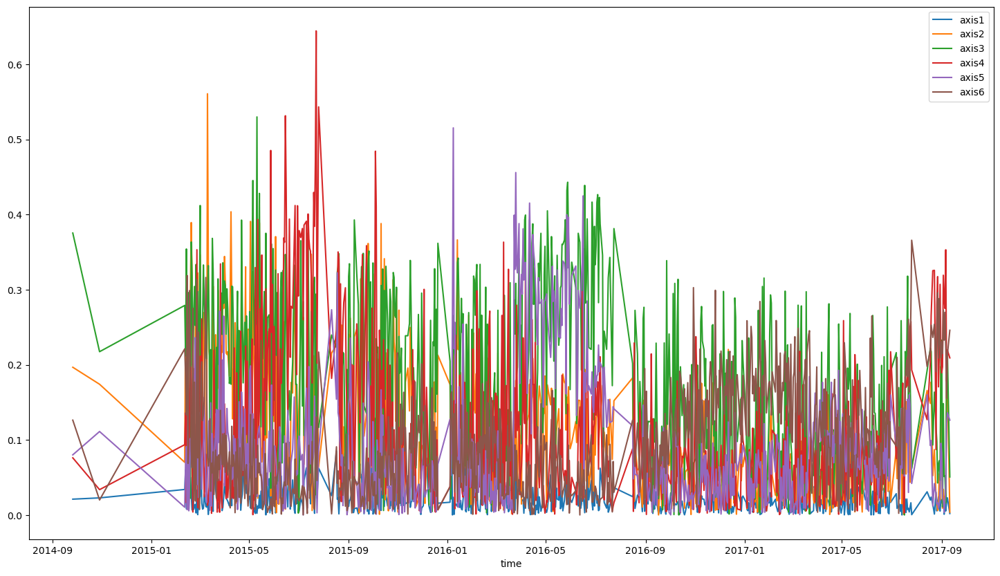

In [37]:
torque_signalNoise_FC2.plot(figsize=(18,10))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/04-64139_DIAGDATA_20170918_135452_3ece932f-a030-4c95-bd2c-e6d899ed8871_MCC.zip' mode='r'>


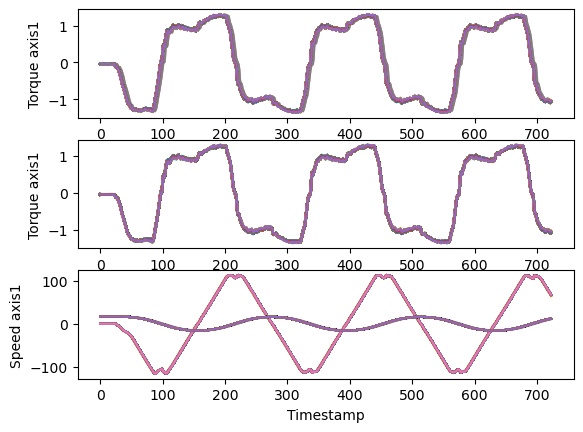

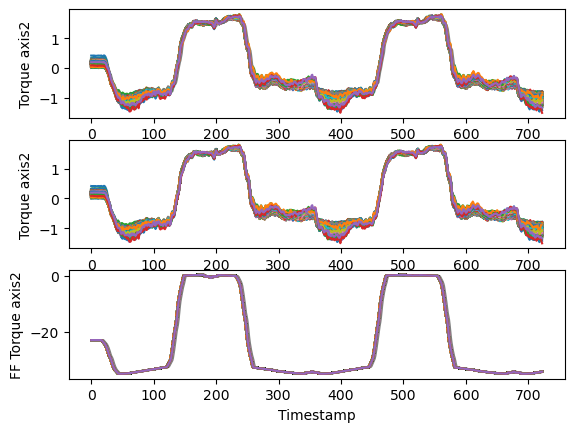

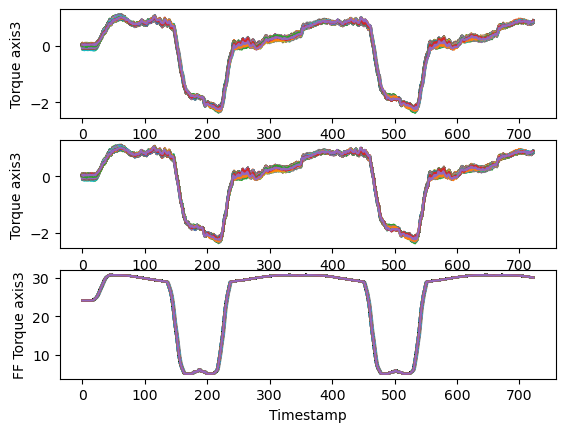

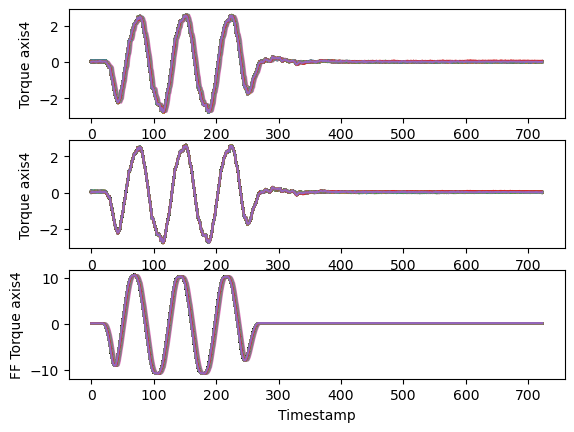

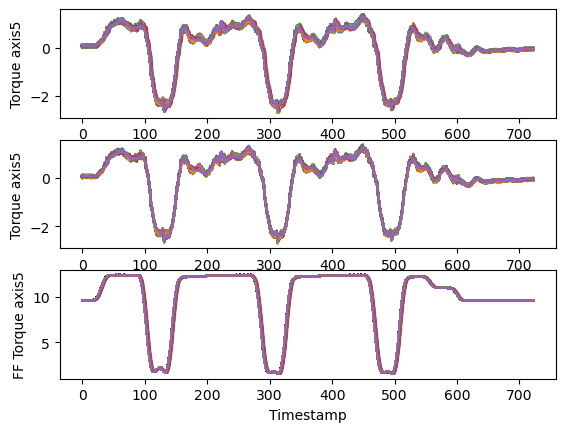

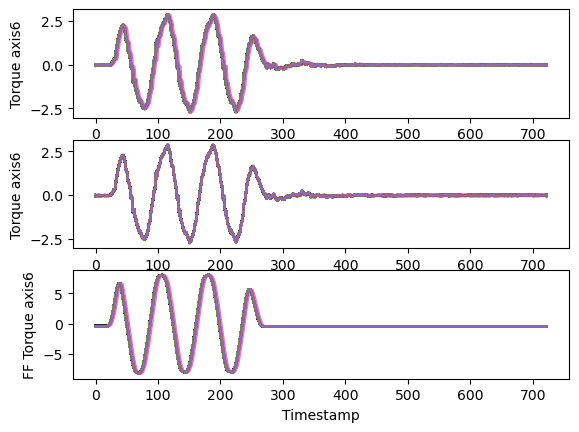

In [38]:
#Failure Case 10
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/04-64139_DIAGDATA_20170918_135452_3ece932f-a030-4c95-bd2c-e6d899ed8871_MCC.zip'
ref_FC10, mean_FC10, stv_FC10 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/MCC Flies'
RMS_Value_FC10,Stv_FC10,Impulse_factor_FC10,Shape_factor_FC10, torque_areaUnderSignal_FC10, torque_trimmedMean_FC10,torque_signalNoise_FC10, MAX_AMP_FC10  = generate_more_feature(File_path,ref_FC10, mean_FC10, stv_FC10)

In [39]:
RMS_Value_FC10 = RMS_Value_FC10.dropna(axis=0,how='any')
Stv_FC10 = Stv_FC10.dropna(axis=0,how='any')
torque_areaUnderSignal_FC10 = torque_areaUnderSignal_FC10.dropna(axis=0,how='any')
torque_trimmedMean_FC10 = torque_trimmedMean_FC10.dropna(axis=0,how='any')
torque_signalNoise_FC10 = torque_signalNoise_FC10.dropna(axis=0,how='any')
MAX_AMP_FC10 = MAX_AMP_FC10.dropna(axis=0,how='any')


In [40]:
RMS_Value_FC10 = RMS_Value_FC10.groupby(by='time').mean()
Stv_FC10 = Stv_FC10.groupby(by='time').mean()
torque_areaUnderSignal_FC10 = torque_areaUnderSignal_FC10.groupby(by='time').mean()
torque_trimmedMean_FC10 = torque_trimmedMean_FC10.groupby(by='time').mean()
torque_signalNoise_FC10 = torque_signalNoise_FC10.groupby(by='time').mean()
MAX_AMP_FC10 = MAX_AMP_FC10.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

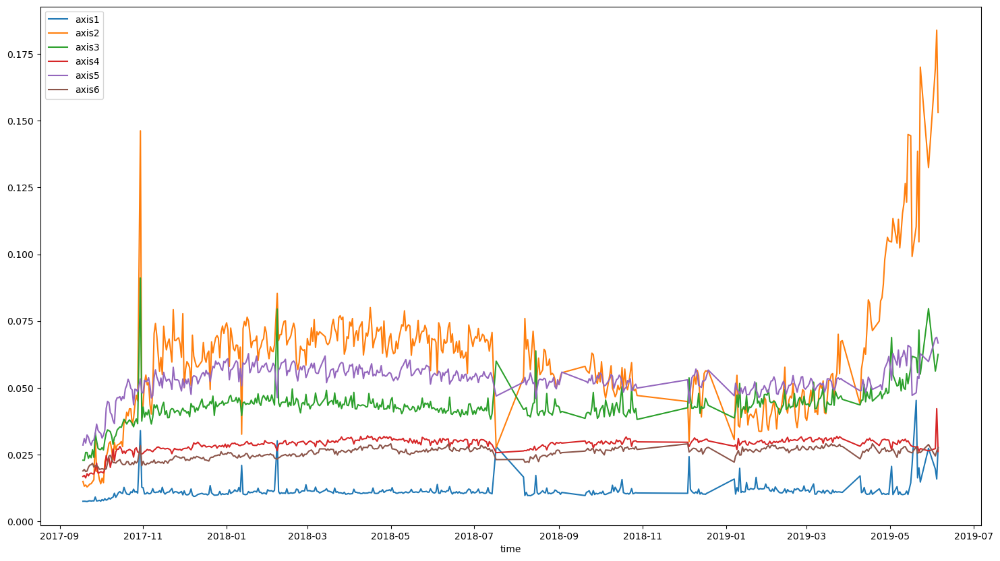

In [42]:
RMS_Value_FC10.plot(figsize=(18,10))

In [72]:
def generate_feature_update_reference(Filepath,ref,mean,stv):    
    File_path = Filepath
    ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    RMS_Value=pd.DataFrame(columns=columns)
    Skewness_value = pd.DataFrame(columns=columns)
    Kurtosis_value = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    Energy = pd.DataFrame(columns=columns)
    Stv = pd.DataFrame(columns=columns)
    Variance = pd.DataFrame(columns=columns)
    Impulse_factor = pd.DataFrame(columns=columns)
    Shape_factor = pd.DataFrame(columns=columns)
    MAX = pd.DataFrame(columns=columns)
    torque_areaUnderSignal = pd.DataFrame(columns=columns)
    torque_trimmedMean = pd.DataFrame(columns=columns)
    torque_signalNoise = pd.DataFrame(columns=columns)
    fig, (x1, x2, xf1) = plt.subplots(3)
    fig, (x3, x4, xf2) = plt.subplots(3)
    fig, (x5, x6, xf3) = plt.subplots(3)
    fig, (x7, x8, xf4) = plt.subplots(3)
    fig, (x9, x10, xf5) = plt.subplots(3)
    fig, (x11, x12, xf6) = plt.subplots(3)
    n = True
    i = 0
    drop = 0
    for loop_file in os.listdir(File_path):
        route = os.path.join(File_path,loop_file)

        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    #Set the index
                    date = header['date_time']
    #                 i = date.date()
                    #Read data
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    index = series.time_index
                    if ax1 in file:
                    # Extract features for axis1
                        d1 = standardized_torque(series.torque,mean[ax1], stv[ax1])
                        s1 = series.velocity
                        xf1.plot(s1)
                        
                        #ff_d1 = series.torque_ff
                        #xf1.plot(ff_d1)
                        xf1.set_xlabel('Timestamp')  
                        xf1.set_ylabel('Speed axis1')
                        d_m1, ref_m1,offset1 = cross_correlation(ref[ax1], d1) 
                        corr_1 = np.corrcoef(d_m1, ref_m1)
                        if abs(offset1) > 10 or corr_1[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False


                        torque_areaUnderSignal.loc[i, 'time'] = date.date()
                        torque_areaUnderSignal.loc[i, 'axis1'] = abs(np.trapz(abs(d_m1), dx = index[1] - index[0]) - np.trapz(abs(ref_m1), dx = index[1] - index[0]))

                        torque_trimmedMean.loc[i, 'time'] = date.date()
                        torque_trimmedMean.loc[i, 'axis1'] = abs(trimmedMean(d_m1)- trimmedMean(ref_m1))

                        torque_signalNoise.loc[i, 'time'] = date.date()
                        torque_signalNoise.loc[i, 'axis1'] = (d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0)

                        RMS_Value.loc[i, 'time'] = date.date()
                        RMS_Value.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)

                        Skewness_value.loc[i, 'time'] = date.date()
                        Skewness_value.loc[i, 'axis1'] = feature.skewness(d_m1-ref_m1)

                        Kurtosis_value.loc[i, 'time'] = date.date()
                        Kurtosis_value.loc[i, 'axis1'] = feature.kurtosis(d_m1-ref_m1)

                        Energy.loc[i, 'time'] = date.date()
                        Energy.loc[i, 'axis1'] = feature.abs_energy(d_m1-ref_m1)

                        Stv.loc[i, 'time'] = date.date()
                        Stv.loc[i, 'axis1'] = (d_m1-ref_m1).std(ddof=0)

                        Variance.loc[i, 'time'] = date.date()
                        Variance.loc[i, 'axis1'] = (d_m1-ref_m1).var()

                        Impulse_factor.loc[i, 'time'] = date.date()
                        Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                        Shape_factor.loc[i, 'time'] = date.date()
                        Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
                        
                        MAX_AMP.loc[i, 'time'] = date.date()
                        MAX_AMP.loc[i, 'axis1'] = torque_fftFeatures_maxamplitude(d_m1-ref_m1)

                        x1.plot(d1)
                        x2.plot(d_m1)
                        x1.set_xlabel('Timestamp')  
                        x1.set_ylabel('Torque axis1')
                        x2.set_xlabel('Timestamp')  
                        x2.set_ylabel('Torque axis1')


                    elif ax2 in file:
                    # Extract features for axis2
                        ff_d2 = series.torque_ff
                        xf2.plot(ff_d2)
                        xf2.set_xlabel('Timestamp')  
                        xf2.set_ylabel('FF Torque axis2')

                        d2 = standardized_torque(series.torque,mean[ax2], stv[ax2])
                        d_m2, ref_m2, offset2 = cross_correlation(ref[ax2], d2)
                        corr_2 = np.corrcoef(d_m2, ref_m2)
                        
                        if abs(offset2) > 10 or corr_2[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False
                        else:

                            x3.plot(d2)
                            x4.plot(d_m2)
                            x3.set_xlabel('Timestamp')  
                            x3.set_ylabel('Torque axis2')
                            x4.set_xlabel('Timestamp')  
                            x4.set_ylabel('Torque axis2')
                            torque_areaUnderSignal.loc[i, 'axis2'] = abs(np.trapz(abs(d_m2), dx = index[1] - index[0]) - np.trapz(abs(ref_m2), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis2'] = abs(trimmedMean(d_m2)- trimmedMean(ref_m2))
                            torque_signalNoise.loc[i, 'axis2'] = (d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0)
                            RMS_Value.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)
                            Skewness_value.loc[i, 'axis2'] = feature.skewness(d_m2-ref_m2)
                            Kurtosis_value.loc[i, 'axis2'] = feature.kurtosis(d_m2-ref_m2)
                            Energy.loc[i, 'axis2'] = feature.abs_energy(d_m2-ref_m2)
                            Stv.loc[i, 'axis2'] = (d_m2-ref_m2).std(ddof=0)
                            Variance.loc[i, 'axis2'] = (d_m2-ref_m2).var()
                            Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            Shape_factor.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            MAX_AMP.loc[i, 'axis2'] = torque_fftFeatures_maxamplitude(d_m2-ref_m2)
                            
                    elif ax3 in file:
                    # Extract features for axis3
                        ff_d3 = series.torque_ff
                        xf3.plot(ff_d3)
                        xf3.set_xlabel('Timestamp')  
                        xf3.set_ylabel('FF Torque axis3')
                        d3 = standardized_torque(series.torque,mean[ax3], stv[ax3])
                        d_m3, ref_m3,offset3 = cross_correlation(ref[ax3], d3)
                        corr_3 = np.corrcoef(d_m3, ref_m3)
                        
                        if abs(offset3) > 10 or corr_3[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False
                        else:
                            
                            x5.plot(d3)
                            x6.plot(d_m3)
                            x5.set_xlabel('Timestamp')  
                            x5.set_ylabel('Torque axis3')
                            x6.set_xlabel('Timestamp')  
                            x6.set_ylabel('Torque axis3')
                            torque_areaUnderSignal.loc[i, 'axis3'] = abs(np.trapz(abs(d_m3), dx = index[1] - index[0]) - np.trapz(abs(ref_m3), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis3'] = abs(trimmedMean(d_m3)- trimmedMean(ref_m3))
                            torque_signalNoise.loc[i, 'axis3'] = (d_m3-ref_m3).mean()/(d_m3-ref_m3).std(ddof=0)
                            RMS_Value.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)
                            Skewness_value.loc[i, 'axis3'] = feature.skewness(d_m3-ref_m3)
                            Kurtosis_value.loc[i, 'axis3'] = feature.kurtosis(d_m3-ref_m3)
                            Stv.loc[i, 'axis3'] = (d_m3-ref_m3).std(ddof=0)
                            Variance.loc[i, 'axis3'] = (d_m3-ref_m3).var()
                            Energy.loc[i, 'axis3'] = feature.abs_energy(d_m3-ref_m3)
                            Impulse_factor.loc[i, 'axis3'] = max(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            Shape_factor.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            MAX_AMP.loc[i, 'axis3'] = torque_fftFeatures_maxamplitude(d_m3-ref_m3)
                    elif ax4 in file:
                    # Extract features for axis4
                        ff_d4 = series.torque_ff
                        xf4.plot(ff_d4)
                        xf4.set_xlabel('Timestamp')  
                        xf4.set_ylabel('FF Torque axis4')
                        d4 = standardized_torque(series.torque,mean[ax4], stv[ax4])
                        d_m4, ref_m4, offset4 = cross_correlation(ref[ax4], d4)
                        corr_4 = np.corrcoef(d_m4, ref_m4)
                        if abs(offset4) > 10 or corr_4[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False
                        else:
                            x7.plot(d4)

                            x8.plot(d_m4)
                            x7.set_xlabel('Timestamp')  
                            x7.set_ylabel('Torque axis4')
                            x8.set_xlabel('Timestamp')  
                            x8.set_ylabel('Torque axis4')
                            torque_areaUnderSignal.loc[i, 'axis4'] = abs(np.trapz(abs(d_m4), dx = index[1] - index[0]) - np.trapz(abs(ref_m4), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis4'] = abs(trimmedMean(d_m4)- trimmedMean(ref_m4))
                            torque_signalNoise.loc[i, 'axis4'] = (d_m4-ref_m4).mean()/(d_m4-ref_m4).std(ddof=0)
                            RMS_Value.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)
                            Skewness_value.loc[i, 'axis4'] = feature.skewness(d_m4-ref_m4)
                            Kurtosis_value.loc[i, 'axis4'] = feature.kurtosis(d_m4-ref_m4)
                            Energy.loc[i, 'axis4'] = feature.abs_energy(d_m4-ref_m4)
                            Stv.loc[i, 'axis4'] = (d_m4-ref_m4).std(ddof=0)
                            Variance.loc[i, 'axis4'] = (d_m4-ref_m4).var()
                            Impulse_factor.loc[i, 'axis4'] = max(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            Shape_factor.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            MAX_AMP.loc[i, 'axis4'] = torque_fftFeatures_maxamplitude(d_m4-ref_m4)
                    elif ax5 in file:
                    # Extract features for axis5
                        ff_d5 = series.torque_ff
                        xf5.plot(ff_d5)
                        xf5.set_xlabel('Timestamp')  
                        xf5.set_ylabel('FF Torque axis5')
                        d5 = standardized_torque(series.torque,mean[ax5], stv[ax5])
                        d_m5, ref_m5,offset5 = cross_correlation(ref[ax5], d5)
                        corr_5 = np.corrcoef(d_m5, ref_m5)
                        if abs(offset5) > 10 or corr_5[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False
                        else:
                            x9.plot(d5)
                            x10.plot(d_m5)
                            x9.set_xlabel('Timestamp')  
                            x9.set_ylabel('Torque axis5')
                            x10.set_xlabel('Timestamp')  
                            x10.set_ylabel('Torque axis5')
                            torque_areaUnderSignal.loc[i, 'axis5'] = abs(np.trapz(abs(d_m5), dx = index[1] - index[0]) - np.trapz(abs(ref_m5), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis5'] = abs(trimmedMean(d_m5)- trimmedMean(ref_m5))
                            torque_signalNoise.loc[i, 'axis5'] = (d_m5-ref_m5).mean()/(d_m5-ref_m5).std(ddof=0)
                            RMS_Value.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)
                            Skewness_value.loc[i, 'axis5'] = feature.skewness(d_m5-ref_m5)
                            Kurtosis_value.loc[i, 'axis5'] = feature.kurtosis(d_m5-ref_m5)
                            Energy.loc[i, 'axis5'] = feature.abs_energy(d_m5-ref_m5)
                            Stv.loc[i, 'axis5'] = (d_m5-ref_m5).std(ddof=0)
                            Variance.loc[i, 'axis5'] = (d_m5-ref_m5).var()
                            Impulse_factor.loc[i, 'axis5'] = max(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            Shape_factor.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            MAX_AMP.loc[i, 'axis5'] = torque_fftFeatures_maxamplitude(d_m5-ref_m5)
                    elif ax6 in file:
                    # Extract features for axis6
                        ff_d6 = series.torque_ff
                        xf6.plot(ff_d6)
                        xf6.set_xlabel('Timestamp')  
                        xf6.set_ylabel('FF Torque axis6')
                        d6 = standardized_torque(series.torque,mean[ax6], stv[ax6])
                        d_m6, ref_m6,offset6 = cross_correlation(ref[ax6], d6)
                        corr_6 = np.corrcoef(d_m6, ref_m6)
                        
                        if abs(offset6) > 10 or corr_6[0,1] <0.99:
                            if n == True:
                                ref, mean, stv = process_file(route)
                                drop = i
                                n = False
                        else:
                            
                            x11.plot(d6)
                            x12.plot(d_m6)
                            x11.set_xlabel('Timestamp')  
                            x11.set_ylabel('Torque axis6')
                            x12.set_xlabel('Timestamp')  
                            x12.set_ylabel('Torque axis6')
                            torque_areaUnderSignal.loc[i, 'axis6'] = abs(np.trapz(abs(d_m6), dx = index[1] - index[0]) - np.trapz(abs(ref_m6), dx = index[1] - index[0])) 
                            torque_trimmedMean.loc[i, 'axis6'] = abs(trimmedMean(d_m6)- trimmedMean(ref_m6))
                            torque_signalNoise.loc[i, 'axis6'] = (d_m6-ref_m6).mean()/(d_m6-ref_m6).std(ddof=0)
                            RMS_Value.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)
                            Skewness_value.loc[i, 'axis6'] = feature.skewness(d_m6-ref_m6)
                            Kurtosis_value.loc[i, 'axis6'] = feature.kurtosis(d_m6-ref_m6)
                            Energy.loc[i, 'axis6'] = feature.abs_energy(d_m6-ref_m6)
                            Stv.loc[i, 'axis6'] = (d_m6-ref_m6).std(ddof=0)
                            Variance.loc[i, 'axis6'] = (d_m6-ref_m6).var()
                            Impulse_factor.loc[i, 'axis6'] = max(d_m6-ref_m6)/feature.mean(d_m6-ref_m6)
                            Shape_factor.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)/abs(feature.mean(d_m6-ref_m6))
                            MAX_AMP.loc[i, 'axis6'] = torque_fftFeatures_maxamplitude(d_m6-ref_m6)
        i = i + 1
    return RMS_Value,Stv,Impulse_factor,Shape_factor,torque_areaUnderSignal, torque_trimmedMean, torque_signalNoise, MAX_AMP
               

In [43]:
def generate_feature_refresh_reference(Filepath,ref,mean,stv, refresh_date):    
    File_path = Filepath
    ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    RMS_Value=pd.DataFrame(columns=columns)
    Skewness_value = pd.DataFrame(columns=columns)
    Kurtosis_value = pd.DataFrame(columns=columns)
    
    Energy = pd.DataFrame(columns=columns)
    Stv = pd.DataFrame(columns=columns)
    Variance = pd.DataFrame(columns=columns)
    Impulse_factor = pd.DataFrame(columns=columns)
    Shape_factor = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    torque_areaUnderSignal = pd.DataFrame(columns=columns)
    torque_trimmedMean = pd.DataFrame(columns=columns)
    torque_signalNoise = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    NTEST = 0
    OFFSET2 = []
    CORR2 = []
    fig, x1 = plt.subplots()
    i = 0
    for loop_file in os.listdir(File_path):
        route = os.path.join(File_path,loop_file)

        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    #Set the index
                    date = header['date_time']
                    DATE = date.date()
                    #Read data
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    index = series.time_index
                    if DATE == refresh_date:
                        ref, mean, stv = process_file(route)
                        NTEST = i
                        break


                    else:
                        if ax1 in file:
                        # Extract features for axis1
                            d1 = standardized_torque(series.torque,mean[ax1], stv[ax1])
                            d_m1, ref_m1,offset1 = cross_correlation(ref[ax1], d1) 
#                             OFFSET1.append(offset1)
                            corr_1 = np.corrcoef(d_m1, ref_m1)

                            if abs(offset1) > 10 or corr_1[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'time'] = date.date()
                                torque_areaUnderSignal.loc[i, 'axis1'] = abs(np.trapz(abs(d_m1), dx = index[1] - index[0]) - np.trapz(abs(ref_m1), dx = index[1] - index[0]))

                                torque_trimmedMean.loc[i, 'time'] = date.date()
                                torque_trimmedMean.loc[i, 'axis1'] = abs(trimmedMean(d_m1)- trimmedMean(ref_m1))

                                torque_signalNoise.loc[i, 'time'] = date.date()
                                torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))

                                RMS_Value.loc[i, 'time'] = date.date()
                                RMS_Value.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)

                                Skewness_value.loc[i, 'time'] = date.date()
                                Skewness_value.loc[i, 'axis1'] = feature.skewness(d_m1-ref_m1)

                                Kurtosis_value.loc[i, 'time'] = date.date()
                                Kurtosis_value.loc[i, 'axis1'] = feature.kurtosis(d_m1-ref_m1)

                                Energy.loc[i, 'time'] = date.date()
                                Energy.loc[i, 'axis1'] = feature.abs_energy(d_m1-ref_m1)

                                Stv.loc[i, 'time'] = date.date()
                                Stv.loc[i, 'axis1'] = (d_m1-ref_m1).std(ddof=0)

                                Variance.loc[i, 'time'] = date.date()
                                Variance.loc[i, 'axis1'] = (d_m1-ref_m1).var()

                                Impulse_factor.loc[i, 'time'] = date.date()
                                Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                                Shape_factor.loc[i, 'time'] = date.date()
                                Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                                MAX_AMP.loc[i, 'time'] = date.date()
                                MAX_AMP.loc[i, 'axis1'] = torque_fftFeatures_maxamplitude(d_m1-ref_m1)


                        elif ax2 in file:
                        # Extract features for axis2

                            d2 = standardized_torque(series.torque,mean[ax2], stv[ax2])
                            d_m2, ref_m2, offset2 = cross_correlation(ref[ax2], d2)
                            OFFSET2.append(offset2)
                            corr_2 = np.corrcoef(d_m2, ref_m2)
                            
                            if abs(offset2) > 10 or corr_2[0,1] <0.99:
                                continue
                            else:
    
                                torque_areaUnderSignal.loc[i, 'axis2'] = abs(np.trapz(abs(d_m2), axis = -1, dx = index[1] - index[0]) - np.trapz(abs(ref_m2), axis = -1, dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis2'] = abs(trimmedMean(d_m2)- trimmedMean(ref_m2))
                                torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
                                RMS_Value.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)
                                Skewness_value.loc[i, 'axis2'] = feature.skewness(d_m2-ref_m2)
                                Kurtosis_value.loc[i, 'axis2'] = feature.kurtosis(d_m2-ref_m2)
                                Energy.loc[i, 'axis2'] = feature.abs_energy(d_m2-ref_m2)
                                Stv.loc[i, 'axis2'] = (d_m2-ref_m2).std(ddof=0)
                                Variance.loc[i, 'axis2'] = (d_m2-ref_m2).var()
                                Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                                Shape_factor.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                                MAX_AMP.loc[i, 'axis2'] = torque_fftFeatures_maxamplitude(d_m2-ref_m2)
                                if i >200 and i < 210:
                                    x1.plot(ref_m2, 'b')
                                    x1.plot(d_m2, 'g')
                                    x1.set_xlabel('Timestamp')  
                                    x1.set_ylabel('Torque axis4')
                                


                        elif ax3 in file:
                        # Extract features for axis3
                            d3 = standardized_torque(series.torque,mean[ax3], stv[ax3])
                            d_m3, ref_m3,offset3 = cross_correlation(ref[ax3], d3)
                            corr_3 = np.corrcoef(d_m3, ref_m3)

                            if abs(offset3) > 10 or corr_3[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis3'] = abs(np.trapz(abs(d_m3), dx = index[1] - index[0]) - np.trapz(abs(ref_m3), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis3'] = abs(trimmedMean(d_m3)- trimmedMean(ref_m3))
                                torque_signalNoise.loc[i, 'axis3'] = abs((d_m3-ref_m3).mean()/(d_m3-ref_m3).std(ddof=0))
                                RMS_Value.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)
                                Skewness_value.loc[i, 'axis3'] = feature.skewness(d_m3-ref_m3)
                                Kurtosis_value.loc[i, 'axis3'] = feature.kurtosis(d_m3-ref_m3)
                                Stv.loc[i, 'axis3'] = (d_m3-ref_m3).std(ddof=0)
                                Variance.loc[i, 'axis3'] = (d_m3-ref_m3).var()
                                Energy.loc[i, 'axis3'] = feature.abs_energy(d_m3-ref_m3)
                                Impulse_factor.loc[i, 'axis3'] = max(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                                Shape_factor.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                                MAX_AMP.loc[i, 'axis3'] = torque_fftFeatures_maxamplitude(d_m3-ref_m3)                        

                        elif ax4 in file:
                        # Extract features for axis4
                            d4 = standardized_torque(series.torque,mean[ax4], stv[ax4])
                            d_m4, ref_m4, offset4 = cross_correlation(ref[ax4], d4)
                            corr_4 = np.corrcoef(d_m4, ref_m4)
                            if abs(offset4) > 10 or corr_4[0,1] < 0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis4'] = abs(np.trapz(abs(d_m4), dx = index[1] - index[0]) - np.trapz(abs(ref_m4), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis4'] = abs(trimmedMean(d_m4)- trimmedMean(ref_m4))
                                torque_signalNoise.loc[i, 'axis4'] = abs((d_m4-ref_m4).mean()/(d_m4-ref_m4).std(ddof=0))
                                RMS_Value.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)
                                Skewness_value.loc[i, 'axis4'] = feature.skewness(d_m4-ref_m4)
                                Kurtosis_value.loc[i, 'axis4'] = feature.kurtosis(d_m4-ref_m4)
                                Energy.loc[i, 'axis4'] = feature.abs_energy(d_m4-ref_m4)
                                Stv.loc[i, 'axis4'] = (d_m4-ref_m4).std(ddof=0)
                                Variance.loc[i, 'axis4'] = (d_m4-ref_m4).var()
                                Impulse_factor.loc[i, 'axis4'] = max(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                                Shape_factor.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                                MAX_AMP.loc[i, 'axis4'] = torque_fftFeatures_maxamplitude(d_m4-ref_m4) 

                        elif ax5 in file:
                        # Extract features for axis5
                            d5 = standardized_torque(series.torque,mean[ax5], stv[ax5])
                            d_m5, ref_m5,offset5 = cross_correlation(ref[ax5], d5)
                            corr_5 = np.corrcoef(d_m5, ref_m5)
                            CORR2.append(corr_5)
                            if abs(offset5) > 10 or corr_5[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis5'] = abs(np.trapz(abs(d_m5), dx = index[1] - index[0]) - np.trapz(abs(ref_m5), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis5'] = abs(trimmedMean(d_m5)- trimmedMean(ref_m5))
                                torque_signalNoise.loc[i, 'axis5'] = abs((d_m5-ref_m5).mean()/(d_m5-ref_m5).std(ddof=0))
                                RMS_Value.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)
                                Skewness_value.loc[i, 'axis5'] = feature.skewness(d_m5-ref_m5)
                                Kurtosis_value.loc[i, 'axis5'] = feature.kurtosis(d_m5-ref_m5)
                                Energy.loc[i, 'axis5'] = feature.abs_energy(d_m5-ref_m5)
                                Stv.loc[i, 'axis5'] = (d_m5-ref_m5).std(ddof=0)
                                Variance.loc[i, 'axis5'] = (d_m5-ref_m5).var()
                                Impulse_factor.loc[i, 'axis5'] = max(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                                Shape_factor.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                                MAX_AMP.loc[i, 'axis5'] = torque_fftFeatures_maxamplitude(d_m5-ref_m5)         

                        elif ax6 in file:
                        # Extract features for axis6
                            d6 = standardized_torque(series.torque,mean[ax6], stv[ax6])
                            d_m6, ref_m6,offset6 = cross_correlation(ref[ax6], d6)
                            corr_6 = np.corrcoef(d_m6, ref_m6)

                            if abs(offset6) > 10 or corr_6[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis6'] = abs(np.trapz(abs(d_m6), dx = index[1] - index[0]) - np.trapz(abs(ref_m6), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis6'] = abs(trimmedMean(d_m6)- trimmedMean(ref_m6))
                                torque_signalNoise.loc[i, 'axis6'] = abs((d_m6-ref_m6).mean()/(d_m6-ref_m6).std(ddof=0))
                                RMS_Value.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)
                                Skewness_value.loc[i, 'axis6'] = feature.skewness(d_m6-ref_m6)
                                Kurtosis_value.loc[i, 'axis6'] = feature.kurtosis(d_m6-ref_m6)
                                Energy.loc[i, 'axis6'] = feature.abs_energy(d_m6-ref_m6)
                                Stv.loc[i, 'axis6'] = (d_m6-ref_m6).std(ddof=0)
                                Variance.loc[i, 'axis6'] = (d_m6-ref_m6).var()
                                Impulse_factor.loc[i, 'axis6'] = max(d_m6-ref_m6)/feature.mean(d_m6-ref_m6)
                                Shape_factor.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)/abs(feature.mean(d_m6-ref_m6))
                                MAX_AMP.loc[i, 'axis6'] = torque_fftFeatures_maxamplitude(d_m6-ref_m6)                        
                            
        i = i + 1
    return RMS_Value,Stv,Impulse_factor,Shape_factor,torque_areaUnderSignal, torque_trimmedMean, torque_signalNoise, MAX_AMP, NTEST, CORR2
               

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/1426-0051-56_DIAGDATA_20151016_090000__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/MCCFiles\\1426-0051-56_DIAGDATA_20151224_070044__MCC.zip' mode='r'>


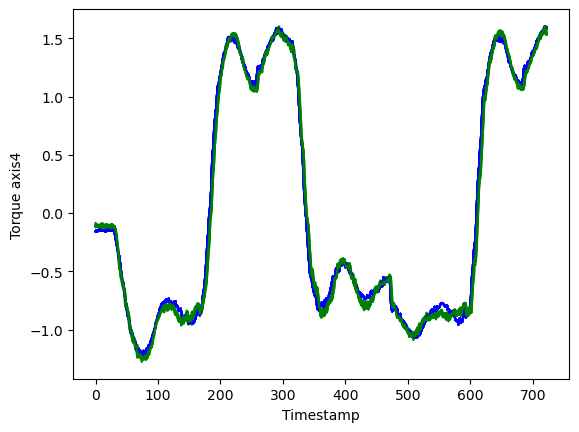

In [44]:
date_FC1 = date(2015, 12, 24)
#Failure Case 1

file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/1426-0051-56_DIAGDATA_20151016_090000__MCC.zip'
ref_FC1, mean_FC1, stv_FC1 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/MCCFiles'
RMS_Value_FC1,Stv_FC1,Impulse_factor_FC1,Shape_factor_FC1,torque_areaUnderSignal_FC1, torque_trimmedMean_FC1,torque_signalNoise_FC1, MAX_AMP_FC1, drop_F1, CORR1 = generate_feature_refresh_reference(File_path,ref_FC1, mean_FC1, stv_FC1, date_FC1)

In [47]:
RMS_Value_FC1 = RMS_Value_FC1.dropna(axis=0,how='any')
Stv_FC1 = Stv_FC1.dropna(axis=0,how='any')
torque_areaUnderSignal_FC1 = torque_areaUnderSignal_FC1.dropna(axis=0,how='any')
torque_trimmedMean_FC1 = torque_trimmedMean_FC1.dropna(axis=0,how='any')
torque_signalNoise_FC1 = torque_signalNoise_FC1.dropna(axis=0,how='any')
MAX_AMP_FC1 = MAX_AMP_FC1.dropna(axis=0,how='any')



In [48]:
RMS_Value_FC1 = RMS_Value_FC1.groupby(by='time').mean()
Stv_FC1 = Stv_FC1.groupby(by='time').mean()
torque_areaUnderSignal_FC1 = torque_areaUnderSignal_FC1.groupby(by='time').mean()
torque_trimmedMean_FC1 = torque_trimmedMean_FC1.groupby(by='time').mean()
torque_signalNoise_FC1 = torque_signalNoise_FC1.groupby(by='time').mean()
MAX_AMP_FC1 = MAX_AMP_FC1.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

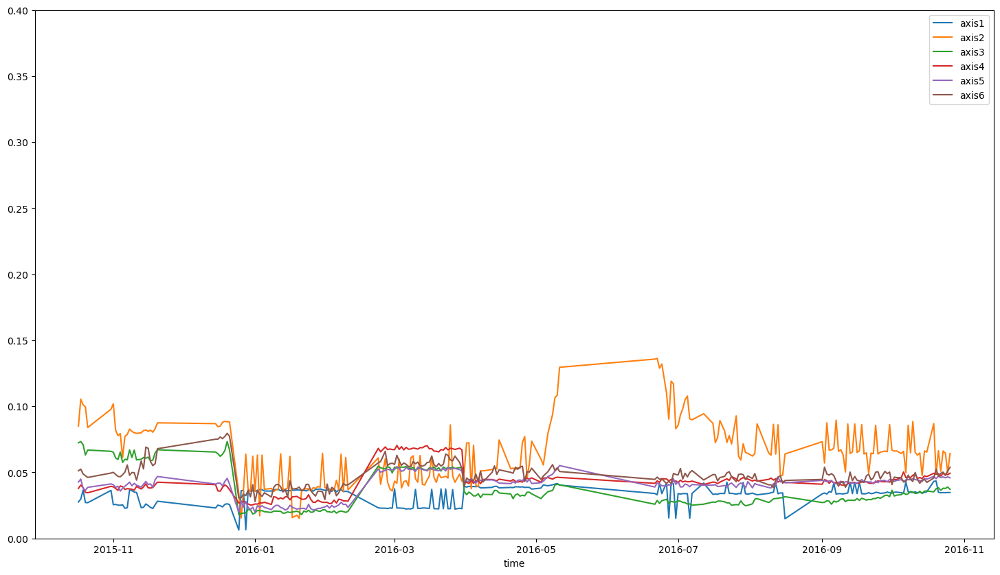

In [49]:


RMS_Value_FC1.plot(figsize=(18,10), ylim =(0,0.4))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles\\1218-0079-56_DIAGDATA_20150821_082242__MCC.zip' mode='r'>


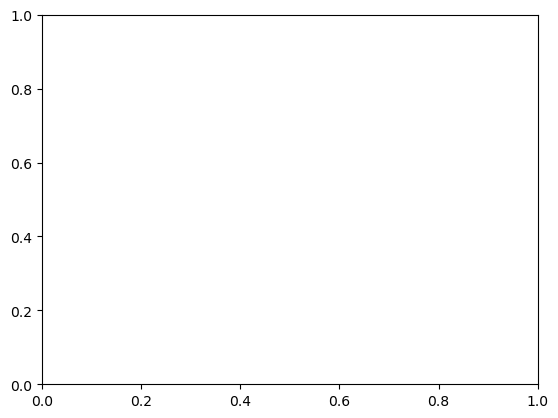

In [391]:
#Failure Case 6
date_FC6 = date(2015, 8, 21)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip'
ref_FC6, mean_FC6, stv_FC6 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles'
RMS_Value_FC6,Stv_FC6,Impulse_factor_FC6,Shape_factor_FC6,torque_areaUnderSignal_FC6, torque_trimmedMean_FC6,torque_signalNoise_FC6, MAX_AMP_FC6, drop_FC6, CORR6 = generate_feature_refresh_reference(File_path,ref_FC6, mean_FC6, stv_FC6, date_FC6)

In [339]:
CORR6[50:]

[array([[1.        , 0.99434304],
        [0.99434304, 1.        ]]),
 array([[1.        , 0.99505025],
        [0.99505025, 1.        ]]),
 array([[1.        , 0.99523854],
        [0.99523854, 1.        ]]),
 array([[1.        , 0.99118401],
        [0.99118401, 1.        ]]),
 array([[1.       , 0.9779173],
        [0.9779173, 1.       ]]),
 array([[1.        , 0.99582809],
        [0.99582809, 1.        ]]),
 array([[1.       , 0.9970016],
        [0.9970016, 1.       ]]),
 array([[1.        , 0.99607836],
        [0.99607836, 1.        ]]),
 array([[1.       , 0.9956359],
        [0.9956359, 1.       ]]),
 array([[1.        , 0.99597142],
        [0.99597142, 1.        ]]),
 array([[1.        , 0.99626837],
        [0.99626837, 1.        ]]),
 array([[1.        , 0.99544948],
        [0.99544948, 1.        ]]),
 array([[1.        , 0.99528185],
        [0.99528185, 1.        ]]),
 array([[1.        , 0.99551176],
        [0.99551176, 1.        ]]),
 array([[1.        , 0.99535457]

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip' mode='r'>


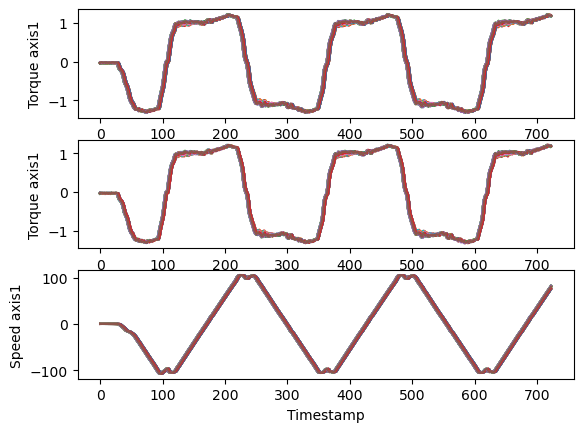

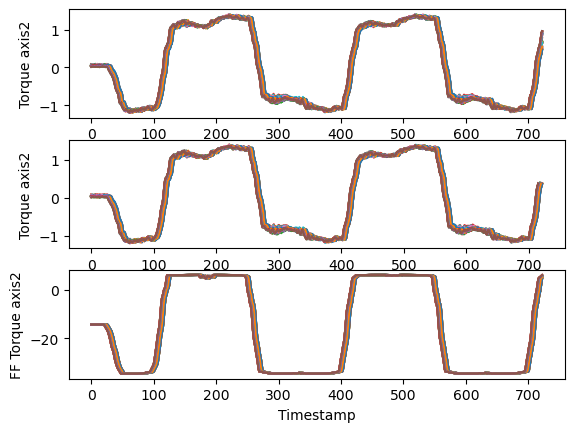

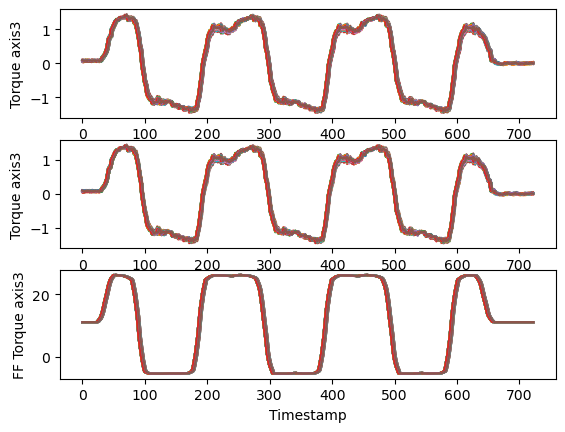

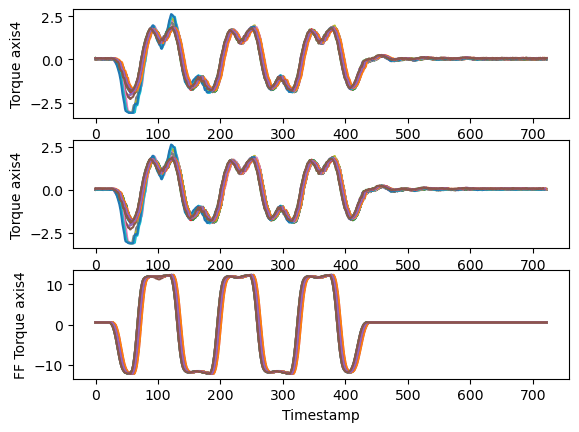

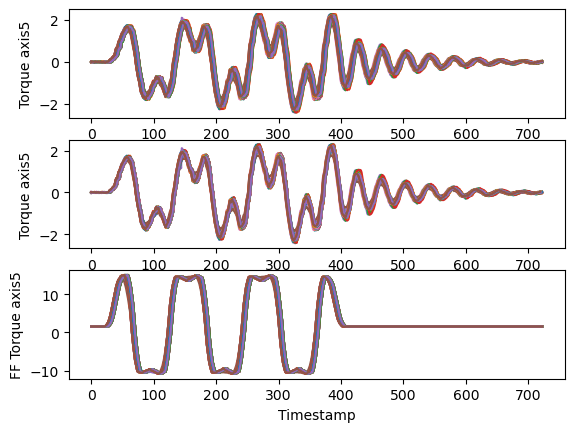

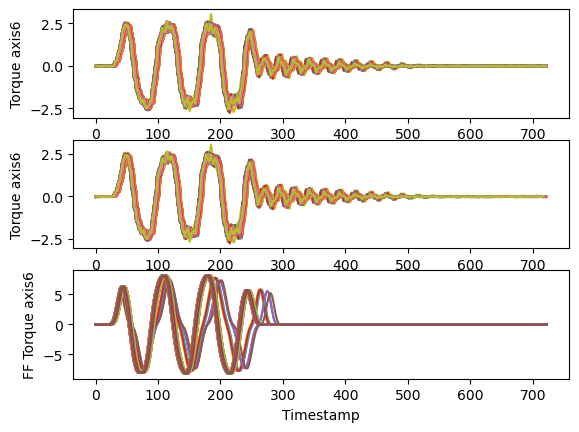

In [50]:
#Failure Case 6
date_FC6 = date(2015, 9, 4)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip'
ref_FC6, mean_FC6, stv_FC6 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles'
RMS_Value_FC6,Stv_FC6,Impulse_factor_FC6,Shape_factor_FC6,torque_areaUnderSignal_FC6, torque_trimmedMean_FC6,torque_signalNoise_FC6, MAX_AMP_FC6 = generate_more_feature(File_path,ref_FC6, mean_FC6, stv_FC6)

In [52]:
RMS_Value_FC6 = RMS_Value_FC6.dropna(axis=0,how='any')
Stv_FC6 = Stv_FC6.dropna(axis=0,how='any')
torque_areaUnderSignal_FC6 = torque_areaUnderSignal_FC6.dropna(axis=0,how='any')
torque_trimmedMean_FC6 = torque_trimmedMean_FC6.dropna(axis=0,how='any')
torque_signalNoise_FC6 = torque_signalNoise_FC6.dropna(axis=0,how='any')
MAX_AMP_FC6 = MAX_AMP_FC6.dropna(axis=0,how='any')

In [53]:
RMS_Value_FC6 = RMS_Value_FC6.groupby(by='time').mean()
Stv_FC6 = Stv_FC6.groupby(by='time').mean()
torque_areaUnderSignal_FC6 = torque_areaUnderSignal_FC6.groupby(by='time').mean()
torque_trimmedMean_FC6 = torque_trimmedMean_FC6.groupby(by='time').mean()
torque_signalNoise_FC6 = torque_signalNoise_FC6.groupby(by='time').mean()
MAX_AMP_FC6 = MAX_AMP_FC6.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

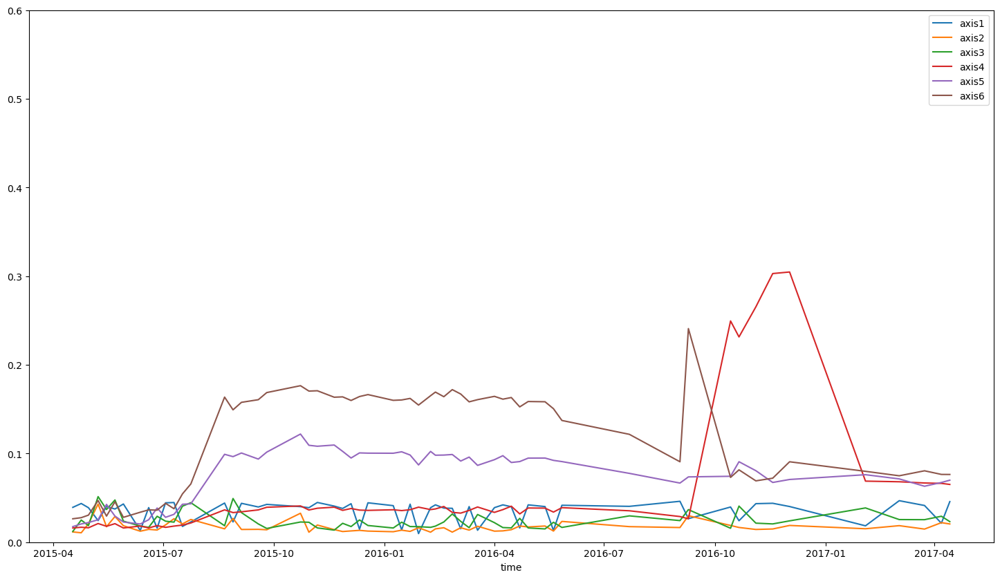

In [56]:
RMS_Value_FC6.plot(figsize=(18,10), ylim = (0,0.6))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>


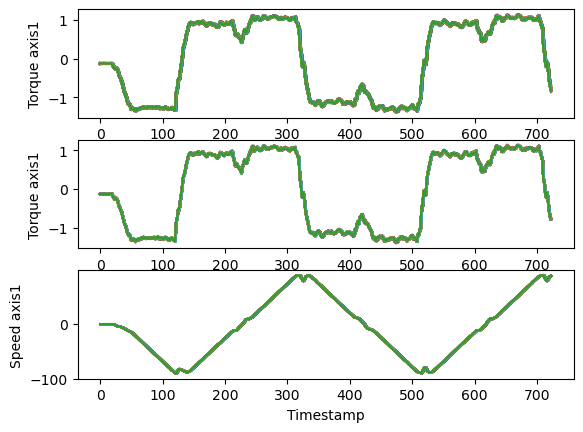

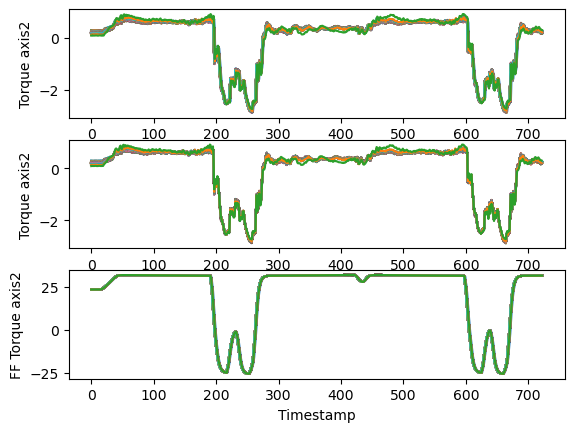

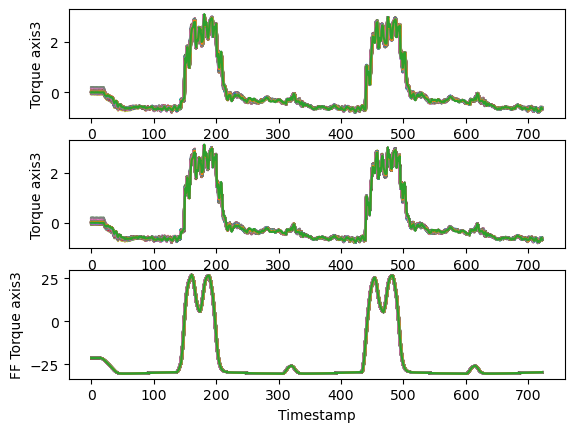

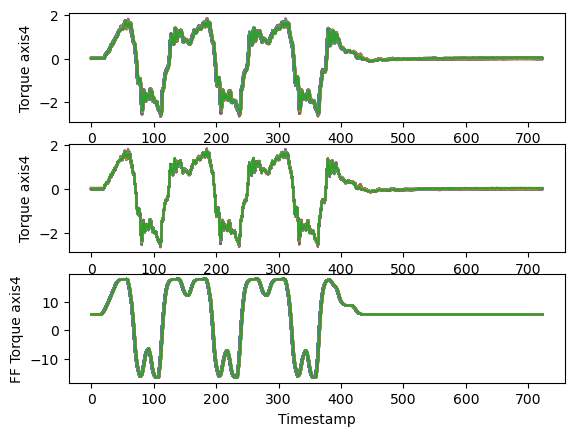

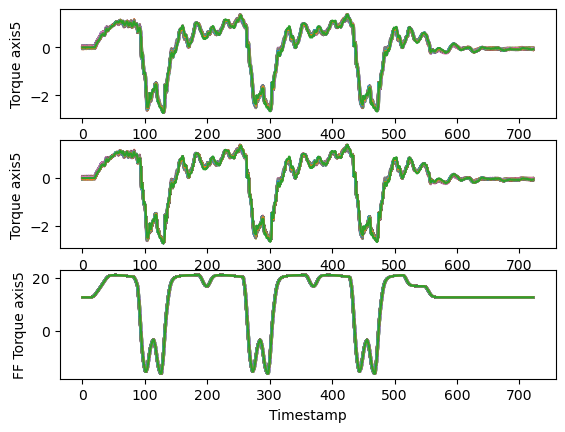

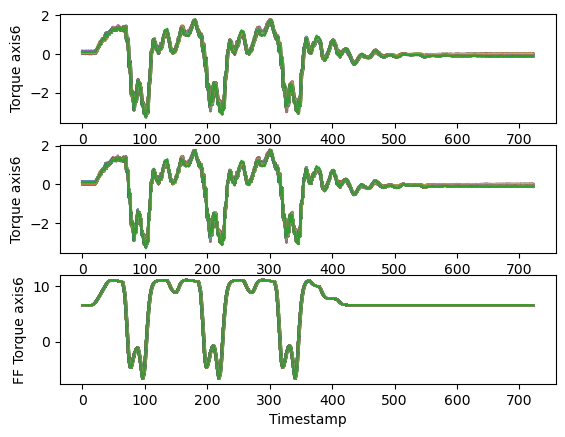

In [370]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC7, mean_FC7, stv_FC7 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles'
RMS_Value_FC7,Stv_FC7,Impulse_factor_FC7,Shape_factor_FC7, torque_areaUnderSignal_FC7, torque_trimmedMean_FC7,torque_signalNoise_FC7, MAX_AMP_FC7 = generate_more_feature(File_path,ref_FC7, mean_FC7, stv_FC7)

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles\\7600-102993_DIAGDATA_20160703_050008__MCC.zip' mode='r'>


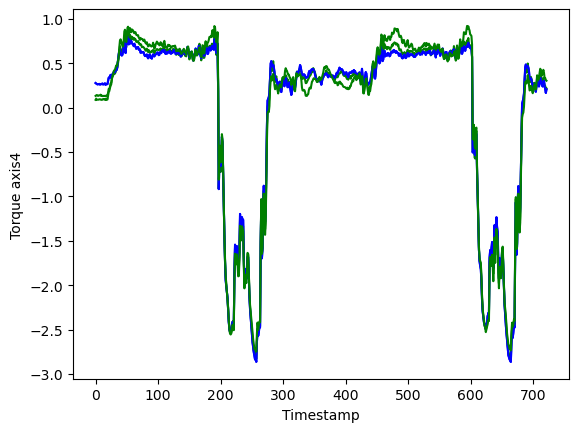

In [64]:
date_FC7 = date(2016, 7, 3)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC7, mean_FC7, stv_FC7 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles'
RMS_Value_FC7,Stv_FC7,Impulse_factor_FC7,Shape_factor_FC7, torque_areaUnderSignal_FC7, torque_trimmedMean_FC7,torque_signalNoise_FC7, MAX_AMP_FC7, drop_FC7, CORR7 = generate_feature_refresh_reference(File_path,ref_FC7, mean_FC7, stv_FC7, date_FC7)

In [69]:
torque_areaUnderSignal_FC7[0:30]

,axis1,axis2,axis3,axis4,axis5,axis6
time,,,,,,
2016-04-01,0.003574,0.003377,0.002973,0.003727,0.003556,0.000065
2016-04-02,0.004754,0.001888,0.000555,0.004474,0.004816,0.000711
2016-04-03,0.005615,0.003112,0.004923,0.006780,0.000498,0.005574
2016-04-04,0.005570,0.004025,0.002233,0.002912,0.001973,0.004889
2016-04-05,0.006052,0.005188,0.002933,0.002102,0.000032,0.002662
2016-04-06,0.002830,0.004802,0.002746,0.000553,0.000247,0.004629
2016-04-08,0.004687,0.003793,0.001407,0.008669,0.008879,0.006693
2016-04-14,0.004257,0.004579,0.003725,0.002094,0.002824,0.005454
2016-06-29,0.019023,0.040007,0.007773,0.012951,0.010185,0.008164


In [66]:
RMS_Value_FC7 = RMS_Value_FC7.dropna(axis=0,how='any')
Stv_FC7 = Stv_FC7.dropna(axis=0,how='any')
torque_areaUnderSignal_FC7 = torque_areaUnderSignal_FC7.dropna(axis=0,how='any')
torque_trimmedMean_FC7 = torque_trimmedMean_FC7.dropna(axis=0,how='any')
torque_signalNoise_FC7 = torque_signalNoise_FC7.dropna(axis=0,how='any')
MAX_AMP_FC7 = MAX_AMP_FC7.dropna(axis=0,how='any')

In [67]:
RMS_Value_FC7 = RMS_Value_FC7.groupby(by='time').mean()
Stv_FC7 = Stv_FC7.groupby(by='time').mean()
torque_areaUnderSignal_FC7 = torque_areaUnderSignal_FC7.groupby(by='time').mean()
torque_trimmedMean_FC7 = torque_trimmedMean_FC7.groupby(by='time').mean()
torque_signalNoise_FC7 = torque_signalNoise_FC7.groupby(by='time').mean()
MAX_AMP_FC7 = MAX_AMP_FC7.groupby(by='time').mean()


<AxesSubplot:xlabel='time'>

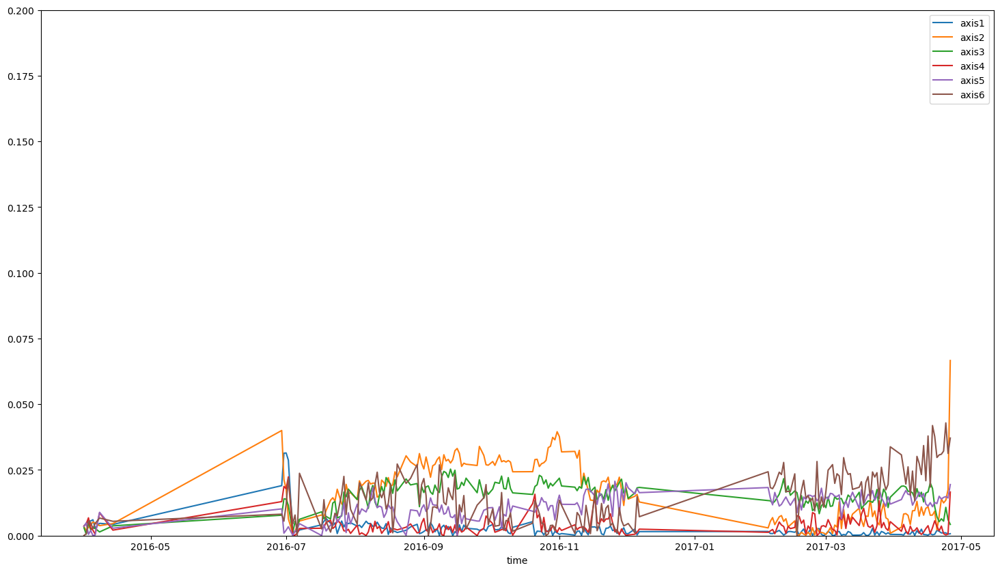

In [68]:
torque_areaUnderSignal_FC7.plot(figsize=(18,10), ylim =(0,0.2))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/1237-0041-56_DIAGDATA_20141107_131229_1a2edf8e-8453-4210-8f9d-4bbc65e75273_MCC.zip' mode='r'>


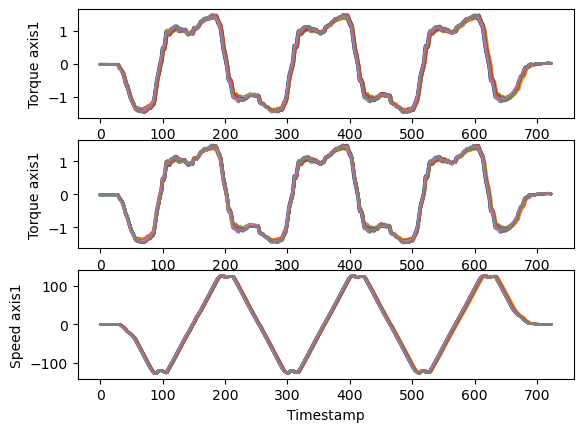

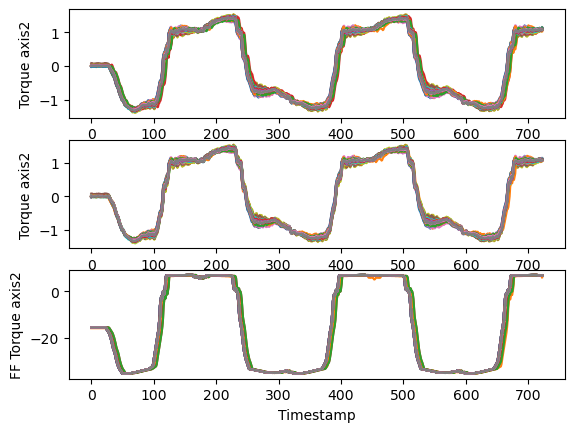

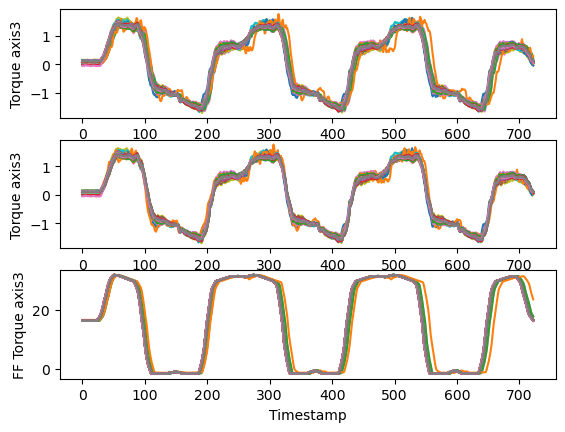

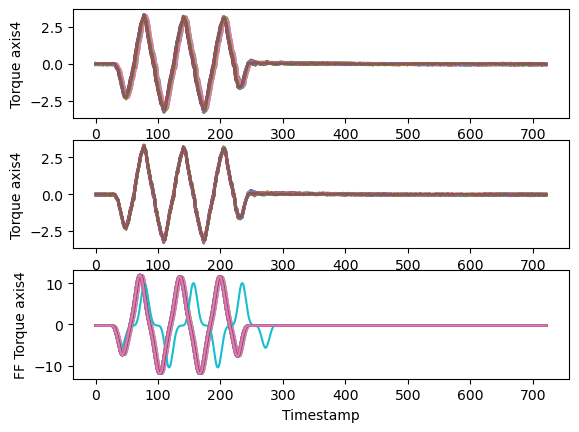

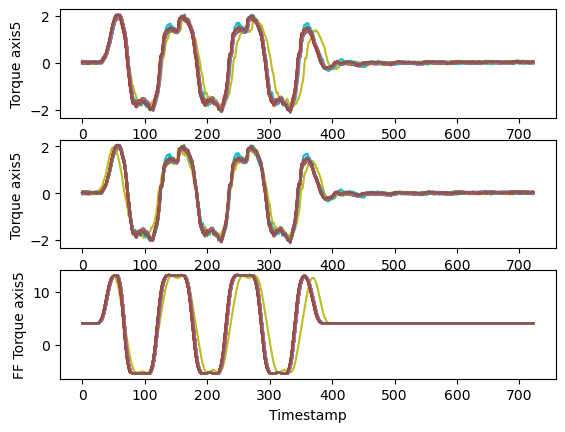

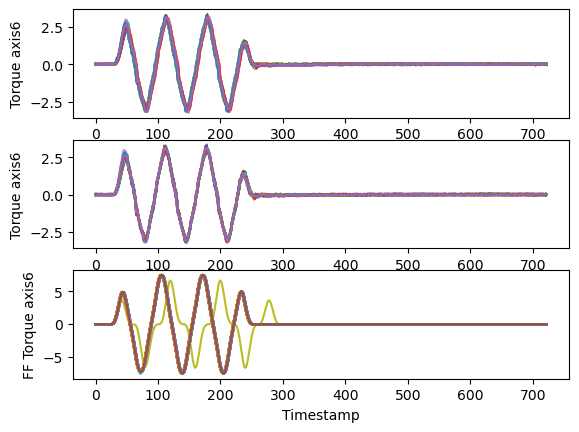

In [70]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/1237-0041-56_DIAGDATA_20141107_131229_1a2edf8e-8453-4210-8f9d-4bbc65e75273_MCC.zip'
ref_FC8, mean_FC8, stv_FC8 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/MCCFiles'
RMS_Value_FC8,Stv_FC8,Impulse_factor_FC8,Shape_factor_FC8, torque_areaUnderSignal_FC8, torque_trimmedMean_FC8,torque_signalNoise_FC8, MAX_AMP_FC8 = generate_more_feature(File_path,ref_FC8, mean_FC8, stv_FC8)

In [270]:
RMS_Value_FC8[30:60]

,axis1,axis2,axis3,axis4,axis5,axis6
time,,,,,,
2015-09-04,0.014791,0.022579,0.039296,0.054872,0.035835,0.051447
2015-09-27,0.027451,0.043599,0.059364,0.065940,0.036169,0.060116
2015-10-10,0.019285,0.033186,0.048618,0.056889,0.037163,0.051821
2015-11-07,0.019496,0.032168,0.053115,0.059260,0.038835,0.058040
2015-12-19,0.022687,0.036147,0.053824,0.061964,0.038011,0.060311
2016-01-09,0.033454,0.055447,0.071329,0.064578,0.039091,0.077126
2016-01-23,0.017040,0.026739,0.048604,0.057704,0.036468,0.052098
2016-01-30,0.017490,0.022536,0.036758,0.059356,0.036023,0.048184
2016-10-22,0.040781,0.075213,0.127469,0.062702,0.054228,0.080156


In [72]:
RMS_Value_FC8 = RMS_Value_FC8.dropna(axis=0,how='any')
Stv_FC8 = Stv_FC8.dropna(axis=0,how='any')
torque_areaUnderSignal_FC8 = torque_areaUnderSignal_FC8.dropna(axis=0,how='any')
torque_trimmedMean_FC8 = torque_trimmedMean_FC8.dropna(axis=0,how='any')
torque_signalNoise_FC8 = torque_signalNoise_FC8.dropna(axis=0,how='any')
MAX_AMP_FC8 = MAX_AMP_FC8.dropna(axis=0,how='any')


<AxesSubplot:xlabel='time'>

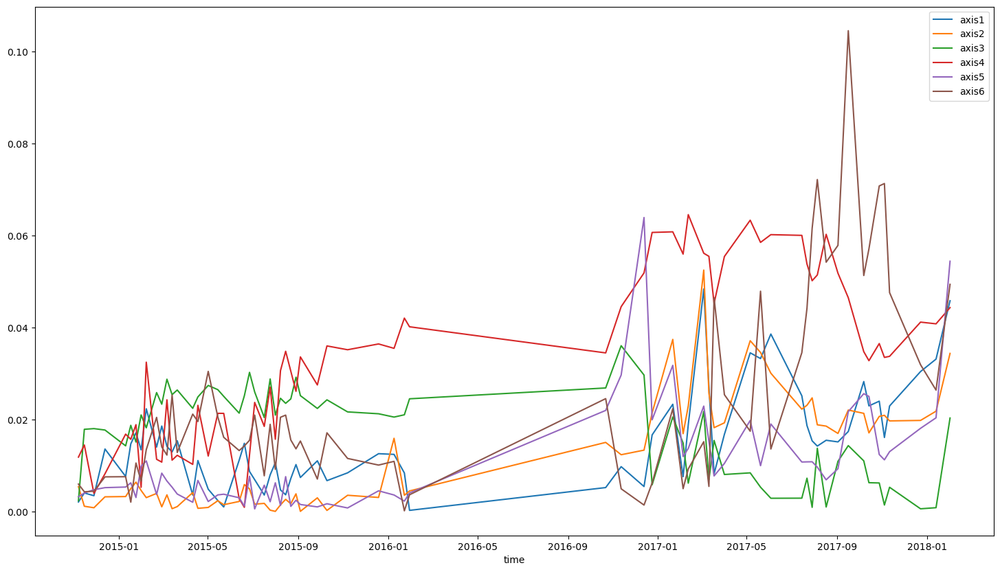

In [77]:
torque_areaUnderSignal_FC8.plot(figsize=(18,10))


In [73]:
RMS_Value_FC8 = RMS_Value_FC8.groupby(by='time').mean()
Stv_FC8 = Stv_FC8.groupby(by='time').mean()
torque_areaUnderSignal_FC8 = torque_areaUnderSignal_FC8.groupby(by='time').mean()
torque_trimmedMean_FC8 = torque_trimmedMean_FC8.groupby(by='time').mean()
torque_signalNoise_FC8 = torque_signalNoise_FC8.groupby(by='time').mean()
MAX_AMP_FC8 = MAX_AMP_FC8.groupby(by='time').mean()


<AxesSubplot:xlabel='time'>

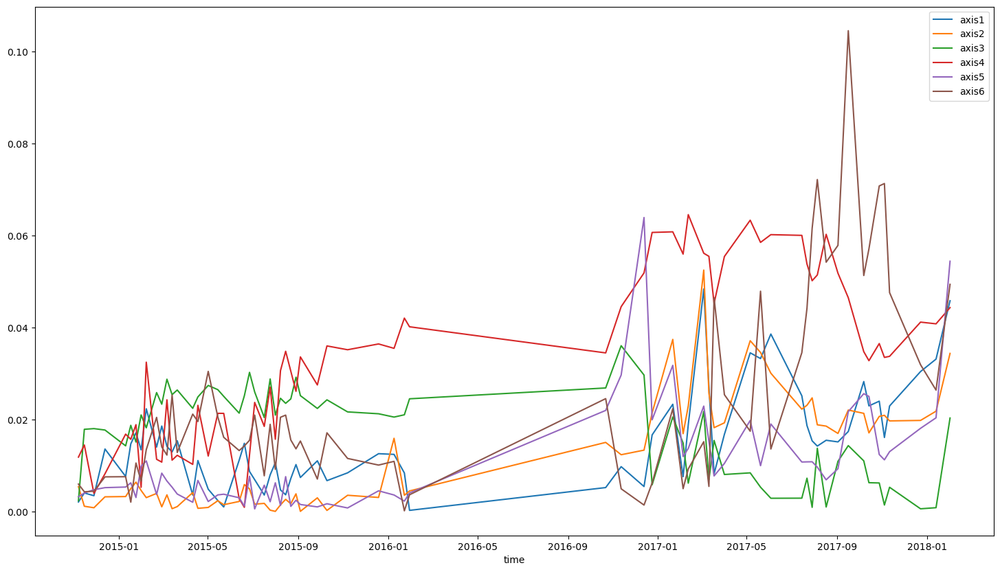

In [74]:
torque_areaUnderSignal_FC8.plot(figsize=(18,10))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/6640-108111_DIAGDATA_20160223_083249_3f0c9af8-e4b6-44de-ba75-53e13801feb1_MCC.zip' mode='r'>


C:\Temp\ipykernel_28064\2775334714.py:63: RuntimeWarning: invalid value encountered in double_scalars
  torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))
C:\Temp\ipykernel_28064\2775334714.py:84: RuntimeWarning: invalid value encountered in double_scalars
  Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
C:\Temp\ipykernel_28064\2775334714.py:87: RuntimeWarning: invalid value encountered in double_scalars
  Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
C:\Temp\ipykernel_28064\2775334714.py:107: RuntimeWarning: invalid value encountered in double_scalars
  torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
C:\Temp\ipykernel_28064\2775334714.py:114: RuntimeWarning: invalid value encountered in double_scalars
  Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
C:\Temp\ipykernel_28064\2775334714.py:

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/MCCFiles\\6640-108111_DIAGDATA_20160421_122657_cd22981e-36e8-4a9e-bdf6-326f1d56949c_MCC.zip' mode='r'>


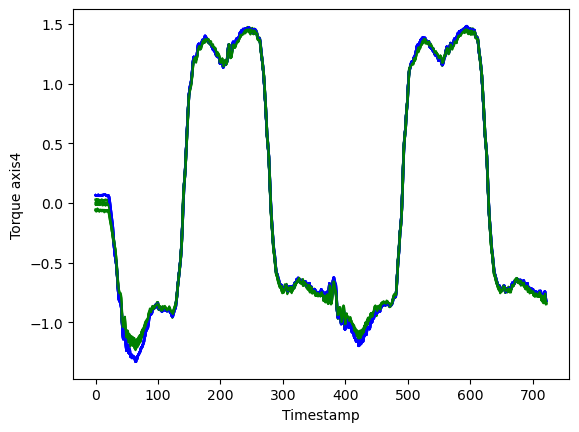

In [78]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/6640-108111_DIAGDATA_20160223_083249_3f0c9af8-e4b6-44de-ba75-53e13801feb1_MCC.zip'
ref_FC11, mean_FC11, stv_FC11 = process_file(file_path)
date_FC11 = date(2016, 4, 18)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/MCCFiles'
RMS_Value_FC11,Stv_FC11,Impulse_factor_FC11,Shape_factor_FC11, torque_areaUnderSignal_FC11, torque_trimmedMean_FC11,torque_signalNoise_FC11, MAX_AMP_FC11,drop_FC11,CORR11 = generate_feature_refresh_reference(File_path,ref_FC11, mean_FC11, stv_FC11, date_FC11)

In [381]:
drop_FC11

15

In [79]:
RMS_Value_FC11 = RMS_Value_FC11.dropna(axis=0,how='any')
Stv_FC11 = Stv_FC11.dropna(axis=0,how='any')
torque_areaUnderSignal_FC11 = torque_areaUnderSignal_FC11.dropna(axis=0,how='any')
torque_trimmedMean_FC11 = torque_trimmedMean_FC11.dropna(axis=0,how='any')
torque_signalNoise_FC11 = torque_signalNoise_FC11.dropna(axis=0,how='any')
MAX_AMP_FC11 = MAX_AMP_FC11.dropna(axis=0,how='any')

In [80]:
RMS_Value_FC11 = RMS_Value_FC11.groupby(by='time').mean()
Stv_FC11 = Stv_FC11.groupby(by='time').mean()
torque_areaUnderSignal_FC11 = torque_areaUnderSignal_FC11.groupby(by='time').mean()
torque_trimmedMean_FC11 = torque_trimmedMean_FC11.groupby(by='time').mean()
torque_signalNoise_FC11 = torque_signalNoise_FC11.groupby(by='time').mean()
MAX_AMP_FC11 = MAX_AMP_FC11.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

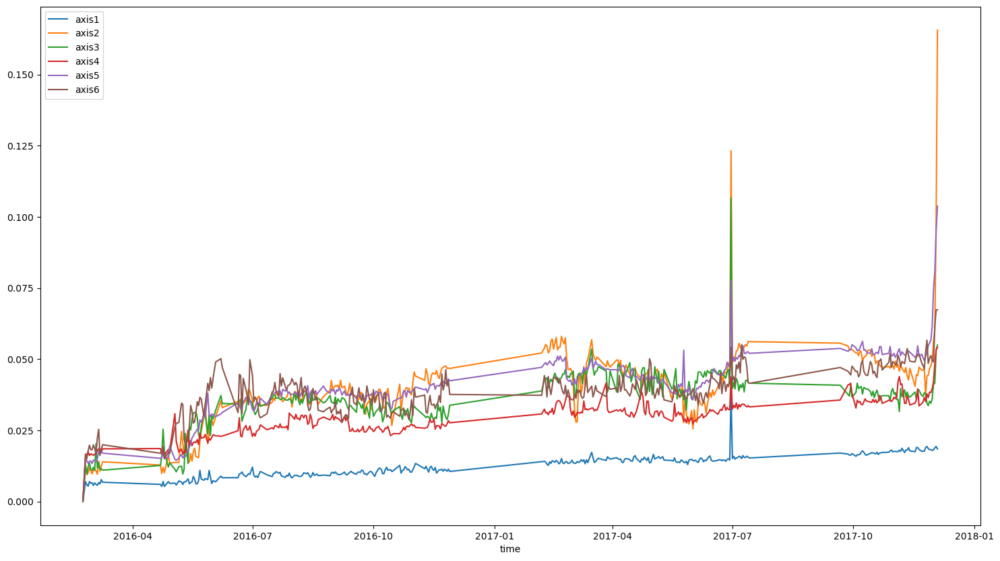

In [81]:
RMS_Value_FC11.plot(figsize=(18,10))

<AxesSubplot:xlabel='time'>

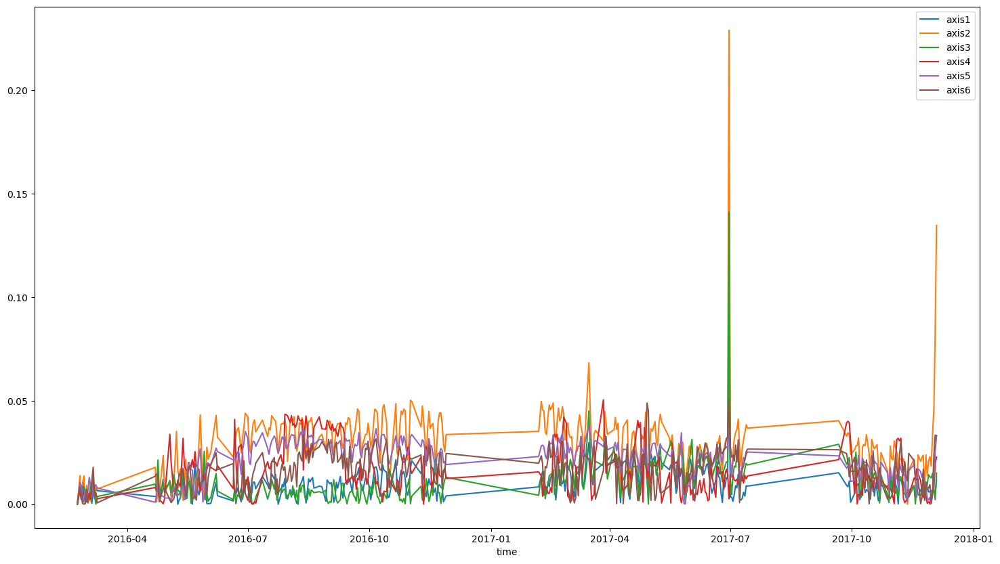

In [82]:
torque_areaUnderSignal_FC11.plot(figsize=(18,10))

In [216]:
torque_areaUnderSignal_FC11[295:330]

,axis1,axis2,axis3,axis4,axis5,axis6,time
296,0.032093,0.024876,0.016407,0.007329,0.026496,0.025993,2017-06-26
297,0.033743,0.029422,0.018284,0.014033,0.026692,0.027171,2017-06-27
298,0.034473,0.031696,0.020467,0.016937,0.027773,0.031563,2017-06-28
299,0.032877,0.03207,0.020342,0.014655,0.027232,0.032612,2017-06-29
300,0.098659,0.229015,0.141138,0.002629,0.04045,0.050314,2017-06-30
301,0.098659,0.229015,0.141138,0.002629,0.04045,0.050314,2017-06-30
302,0.03324,0.022167,0.01241,0.014271,0.019725,0.028155,2017-07-01
303,0.035078,0.014016,0.004589,0.0144,0.013145,0.022693,2017-07-02
304,0.033021,0.023985,0.013659,0.013995,0.021264,0.023729,2017-07-03
305,0.034052,0.031813,0.018394,0.011637,0.023466,0.02088,2017-07-04


<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/MCCFiles\\7600-102993_DIAGDATA_20170519_142207_9c2f7b9c-67bd-4d35-8000-6e872e1b666f_MCC.zip' mode='r'>


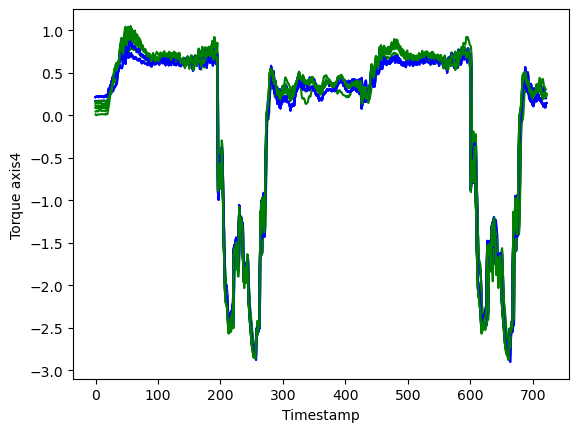

In [83]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC12, mean_FC12, stv_FC12 = process_file(file_path)
date_FC12 = date(2017, 5, 19)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/MCCFiles'
RMS_Value_FC12,Stv_FC12,Impulse_factor_FC12,Shape_factor_FC12, torque_areaUnderSignal_FC12, torque_trimmedMean_FC12,torque_signalNoise_FC12, MAX_AMP_FC12,drop_FC12, CORR2 = generate_feature_refresh_reference(File_path,ref_FC12, mean_FC12, stv_FC12,date_FC12)

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>


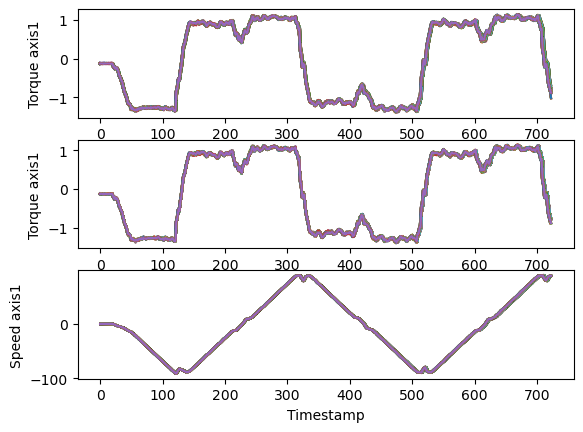

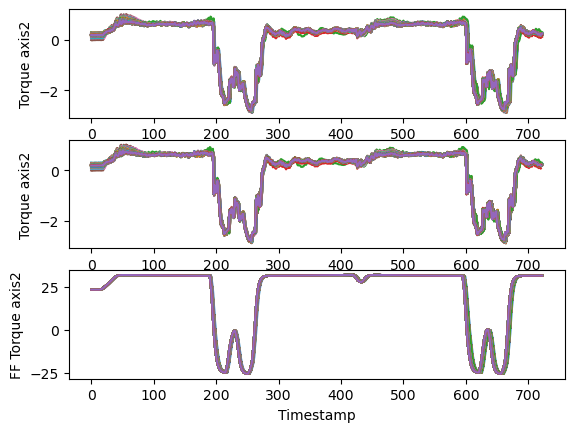

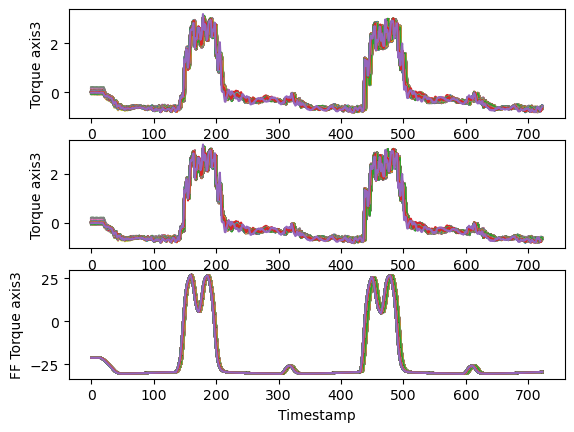

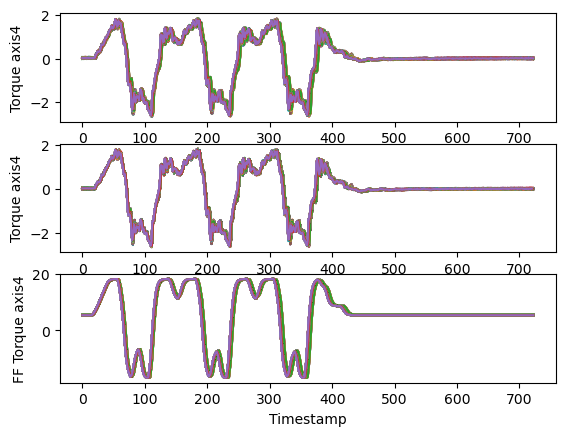

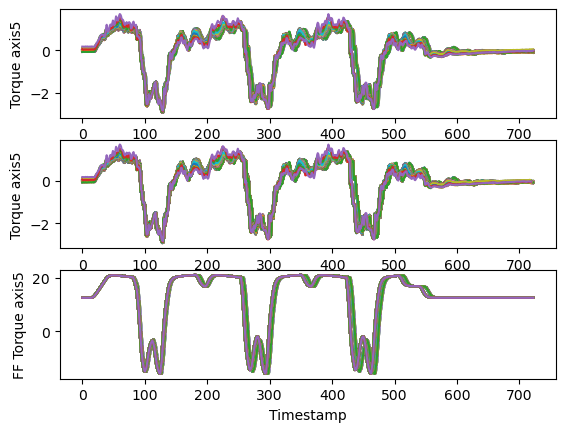

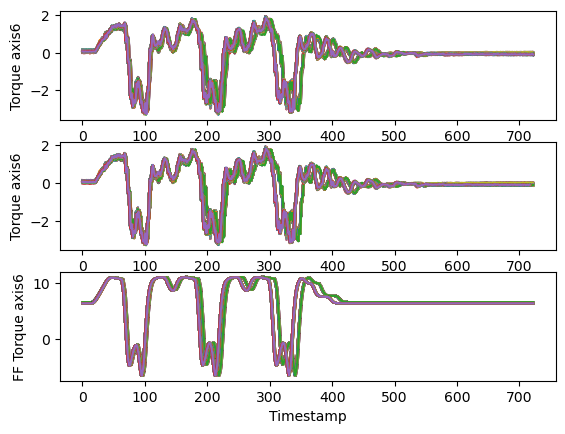

In [84]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC12, mean_FC12, stv_FC12 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/MCCFiles'
RMS_Value_FC12,Stv_FC12,Impulse_factor_FC12,Shape_factor_FC12, torque_areaUnderSignal_FC12, torque_trimmedMean_FC12,torque_signalNoise_FC12, MAX_AMP_FC12 = generate_more_feature(File_path,ref_FC12, mean_FC12, stv_FC12)

In [85]:
RMS_Value_FC12 = RMS_Value_FC12.dropna(axis=0,how='any')
Stv_FC12 = Stv_FC12.dropna(axis=0,how='any')
torque_areaUnderSignal_FC12 = torque_areaUnderSignal_FC12.dropna(axis=0,how='any')
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.dropna(axis=0,how='any')
torque_signalNoise_FC12 = torque_signalNoise_FC12.dropna(axis=0,how='any')
MAX_AMP_FC12 = MAX_AMP_FC12.dropna(axis=0,how='any')

In [86]:
RMS_Value_FC12 = RMS_Value_FC12.groupby(by='time').mean()
Stv_FC12 = Stv_FC12.groupby(by='time').mean()
torque_areaUnderSignal_FC12 = torque_areaUnderSignal_FC12.groupby(by='time').mean()
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.groupby(by='time').mean()
torque_signalNoise_FC12 = torque_signalNoise_FC12.groupby(by='time').mean()
MAX_AMP_FC12 = MAX_AMP_FC12.groupby(by='time').mean()

In [259]:
torque_areaUnderSignal_FC12[200:230]

,axis1,axis2,axis3,axis4,axis5,axis6
time,,,,,,
2017-04-25,0.061493,0.024085,0.019439,0.027271,0.021509,0.024641
2017-04-26,0.062845,0.073077,0.017557,0.014371,0.025039,0.032781
2017-05-20,0.042342,0.142176,0.075676,0.019555,0.038069,0.000103
2017-05-21,0.043256,0.143054,0.072452,0.012104,0.036775,0.009983
2017-05-22,0.043015,0.144824,0.078494,0.011832,0.029227,0.004357
2017-05-23,0.043128,0.135755,0.076505,0.011015,0.027932,0.009942
2017-05-24,0.042373,0.133270,0.077419,0.007582,0.030675,0.011954
2017-05-25,0.044173,0.119412,0.075017,0.006995,0.037875,0.007176
2017-05-26,0.044335,0.128274,0.073652,0.003591,0.032153,0.013475


<AxesSubplot:xlabel='time'>

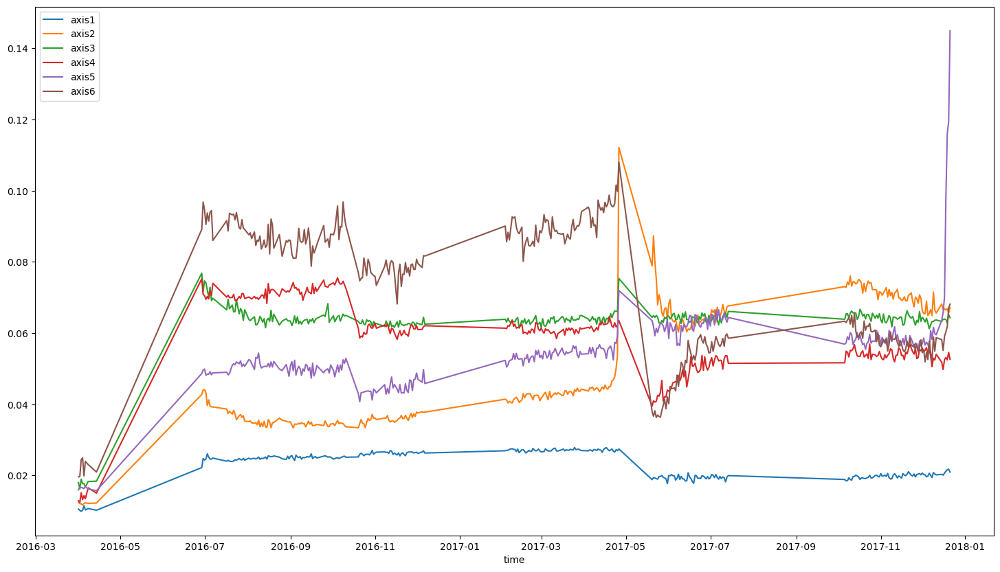

In [387]:
RMS_Value_FC12.plot(figsize=(18,10))

<AxesSubplot:xlabel='time'>

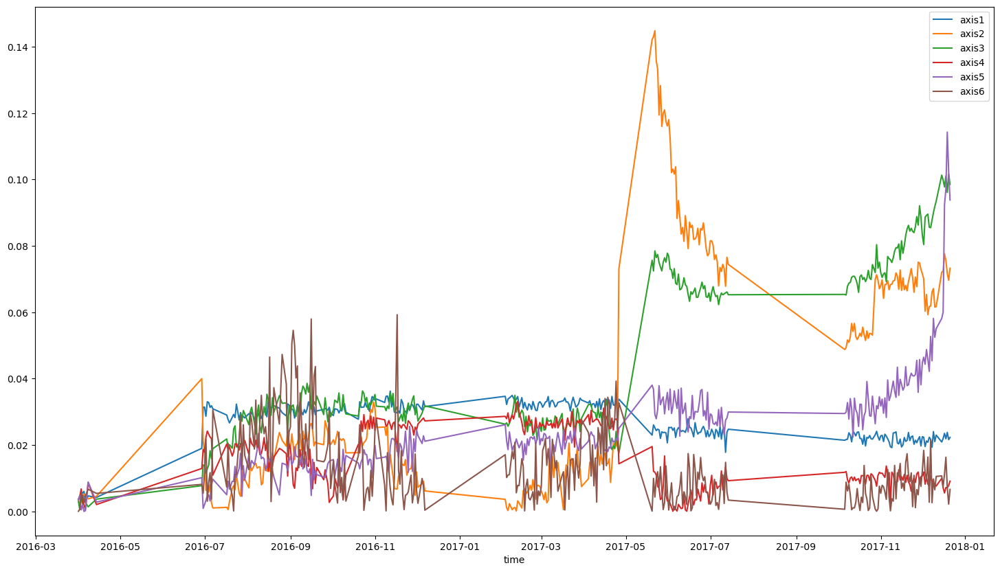

In [386]:
torque_areaUnderSignal_FC12.plot(figsize=(18,10))

In [317]:
from sklearn import preprocessing
X_scaled = preprocessing.scale(MAX_AMP_FC12)

In [322]:
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(MAX_AMP_FC12)

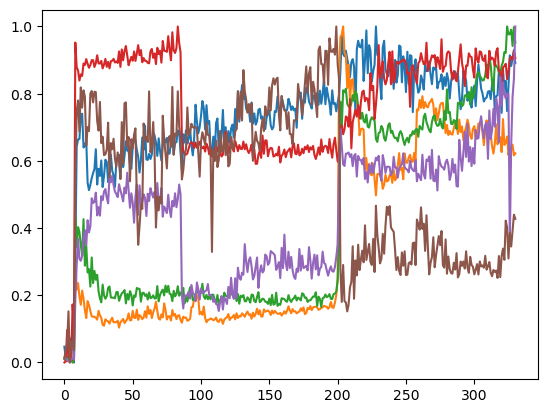

In [323]:
plt.plot(X_train_minmax)

In [87]:
line_FC10 = [date(2019, 4, 18),date(2019, 6, 5)]
line_FC2 = [date(2015, 3, 20),date(2015, 4, 15)]
line_FC1 = [date(2016, 4, 29),date(2016, 6, 16)]
line_FC6 = [date(2016, 9, 9),date(2017, 3, 3)]
line_FC7 = [date(2017, 4, 20),date(2017, 4, 26)]
line_FC8 = [date(2016, 8, 1),date(2016, 10, 28)]
line_FC11 = [date(2017, 12, 3),date(2017, 12, 6)]
line_FC12 = [date(2017, 12, 17),date(2017, 12, 22)]

Failure_period = [line_FC10, line_FC2, line_FC1, line_FC6, line_FC7, line_FC8,line_FC11, line_FC12]

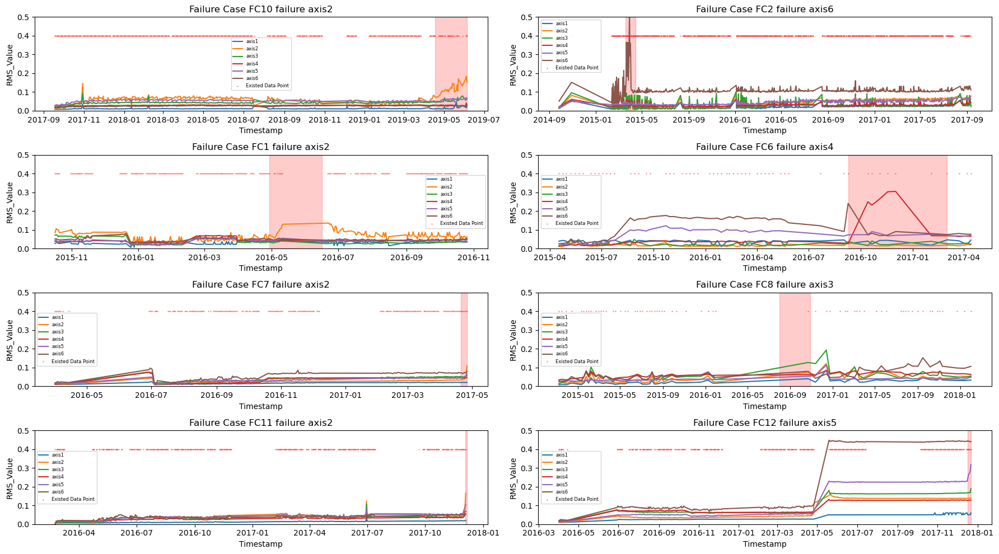

In [91]:

axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': RMS_Value_FC10,
    'FC2 failure axis6': RMS_Value_FC2,
    'FC1 failure axis2': RMS_Value_FC1,
    'FC6 failure axis4': RMS_Value_FC6,
    'FC7 failure axis2': RMS_Value_FC7,
    'FC8 failure axis3': RMS_Value_FC8,
    'FC11 failure axis2': RMS_Value_FC11,
    'FC12 failure axis5': RMS_Value_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('RMS_Value')
        ax.set_ylim(0, .5)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.4),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")


plt.tight_layout()



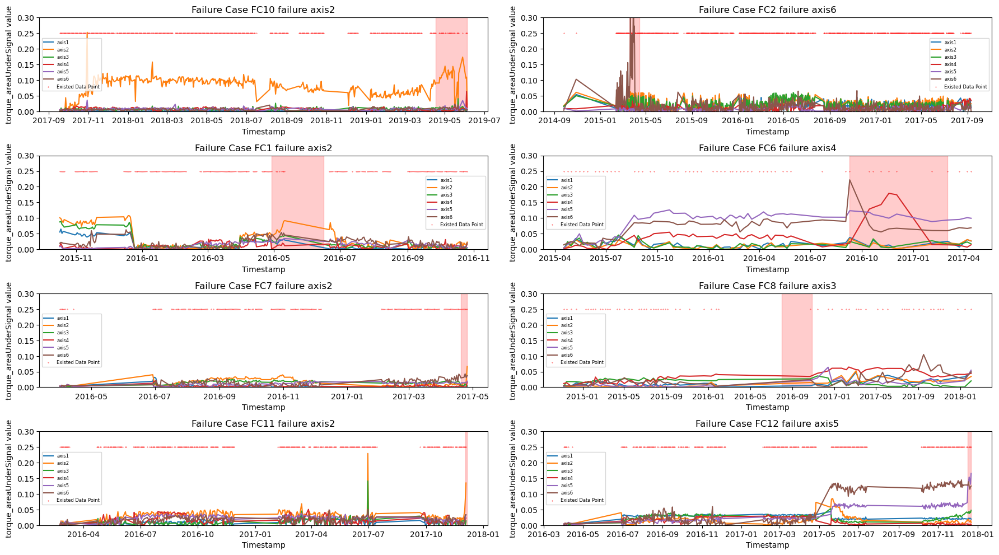

In [88]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': torque_areaUnderSignal_FC10,
    'FC2 failure axis6': torque_areaUnderSignal_FC2,
    'FC1 failure axis2': torque_areaUnderSignal_FC1,
    'FC6 failure axis4': torque_areaUnderSignal_FC6,
    'FC7 failure axis2': torque_areaUnderSignal_FC7,
    'FC8 failure axis3': torque_areaUnderSignal_FC8,
    'FC11 failure axis2': torque_areaUnderSignal_FC11,
    'FC12 failure axis5': torque_areaUnderSignal_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('torque_areaUnderSignal value')
        ax.set_ylim(0, .3)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.25),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")


plt.tight_layout()


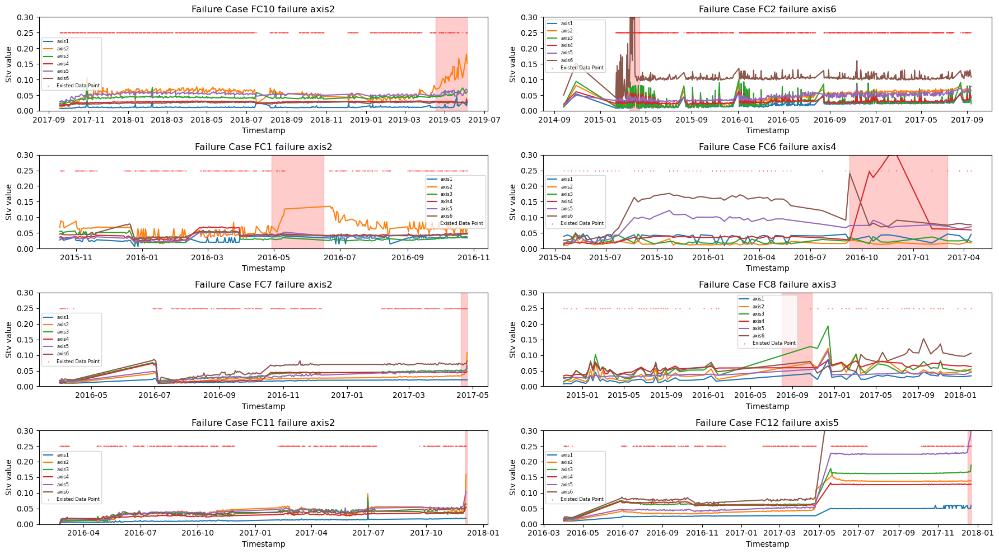

In [92]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': Stv_FC10,
    'FC2 failure axis6': Stv_FC2,
    'FC1 failure axis2': Stv_FC1,
    'FC6 failure axis4': Stv_FC6,
    'FC7 failure axis2': Stv_FC7,
    'FC8 failure axis3': Stv_FC8,
    'FC11 failure axis2': Stv_FC11,
    'FC12 failure axis5': Stv_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('Stv value')
        ax.set_ylim(0, .3)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.25),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")

plt.tight_layout()


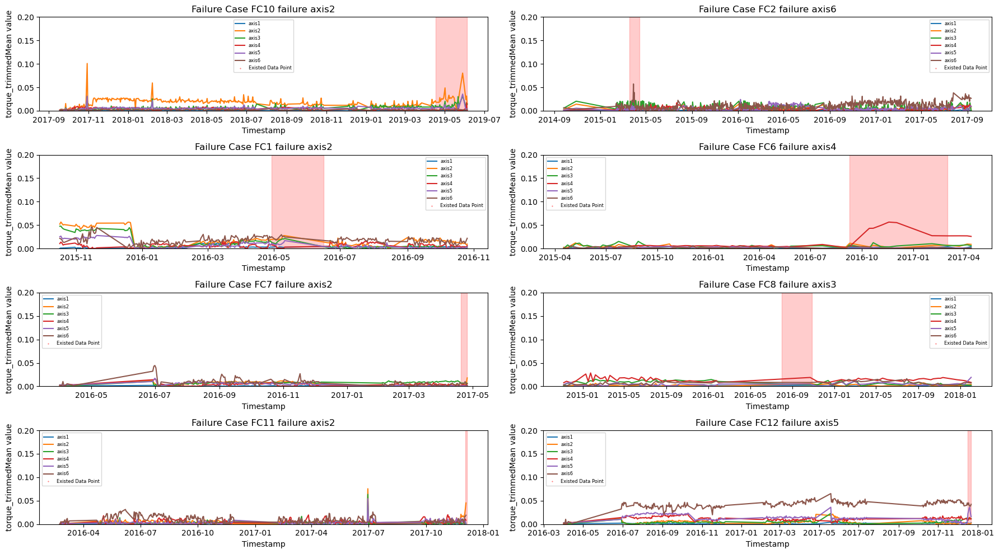

In [95]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': torque_trimmedMean_FC10,
    'FC2 failure axis6': torque_trimmedMean_FC2,
    'FC1 failure axis2': torque_trimmedMean_FC1,
    'FC6 failure axis4': torque_trimmedMean_FC6,
    'FC7 failure axis2': torque_trimmedMean_FC7,
    'FC8 failure axis3': torque_trimmedMean_FC8,
    'FC11 failure axis2': torque_trimmedMean_FC11,
    'FC12 failure axis5': torque_trimmedMean_FC12
}



for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        

        
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('torque_trimmedMean value')
        ax.set_ylim(0, .2)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.25),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")


plt.tight_layout()


In [ ]:
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.dropna(axis=0,how='any')
torque_signalNoise_FC12 = torque_signalNoise_FC12.dropna(axis=0,how='any')
MAX_AMP_FC12 = MAX_AMP_FC12.dropna(axis=0,how='any')

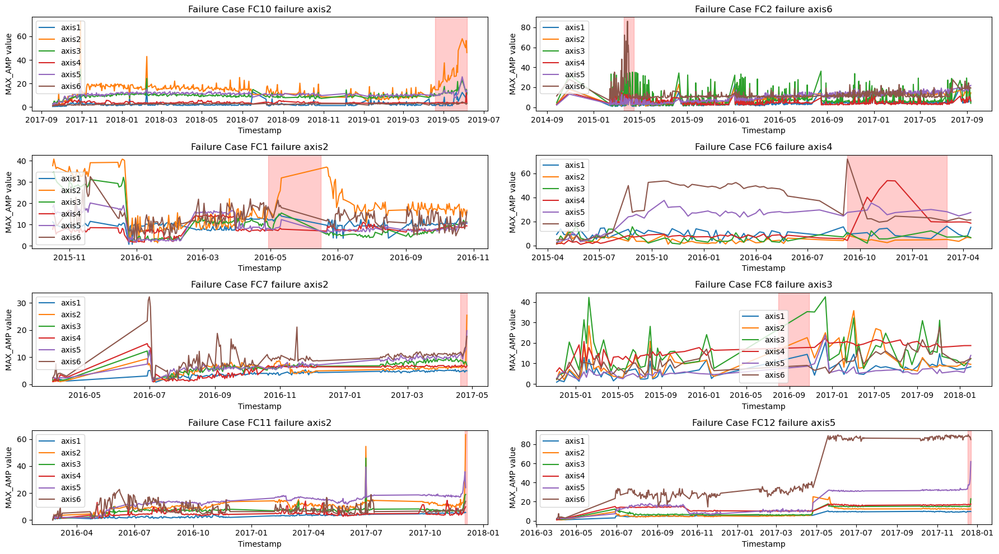

In [96]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2':MAX_AMP_FC10,
    'FC2 failure axis6': MAX_AMP_FC2,
    'FC1 failure axis2': MAX_AMP_FC1,
    'FC6 failure axis4': MAX_AMP_FC6,
    'FC7 failure axis2': MAX_AMP_FC7,
    'FC8 failure axis3': MAX_AMP_FC8,
    'FC11 failure axis2': MAX_AMP_FC11,
    'FC12 failure axis5': MAX_AMP_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('MAX_AMP value')
#         ax.set_ylim(0, .2)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
plt.legend()
plt.tight_layout()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

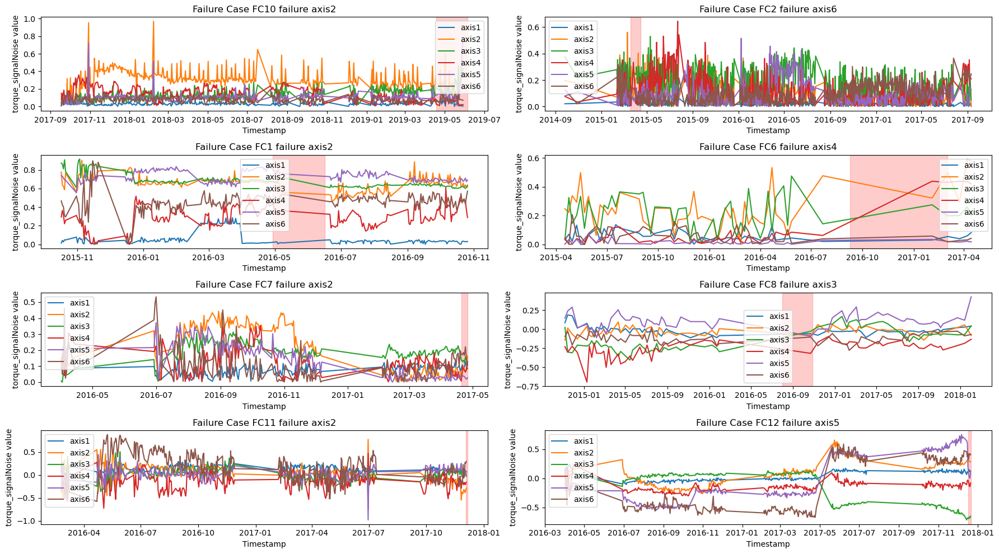

In [423]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2':torque_signalNoise_FC10,
    'FC2 failure axis6': torque_signalNoise_FC2,
    'FC1 failure axis2': torque_signalNoise_FC1,
    'FC6 failure axis4': torque_signalNoise_FC6,
    'FC7 failure axis2': torque_signalNoise_FC7,
    'FC8 failure axis3': torque_signalNoise_FC8,
    'FC11 failure axis2': torque_signalNoise_FC11,
    'FC12 failure axis5': torque_signalNoise_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('torque_signalNoise value')
#         ax.set_ylim(0, .2)
        ax.legend()
    ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    plt.legend()
plt.tight_layout()

# Features for each axis

In [149]:
feature_axis1_FC2 = pd.concat([RMS_Value_FC2['axis1'],Stv_FC2['axis1'],torque_areaUnderSignal_FC2['axis1']],axis=1)
feature_axis1_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC10 = pd.concat([RMS_Value_FC10['axis1'],Stv_FC10['axis1'],torque_areaUnderSignal_FC10['axis1']],axis=1)
feature_axis1_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC2 = pd.concat([RMS_Value_FC2['axis2'],Stv_FC2['axis2'],torque_areaUnderSignal_FC2['axis2']],axis=1)
feature_axis2_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC10 = pd.concat([RMS_Value_FC10['axis2'],Stv_FC10['axis2'],torque_areaUnderSignal_FC10['axis2']],axis=1)
feature_axis2_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC2 = pd.concat([RMS_Value_FC2['axis3'],Stv_FC2['axis3'],torque_areaUnderSignal_FC2['axis3']],axis=1)
feature_axis3_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC10 = pd.concat([RMS_Value_FC10['axis3'],Stv_FC10['axis3'],torque_areaUnderSignal_FC10['axis3']],axis=1)
feature_axis3_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC2 = pd.concat([RMS_Value_FC2['axis4'],Stv_FC2['axis4'],torque_areaUnderSignal_FC2['axis4']],axis=1)
feature_axis4_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC10 = pd.concat([RMS_Value_FC10['axis4'],Stv_FC10['axis4'],torque_areaUnderSignal_FC10['axis4']],axis=1)
feature_axis4_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC2 = pd.concat([RMS_Value_FC2['axis5'],Stv_FC2['axis5'],torque_areaUnderSignal_FC2['axis5']],axis=1)
feature_axis5_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC10 = pd.concat([RMS_Value_FC10['axis5'],Stv_FC10['axis5'],torque_areaUnderSignal_FC10['axis5']],axis=1)
feature_axis5_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC2 = pd.concat([RMS_Value_FC2['axis6'],Stv_FC2['axis6'],torque_areaUnderSignal_FC2['axis6']],axis=1)
feature_axis6_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC10 = pd.concat([RMS_Value_FC10['axis6'],Stv_FC10['axis6'],torque_areaUnderSignal_FC10['axis6']],axis=1)
feature_axis6_FC10.columns = ['RMS','Stv','areaUnderSignal']

In [180]:
len(feature_axis2_FC2)

757

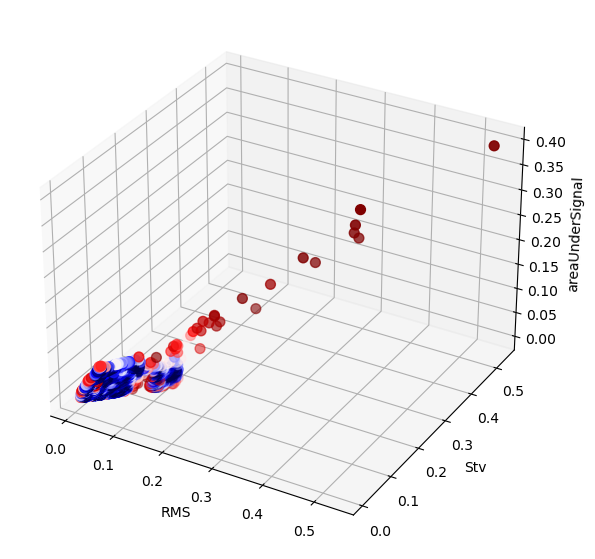

In [209]:

data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames = [data1, data2, data3, data4, data5, data6]

result = pd.concat(frames)
from PyNomaly import loop
# using the same iris dataset as above...
m = loop.LocalOutlierProbability(result, extent=3, n_neighbors=40).fit()
scores = m.local_outlier_probabilities

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(result['RMS'], result['Stv'], result['areaUnderSignal'],
c=scores, cmap='seismic', s=50)
ax.set_xlabel('RMS')
ax.set_ylabel('Stv')
ax.set_zlabel('areaUnderSignal')
plt.show()
plt.clf()
plt.cla()
plt.tight_layout()
plt.close()

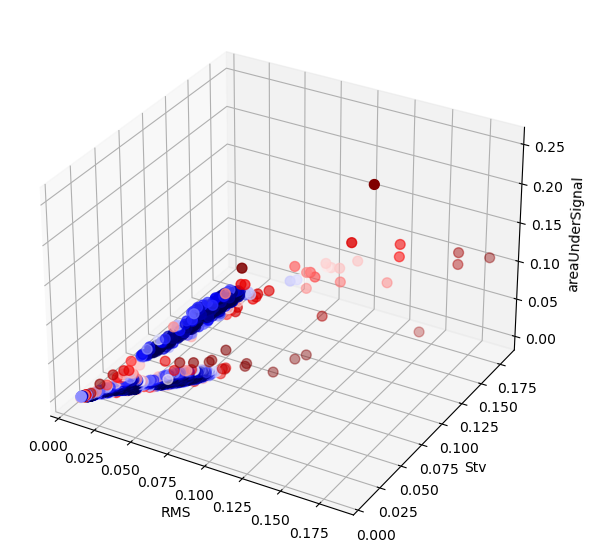

In [208]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames = [data1, data2, data3, data4, data5, data6]

result = pd.concat(frames)
from PyNomaly import loop
from mpl_toolkits.axes_grid1 import make_axes_locatable
# using the same iris dataset as above...
m = loop.LocalOutlierProbability(result, extent=3, n_neighbors=40).fit()
scores = m.local_outlier_probabilities

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='3d')
sca = ax.scatter(result['RMS'], result['Stv'], result['areaUnderSignal'],
c=scores, cmap='seismic', s=50)

ax.set_xlabel('RMS')
ax.set_ylabel('Stv')
ax.set_zlabel('areaUnderSignal')
# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("top", size="5%", pad=0.05)
# plt.colorbar(sca,cax)
plt.show()
plt.clf()
plt.cla()
plt.close()

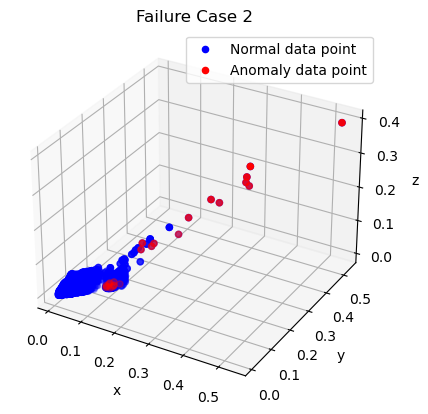

time
2015-03-21    0.164773
2015-03-22    0.365457
2015-03-23    0.186313
2015-03-24    0.250961
2015-03-25    0.181886
2015-03-26    0.364128
2015-03-27    0.162511
2015-03-28    0.232317
2015-03-29    0.358055
2015-03-30    0.536759
2015-03-31    0.292847
2015-04-01    0.359911
2015-04-02    0.308419
2015-04-03    0.121951
2015-04-04    0.110724
2015-04-05    0.107695
2015-04-07    0.110896
2015-04-08    0.097600
2015-04-09    0.095679
2015-04-10    0.096246
2015-04-11    0.101185
2015-04-12    0.110133
2015-04-13    0.100856
2015-04-14    0.103512
2015-04-15    0.103147
Name: RMS, dtype: float64

In [148]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2015, 3, 20)
index2 = date(2015, 4, 15)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC2
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point')
ax.scatter(data1['RMS'], data1['Stv'], data1['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b')
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b')
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b')
ax.scatter(data['RMS'].loc[:index1], data['Stv'].loc[:index1], data['areaUnderSignal'].loc[:index1], c='b')
ax.scatter(data['RMS'].loc[index2:], data['Stv'].loc[index2:], data['areaUnderSignal'].loc[index2:], c='b')
ax.scatter(data['RMS'].loc[index1:index2], data['Stv'].loc[index1:index2], data['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('RMS') 
ax.set_ylabel('Stv') 
ax.set_zlabel('areaUnderSignal') 
ax.legend()
ax.set_title('Failure Case 2')
plt.show()
# datadate(2019, 4, 18),date(2019, 6, 5)


data['RMS'].loc[index1:index2]

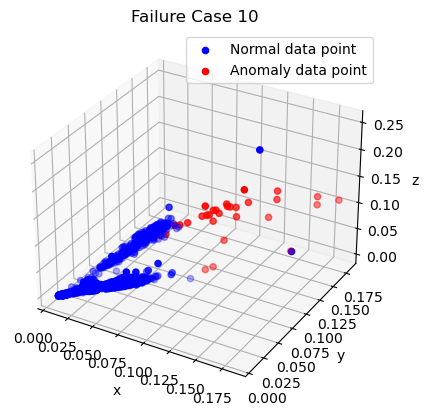

In [147]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2019, 4, 18)
index2 = date(2019, 6, 5)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC10
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point')
ax.scatter(data1['RMS'], data1['Stv'], data1['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b')
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b')
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'].loc[:index1], data2['Stv'].loc[:index1], data2['areaUnderSignal'].loc[:index1], c='b')
ax.scatter(data2['RMS'].loc[index2:], data2['Stv'].loc[index2:], data2['areaUnderSignal'].loc[index2:], c='b')

ax.scatter(data2['RMS'].loc[index1:index2], data2['Stv'].loc[index1:index2], data2['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('x') 
ax.set_ylabel('y') 
ax.set_zlabel('z') 
ax.legend()
ax.set_title('Failure Case 10')
plt.show()
# datadate(2019, 4, 18),date(2019, 6, 5)




In [129]:
feature_axis2_FC10

,RMS,Stv,areaUnderSignal
time,,,
2017-09-18,0.014943,0.014783,0.005263
2017-09-19,0.013163,0.013149,0.001765
2017-09-20,0.013606,0.013580,0.001934
2017-09-21,0.012877,0.012871,0.002628
2017-09-22,0.013349,0.013322,0.004022
...,...,...,...
2019-05-23,0.170087,0.167575,0.121942
2019-05-29,0.132458,0.105267,0.173693
2019-06-03,0.169678,0.167989,0.105928


In [152]:
feature_axis1_FC1 = pd.concat([RMS_Value_FC1['axis1'],Stv_FC1['axis1'],torque_areaUnderSignal_FC1['axis1']],axis=1)
feature_axis1_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC6 = pd.concat([RMS_Value_FC6['axis1'],Stv_FC6['axis1'],torque_areaUnderSignal_FC6['axis1']],axis=1)
feature_axis1_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC1 = pd.concat([RMS_Value_FC1['axis2'],Stv_FC1['axis2'],torque_areaUnderSignal_FC1['axis2']],axis=1)
feature_axis2_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC6 = pd.concat([RMS_Value_FC6['axis2'],Stv_FC6['axis2'],torque_areaUnderSignal_FC6['axis2']],axis=1)
feature_axis2_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC1 = pd.concat([RMS_Value_FC1['axis3'],Stv_FC1['axis3'],torque_areaUnderSignal_FC1['axis3']],axis=1)
feature_axis3_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC6 = pd.concat([RMS_Value_FC6['axis3'],Stv_FC6['axis3'],torque_areaUnderSignal_FC6['axis3']],axis=1)
feature_axis3_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC1 = pd.concat([RMS_Value_FC1['axis4'],Stv_FC1['axis4'],torque_areaUnderSignal_FC1['axis4']],axis=1)
feature_axis4_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC6 = pd.concat([RMS_Value_FC6['axis4'],Stv_FC6['axis4'],torque_areaUnderSignal_FC6['axis4']],axis=1)
feature_axis4_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC1 = pd.concat([RMS_Value_FC1['axis5'],Stv_FC1['axis5'],torque_areaUnderSignal_FC1['axis5']],axis=1)
feature_axis5_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC6 = pd.concat([RMS_Value_FC6['axis6'],Stv_FC6['axis5'],torque_areaUnderSignal_FC6['axis5']],axis=1)
feature_axis5_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC1 = pd.concat([RMS_Value_FC1['axis6'],Stv_FC1['axis6'],torque_areaUnderSignal_FC1['axis6']],axis=1)
feature_axis6_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC6 = pd.concat([RMS_Value_FC6['axis6'],Stv_FC6['axis6'],torque_areaUnderSignal_FC6['axis6']],axis=1)
feature_axis6_FC6.columns = ['RMS','Stv','areaUnderSignal']

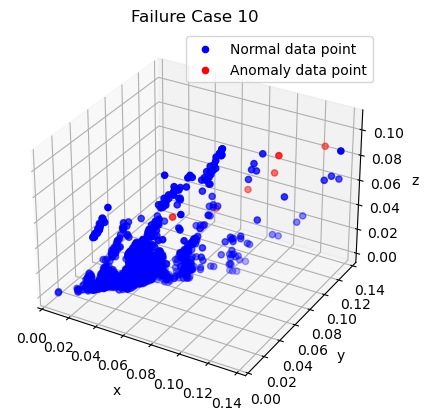

In [153]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2016, 4, 29)
index2 = date(2016, 6, 16)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC1
data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point')
ax.scatter(data1['RMS'], data1['Stv'], data1['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b')
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b')
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'].loc[:index1], data2['Stv'].loc[:index1], data2['areaUnderSignal'].loc[:index1], c='b')
ax.scatter(data2['RMS'].loc[index2:], data2['Stv'].loc[index2:], data2['areaUnderSignal'].loc[index2:], c='b')

ax.scatter(data2['RMS'].loc[index1:index2], data2['Stv'].loc[index1:index2], data2['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('x') 
ax.set_ylabel('y') 
ax.set_zlabel('z') 
ax.legend()
ax.set_title('Failure Case 1')
plt.show()

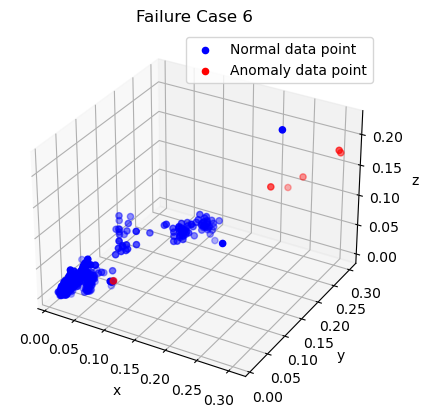

In [154]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2016, 9, 9)
index2 = date(2017, 3, 3)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC6
data1 = feature_axis1_FC6
data2 = feature_axis4_FC6
data3 = feature_axis3_FC6
data4 = feature_axis2_FC6
data5 = feature_axis5_FC6
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point')
ax.scatter(data1['RMS'], data1['Stv'], data1['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b')
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b')
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b')
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'].loc[:index1], data2['Stv'].loc[:index1], data2['areaUnderSignal'].loc[:index1], c='b')
ax.scatter(data2['RMS'].loc[index2:], data2['Stv'].loc[index2:], data2['areaUnderSignal'].loc[index2:], c='b')

ax.scatter(data2['RMS'].loc[index1:index2], data2['Stv'].loc[index1:index2], data2['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('x') 
ax.set_ylabel('y') 
ax.set_zlabel('z') 
ax.legend()
ax.set_title('Failure Case 6')
plt.show()

In [155]:
feature_axis1_FC7 = pd.concat([RMS_Value_FC7['axis1'],Stv_FC7['axis1'],torque_areaUnderSignal_FC7['axis1']],axis=1)
feature_axis1_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC8 = pd.concat([RMS_Value_FC8['axis1'],Stv_FC8['axis1'],torque_areaUnderSignal_FC8['axis1']],axis=1)
feature_axis1_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC7 = pd.concat([RMS_Value_FC7['axis2'],Stv_FC7['axis2'],torque_areaUnderSignal_FC7['axis2']],axis=1)
feature_axis2_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC8 = pd.concat([RMS_Value_FC8['axis2'],Stv_FC8['axis2'],torque_areaUnderSignal_FC8['axis2']],axis=1)
feature_axis2_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC7 = pd.concat([RMS_Value_FC7['axis3'],Stv_FC7['axis3'],torque_areaUnderSignal_FC7['axis3']],axis=1)
feature_axis3_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC8 = pd.concat([RMS_Value_FC8['axis3'],Stv_FC8['axis3'],torque_areaUnderSignal_FC8['axis3']],axis=1)
feature_axis3_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC7 = pd.concat([RMS_Value_FC7['axis4'],Stv_FC7['axis4'],torque_areaUnderSignal_FC7['axis4']],axis=1)
feature_axis4_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC8 = pd.concat([RMS_Value_FC8['axis4'],Stv_FC8['axis4'],torque_areaUnderSignal_FC8['axis4']],axis=1)
feature_axis4_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC7 = pd.concat([RMS_Value_FC7['axis5'],Stv_FC7['axis5'],torque_areaUnderSignal_FC7['axis5']],axis=1)
feature_axis5_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC8 = pd.concat([RMS_Value_FC8['axis5'],Stv_FC8['axis5'],torque_areaUnderSignal_FC8['axis5']],axis=1)
feature_axis5_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC7 = pd.concat([RMS_Value_FC7['axis6'],Stv_FC7['axis6'],torque_areaUnderSignal_FC7['axis6']],axis=1)
feature_axis6_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC8 = pd.concat([RMS_Value_FC8['axis6'],Stv_FC8['axis6'],torque_areaUnderSignal_FC8['axis6']],axis=1)
feature_axis6_FC8.columns = ['RMS','Stv','areaUnderSignal']

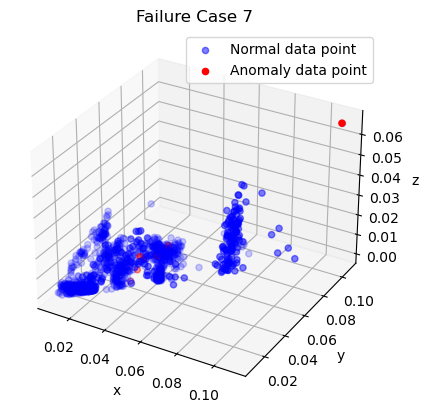

In [164]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2017, 4, 20)
index2 = date(2017, 4, 26)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC7
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point',alpha =0.5)
ax.scatter(data1['RMS'], 4data1['Stv'], data1['areaUnderSignal'], c='b',alpha =0.2)
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b',alpha =0.2)
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b',alpha =0.2)
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b',alpha =0.2)
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'].loc[:index1], data2['Stv'].loc[:index1], data2['areaUnderSignal'].loc[:index1], alpha =0.2, c='b')
ax.scatter(data2['RMS'].loc[index2:], data2['Stv'].loc[index2:], data2['areaUnderSignal'].loc[index2:], alpha =0.2, c='b')

ax.scatter(data2['RMS'].loc[index1:index2], data2['Stv'].loc[index1:index2], data2['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('x') 
ax.set_ylabel('y') 
ax.set_zlabel('z') 
ax.legend()
ax.set_title('Failure Case 7')
plt.show()

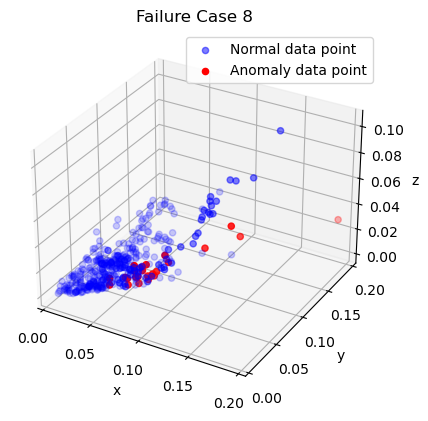

In [166]:
from mpl_toolkits.mplot3d import Axes3D
index1 = date(2016, 8, 1)
index2 = date(2017, 10, 28)
fig = plt.figure() 
ax = fig.add_subplot(projection='3d') 
data = feature_axis6_FC8
data1 = feature_axis1_FC8
data2 = feature_axis3_FC8
data3 = feature_axis2_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
ax.scatter(data['RMS'], data['Stv'], data['areaUnderSignal'], c='b', label='Normal data point',alpha =0.5)
ax.scatter(data1['RMS'], data1['Stv'], data1['areaUnderSignal'], c='b',alpha =0.2)
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data3['RMS'], data3['Stv'], data3['areaUnderSignal'], c='b',alpha =0.2)
ax.scatter(data4['RMS'], data4['Stv'], data4['areaUnderSignal'], c='b',alpha =0.2)
ax.scatter(data5['RMS'], data5['Stv'], data5['areaUnderSignal'], c='b',alpha =0.2)
# ax.scatter(data2['RMS'], data2['Stv'], data2['areaUnderSignal'], c='b')
ax.scatter(data2['RMS'].loc[:index1], data2['Stv'].loc[:index1], data2['areaUnderSignal'].loc[:index1], alpha =0.2, c='b')
ax.scatter(data2['RMS'].loc[index2:], data2['Stv'].loc[index2:], data2['areaUnderSignal'].loc[index2:], alpha =0.2, c='b')

ax.scatter(data2['RMS'].loc[index1:index2], data2['Stv'].loc[index1:index2], data2['areaUnderSignal'].loc[index1:index2], c='r', marker='o', label='Anomaly data point')
ax.set_xlabel('x') 
ax.set_ylabel('y') 
ax.set_zlabel('z') 
ax.legend()
ax.set_title('Failure Case 8')
plt.show()

In [159]:
data2['RMS'].loc[index1:index2]


time
2017-04-20    0.034351
2017-04-21    0.036767
2017-04-22    0.037911
2017-04-23    0.039156
2017-04-24    0.043915
2017-04-25    0.047889
2017-04-26    0.109420
Name: RMS, dtype: float64

# Clustering between two features (each axis) 

In [291]:
from sklearn.cluster import KMeans

In [102]:
index = pd.DatetimeIndex(pd.date_range('20170101', '20190101', freq='W'))
index

DatetimeIndex(['2017-01-01', '2017-01-08', '2017-01-15', '2017-01-22',
               '2017-01-29', '2017-02-05', '2017-02-12', '2017-02-19',
               '2017-02-26', '2017-03-05',
               ...
               '2018-10-28', '2018-11-04', '2018-11-11', '2018-11-18',
               '2018-11-25', '2018-12-02', '2018-12-09', '2018-12-16',
               '2018-12-23', '2018-12-30'],
              dtype='datetime64[ns]', length=105, freq='W-SUN')

In [ ]:
torque_areaUnderSignal_FC12 = torque_areaUnderSignal_FC12.dropna(axis=0,how='any')
torque_trimmedMean

In [311]:
feature_axis1_FC2

,RMS,Stv,areaUnderSignal
time,,,
2014-09-26,0.011958,0.011955,0.015946
2014-10-29,0.054028,0.054013,0.054080
2015-02-11,0.008902,0.008897,0.010258
2015-02-12,0.010567,0.010548,0.008562
2015-02-13,0.027799,0.027798,0.037204
...,...,...,...
2017-09-05,0.028547,0.028538,0.023479
2017-09-06,0.026984,0.026983,0.013547
2017-09-07,0.045028,0.045020,0.037682


In [315]:
def plot_figure(df,FCname):
    p_cluster = df[0:20]
    kmeans = KMeans(n_clusters=1)
    kmeans.fit(p_cluster)


    centers = kmeans.cluster_centers_
    print(centers)
    
    fig,ax = plt.subplots()

    ax.set_ylim(0, .2)
    ax.set_xlim(0, .2)

    ax.set_xlabel('Stv')  
    ax.set_ylabel('areaUnderSignal')
    ax.set_title(FCname) 
    
    df.index = pd.to_datetime(df.index)
    sca = ax.scatter(df['Stv'], df['areaUnderSignal'],c=df.index,cmap='jet_r')
    cbar = plt.colorbar(sca)

    cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))
    ax.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
    fig.autofmt_xdate()
    plt.show()
    

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_21780\968852890.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.02095908 0.02095278 0.02460159]]


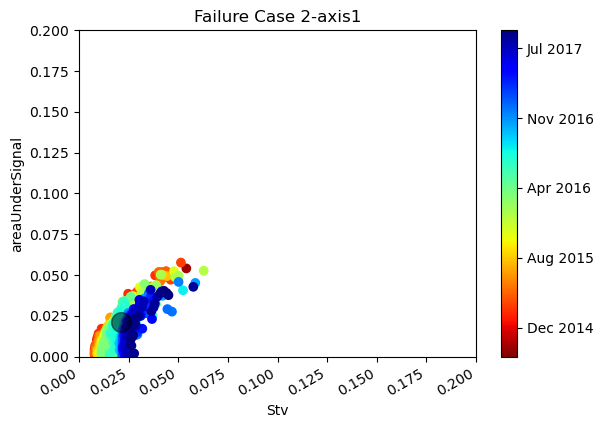

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_21780\968852890.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.00786978 0.00786281 0.00142959]]


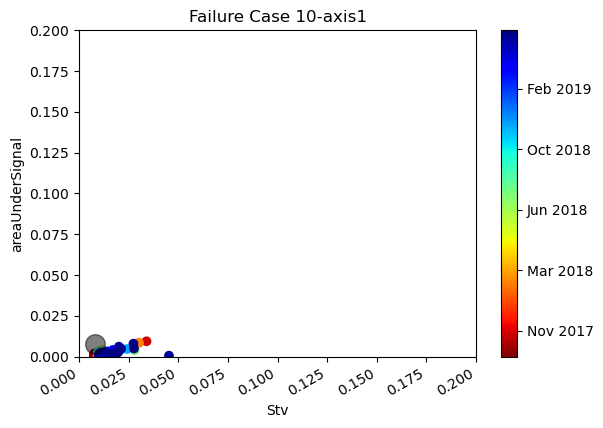

In [314]:
data1 = feature_axis1_FC2
data2 = feature_axis1_FC10
FCname1, FCname2 = 'Failure Case 2-axis1','Failure Case 10-axis1'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(0.0, 0.3)

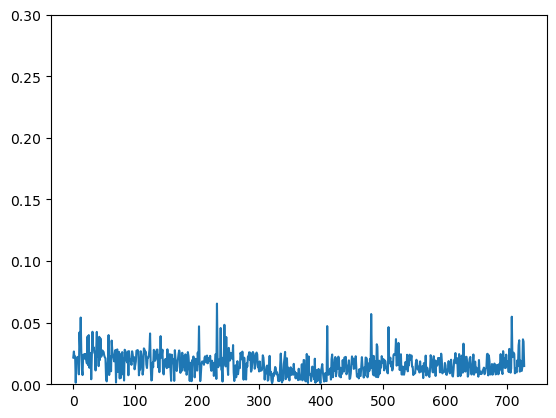

In [316]:
p_cluster = data1[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster)
centers = kmeans.cluster_centers_
Distance = []
for i in range(21, len(data1)):
    x = data1.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers))
    Distance.append(dist)
    
plt.plot(Distance)  
plt.ylim(0, .3)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.01885817 0.01875797]]


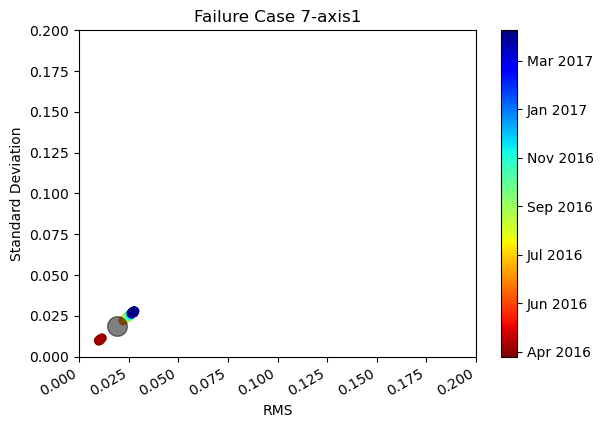

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.01788104 0.01785754]]


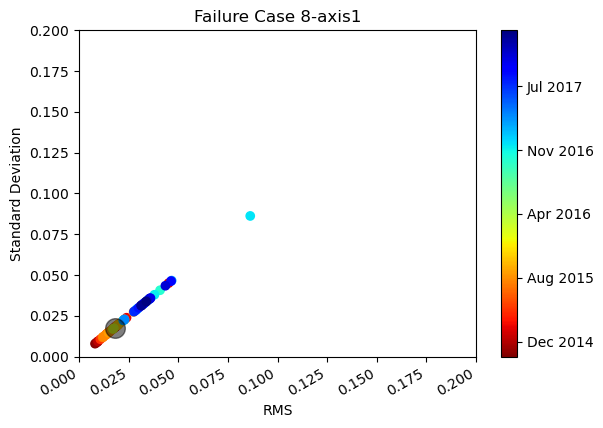

In [154]:
data1 = feature_axis1_FC7
data2 = feature_axis1_FC8
FCname1, FCname2 = 'Failure Case 7-axis1','Failure Case 8-axis1'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

[[0.00636353 0.0311097 ]]


C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


KeyError: 'areaUnderSignal'

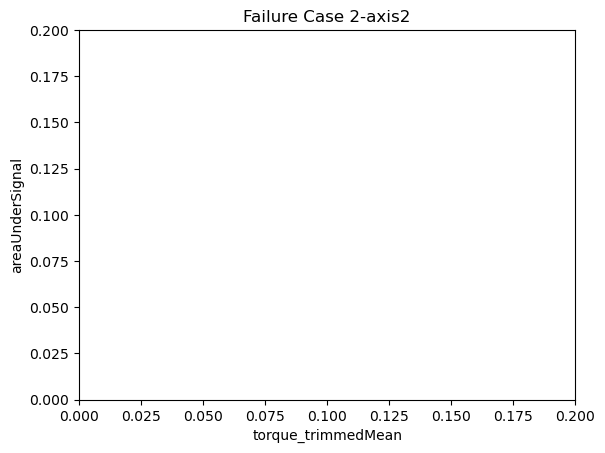

In [304]:
data1 = feature_axis2_FC2
data2 = feature_axis2_FC10
FCname1, FCname2 = 'Failure Case 2-axis2','Failure Case 10-axis2'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.02921375 0.0289995 ]]


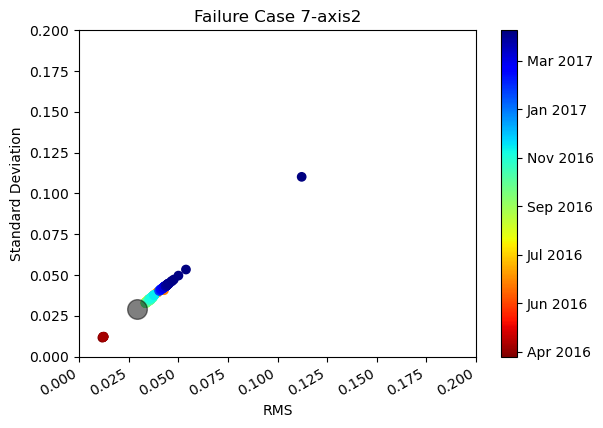

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.02792816 0.02785057]]


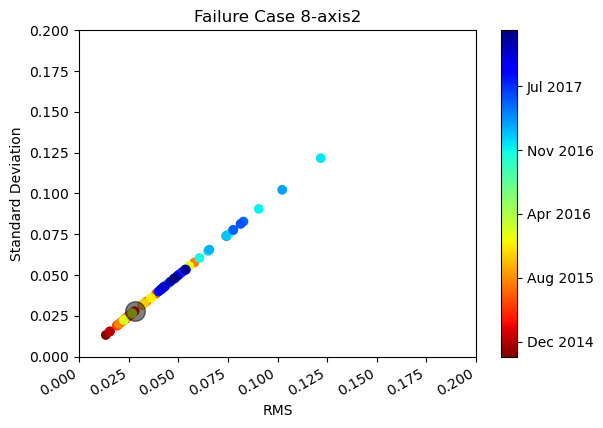

In [155]:
data1 = feature_axis2_FC7
data2 = feature_axis2_FC8
FCname1, FCname2 = 'Failure Case 7-axis2','Failure Case 8-axis2'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03549271 0.03421696]]


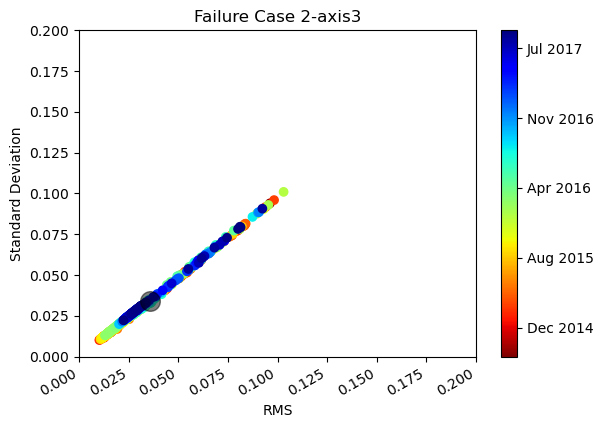

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.02752112 0.02736176]]


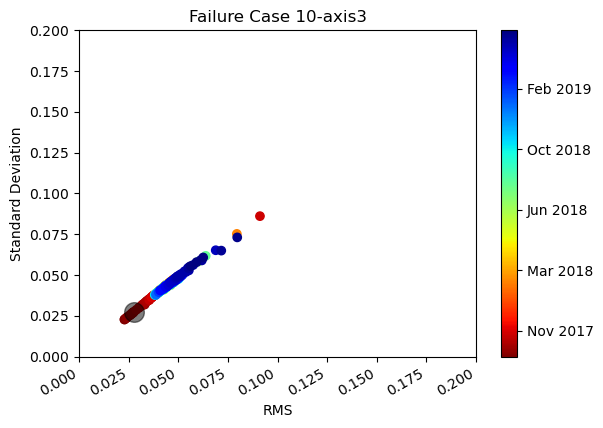

In [149]:
data1 = feature_axis3_FC2
data2 = feature_axis3_FC10
FCname1, FCname2 = 'Failure Case 2-axis3','Failure Case 10-axis3'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.04982703 0.04975694]]


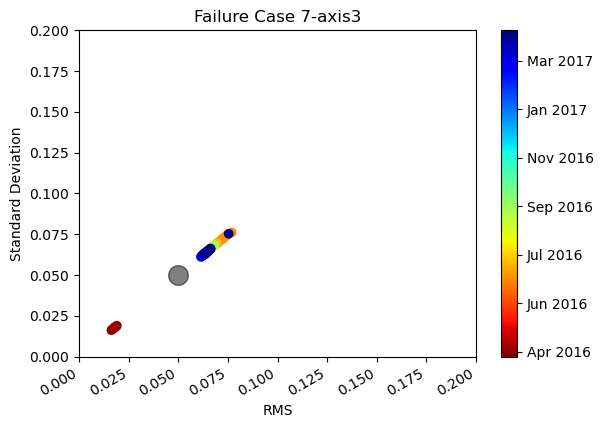

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.0451773 0.0440204]]


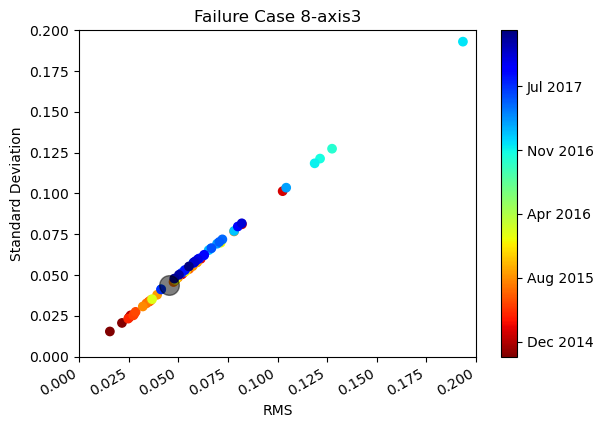

In [156]:
data1 = feature_axis3_FC7
data2 = feature_axis3_FC8
FCname1, FCname2 = 'Failure Case 7-axis3','Failure Case 8-axis3'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03521091 0.03498058]]


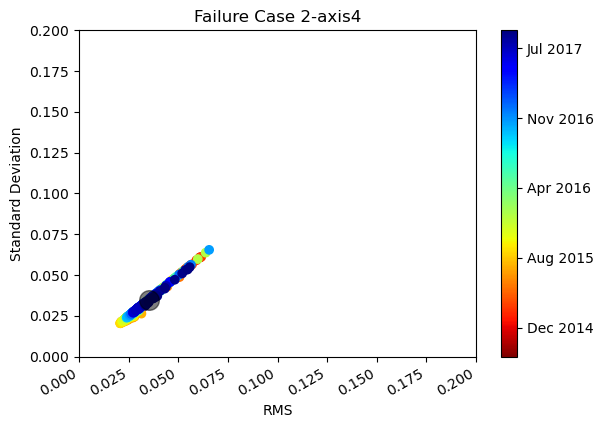

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[[0.01898881 0.01878258]]


C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


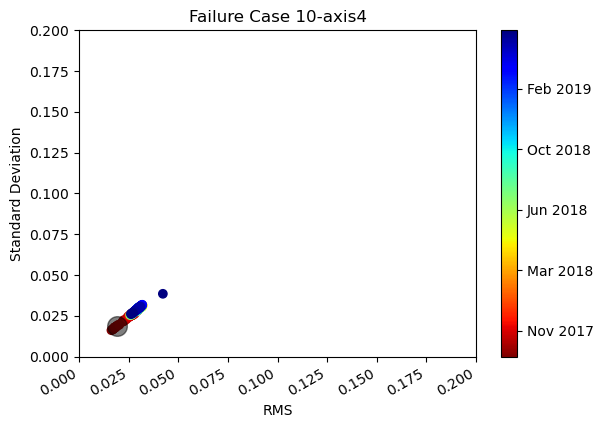

In [150]:
data1 = feature_axis4_FC2
data2 = feature_axis4_FC10
FCname1, FCname2 = 'Failure Case 2-axis4','Failure Case 10-axis4'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.04830878 0.04732623]]


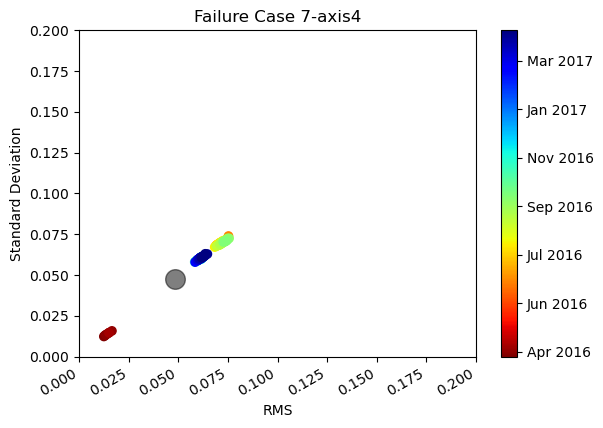

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.05073647 0.04779518]]


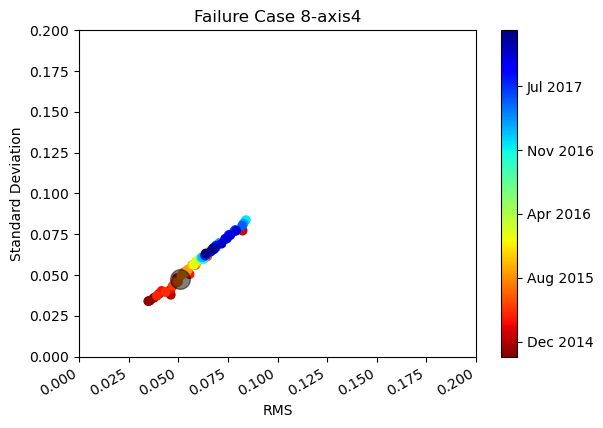

In [157]:
data1 = feature_axis4_FC7
data2 = feature_axis4_FC8
FCname1, FCname2 = 'Failure Case 7-axis4','Failure Case 8-axis4'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03469318 0.03443436]]


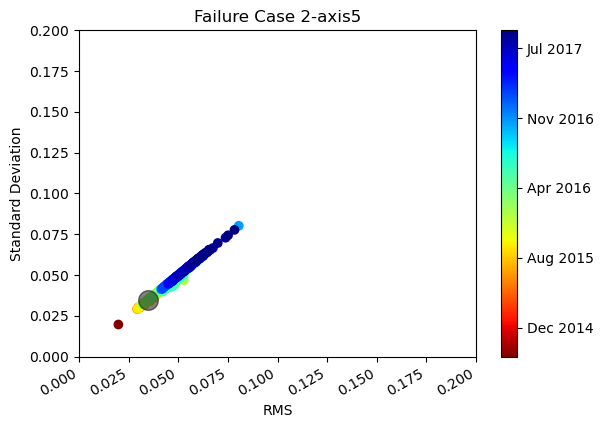

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03353245 0.03341758]]


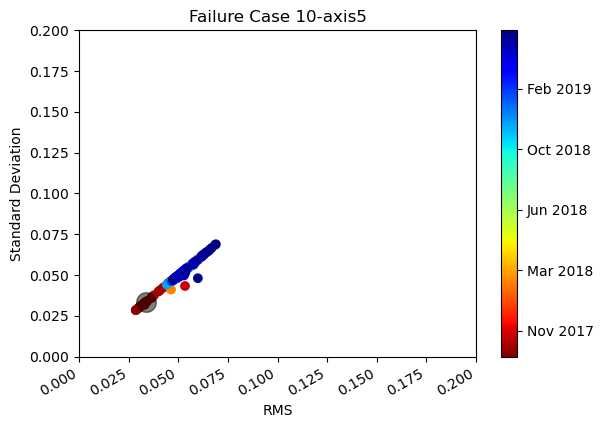

In [151]:
data1 = feature_axis5_FC2
data2 = feature_axis5_FC10
FCname1, FCname2 = 'Failure Case 2-axis5','Failure Case 10-axis5'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03582099 0.03397689]]


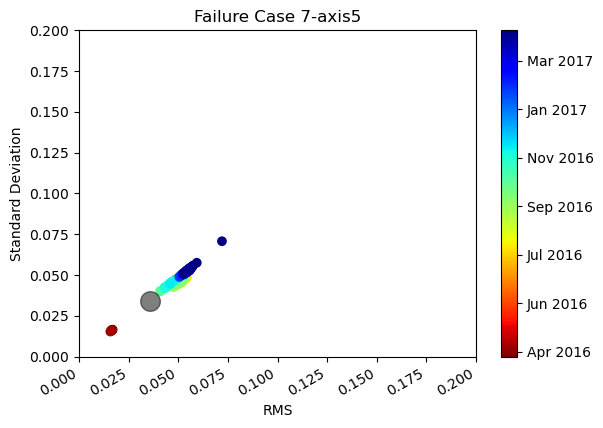

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.03082014 0.03052533]]


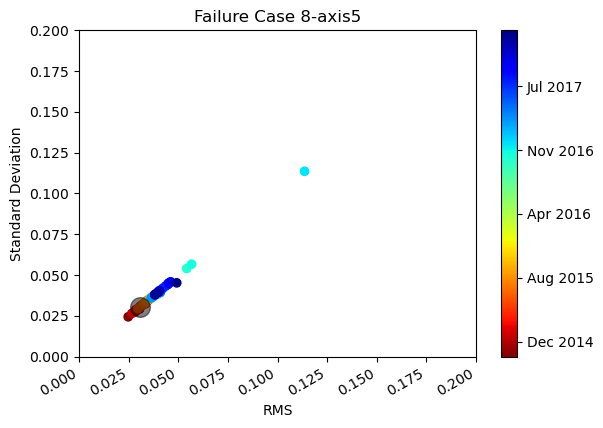

In [170]:
data1 = feature_axis5_FC7
data2 = feature_axis5_FC8
FCname1, FCname2 = 'Failure Case 7-axis5','Failure Case 8-axis5'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.09247772 0.09158993]]


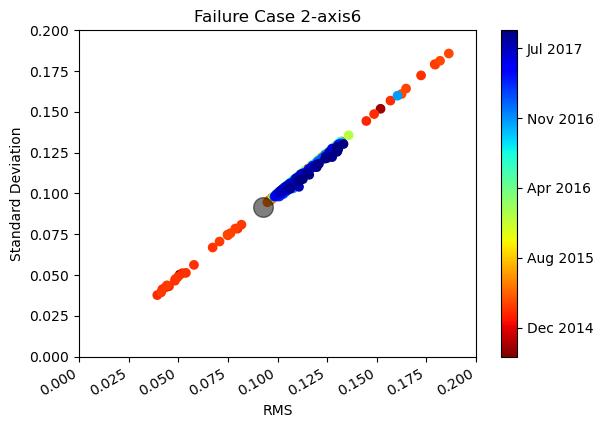

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.02031339 0.02020961]]


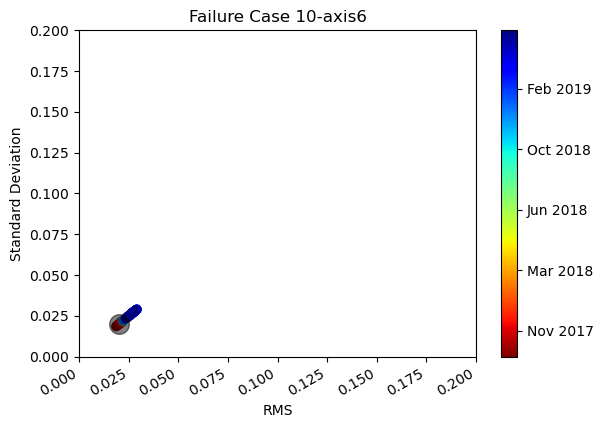

In [152]:
data1 = feature_axis6_FC2
data2 = feature_axis6_FC10
FCname1, FCname2 = 'Failure Case 2-axis6','Failure Case 10-axis6'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.06406988 0.05777759]]


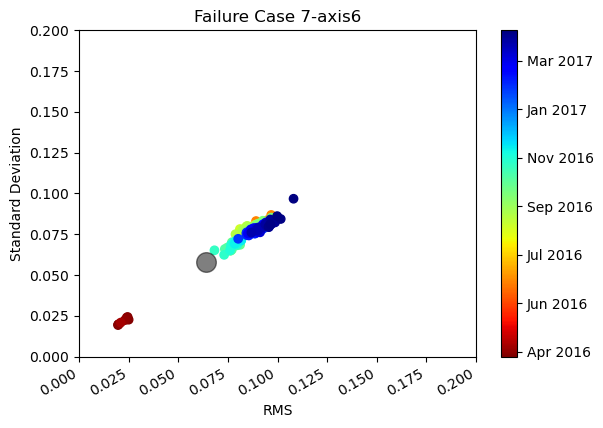

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Temp\ipykernel_6300\578212465.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))


[[0.04657119 0.04630288]]


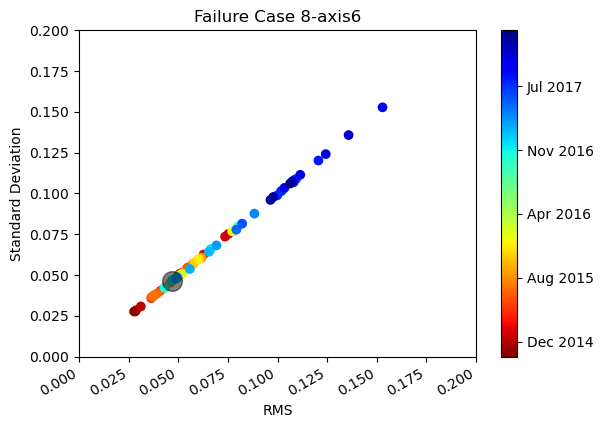

In [171]:
data1 = feature_axis6_FC7
data2 = feature_axis6_FC8
FCname1, FCname2 = 'Failure Case 7-axis6','Failure Case 8-axis6'
plot_figure(data1,FCname1)
plot_figure(data2,FCname2)

(0.0, 0.3)

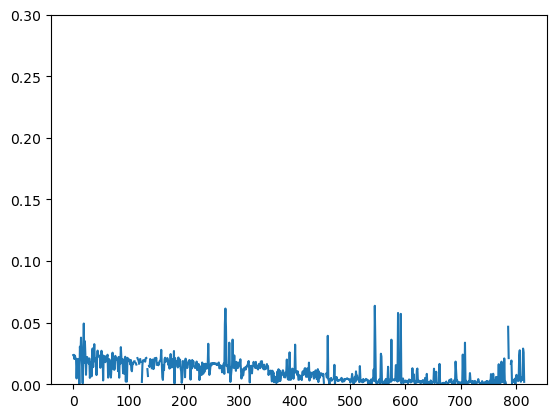

In [46]:

Distance = []
for i in range(21, len(data1)):
    x = data1.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers1))
    Distance.append(dist)
    
plt.plot(Distance)    

plt.ylim(0, .3)

In [ ]:
kmeans = KMeans(n_clusters=1)

# Initiate the reference cluster
ref_cluster = data1[0:20]
ref_array = ref_cluster.to_numpy() 
#Find the centroid of this cluster
reference1 = kmeans.fit(ref_cluster)
centers1 = reference.cluster_centers_
print('centroid of the reference cluster is',centers1)
# Initiate the number N
num = 0
# Create an empty array for the anomaly cluster
new_cluster = np.zeros((0,2))
update_list = []
anomaly_list = []

# Input new signals 
for i in range(20, len(data1)):
    x = data1.iloc[i] 
    dist = (np.linalg.norm(x.to_numpy()-centers1))
    x = x.values.reshape((1,2))    
    if dist > 0.1:
        num = num + 1
        new_cluster = np.append(new_cluster,x, axis=0)
        if num >=5:
            anomaly = kmeans.fit(new_cluster)
            centers_anomaly = anomaly.cluster_centers_
            anomaly_list.append(centers_anomaly)
        else:
            pass
    else:
        
        ref_cluster = np.concatenate((ref_cluster,x), axis=0)
        update = kmeans.fit(ref_cluster)
        center_update = update.cluster_centers_
        update_list.append(center_update)

In [ ]:
anomaly_list
anomaly_cluster = np.zeros((0,2))
for i in anomaly_list:
    anomaly_cluster = np.concatenate((anomaly_cluster,i), axis=0)
# anomaly = pd.DataFrame(a, columns = ['centroid1','centroid2'])
anomaly_cluster.shape
len(anomaly_cluster)
update_cluster = np.zeros((0,2))
for i in update_list:
    update_cluster = np.concatenate((update_cluster,i), axis=0)
update_cluster

In [ ]:
plt.scatter(anomaly_cluster[:,0], anomaly_cluster[:,1],c= range(len(anomaly_cluster)), cmap='YlGn',s=90, alpha=0.5)
plt.colorbar()
plt.scatter(update_cluster[:,0], update_cluster[:,1],c= range(len(update_cluster)), cmap='Blues',s=90, alpha=0.5)
plt.colorbar()
plt.scatter(data1['RMS'], data1['Stv'],c= index, cmap='Reds',s=10, alpha=0.5)
plt.colorbar()
plt.scatter(centers1[:, 0], centers1[:, 1], c='black', s=200, alpha=0.5);

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(0.0, 0.2)

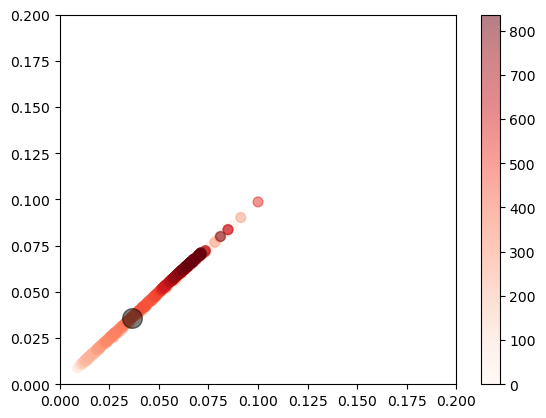

In [53]:
data2 = df2_FC2
p_cluster2 = data2[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster2)



index = np.arange(len(data2))
# p_cluster.shape
plt.scatter(data2['RMS'], data2['Stv'],c= index, cmap='Reds',s=50, alpha=0.5)
plt.colorbar()
centers2 = kmeans.cluster_centers_

plt.scatter(centers2[:, 0], centers2[:, 1], c='black', s=200, alpha=0.5);

plt.xlim(0, .2)
plt.ylim(0, .2)




In [48]:
data2 = df1_FC2

In [49]:

kmeans = KMeans(n_clusters=1)

# Initiate the reference cluster
ref_cluster = data2[0:20]
ref_array = ref_cluster.to_numpy() 
#Find the centroid of this cluster
import numpy as np



reference = kmeans.fit(ref_cluster)
new_cluster = np.empty([0, 2])
centers2 = reference.cluster_centers_
x = data2.iloc[30].values.reshape((1,2))
arr = np.zeros((0,2))  # 定义一个空ndarry数组
arr = np.append(arr, x,axis = 0)
x1 = data2.iloc[31].values.reshape((1,2))
arr = np.append(arr, x1,axis = 0)
print(centers2)

ref_cluster1 = np.append(ref_array,x, axis=0)
ref_cluster1.shape


C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[[0.02454146 0.02453383]]


(21, 2)

In [51]:
def centeroidnp(arr):
    length = arr.shape[0]
    sum_x = np.sum(arr[:, 0])
    sum_y = np.sum(arr[:, 1])
    return sum_x/length, sum_y/length
centeroidnp(ref_array)

(0.024541455247163606, 0.024533826880988683)

In [ ]:


from datetime import datetime
n = 0
for i in data.index:
    n = n + 1
    if n == 11:
        print(i)
        break

index_list = []

data1.iloc[21]

In [ ]:
kmeans = KMeans(n_clusters=1)

# Initiate the reference cluster
ref_cluster = data2[0:20]
ref_array = ref_cluster.to_numpy() 
#Find the centroid of this cluster
reference2 = kmeans.fit(ref_cluster)
centers2 = reference.cluster_centers_
print('centroid of the reference cluster is',centers2)
# Initiate the number N
num = 2
# Create an empty array for the anomaly cluster
new_cluster = np.zeros((0,2))
update_list = []
anomaly_list = []

# Input new signals 
for i in range(20, len(data2)):
    x = data2.iloc[i] 
    dist = (np.linalg.norm(x.to_numpy()-centers2))
    x = x.values.reshape((1,2))    
    if dist > 0.15:
        num = num + 1
        new_cluster = np.append(new_cluster,x, axis=0)
        if num >=5:
            #anomaly = kmeans.fit(new_cluster)
            centers_anomaly = centeroidnp(new_cluster)
            print(centers_anomaly)
            anomaly_list.append(centers_anomaly)
        else:
            pass
    else:
        
        ref_cluster = np.append(ref_array,x, axis=0)
        #update = kmeans.fit(ref_cluster)
        center_update = centeroidnp(ref_cluster)
        update_list.append(center_update)



In [ ]:
new_cluster

In [ ]:

length = len(anomaly_list)
anomaly_cluster = np.zeros((length,2))
for i in range(length):
    
    anomaly_cluster[i][0] = anomaly_list[i][0]  
    anomaly_cluster[i][1] = anomaly_list[i][1] 
anomaly_cluster

In [ ]:
length = len(update_list)
update_cluster = np.zeros((length,2))
for i in range(length):
    
    update_cluster[i][0] = update_list[i][0]  
    update_cluster[i][1] = update_list[i][1] 
update_cluster

In [ ]:
anomaly_list
anomaly_cluster = np.zeros((0,2))
for i in anomaly_list:
    anomaly_cluster = np.concatenate((anomaly_cluster,i), axis=0)
# anomaly = pd.DataFrame(a, columns = ['centroid1','centroid2'])
anomaly_cluster.shape
len(anomaly_cluster)
update_cluster = np.zeros((0,2))
for i in update_list:
    update_cluster = np.concatenate((update_cluster,i), axis=0)
update_cluster

In [ ]:

plt.scatter(anomaly_cluster[:,0], anomaly_cluster[:,1],c= range(len(anomaly_cluster)), cmap='YlGn',s=90, alpha=0.5)
plt.colorbar()
# plt.scatter(update_cluster[:,0], update_cluster[:,1],c= range(len(update_cluster)), cmap='Blues',s=90, alpha=0.5)
# plt.colorbar()
plt.scatter(data2['RMS'], data2['Stv'],c= index, cmap='Reds',s=20, alpha=0.5)
plt.colorbar()
plt.scatter(centers2[:, 0], centers2[:, 1], c='black', s=100, alpha=0.5);
plt.scatter(new_cluster[:, 0], new_cluster[:, 1], marker="x", s=10, linewidths=1)
plt.xlim(0, .2)
plt.ylim(0, .2)

In [ ]:

Distance = []
for i in range(21, len(data2)):
    x = data2.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers2))
    Distance.append(dist)
    
plt.plot(Distance)  
plt.ylim(0, .3)



In [ ]:
len(index)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(0.0, 0.2)

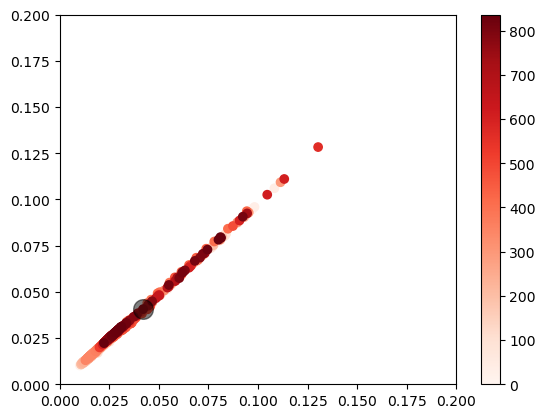

In [54]:
data3 = df3_FC2
p_cluster3 = data3[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster3)

index = np.arange(len(data3))
# p_cluster.shape
plt.scatter(data3['RMS'], data3['Stv'],c= index, cmap='Reds')
plt.colorbar()
centers3 = kmeans.cluster_centers_
plt.scatter(centers3[:, 0], centers3[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .2)
plt.ylim(0, .2)


(0.0, 0.3)

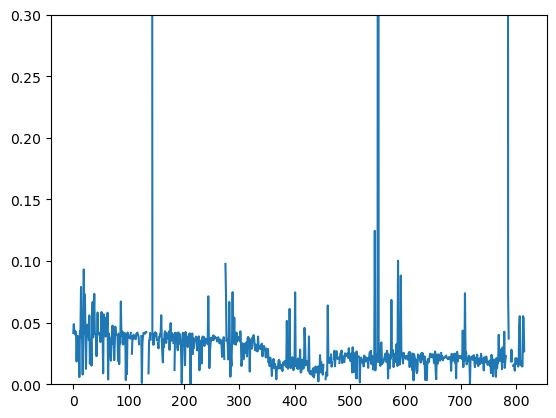

In [65]:
Distance = []
for i in range(21, len(data3)):
    x = data3.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers3))
    Distance.append(dist)
    
plt.plot(Distance)  
plt.ylim(0, .3)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(0.0, 0.2)

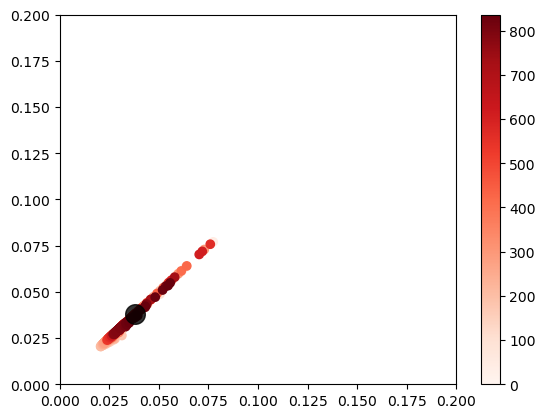

In [56]:
data4 = df4_FC2
p_cluster4 = data4[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster4)



index = np.arange(len(data4))
# p_cluster.shape
plt.scatter(data4['RMS'], data4['Stv'],c= index, cmap='Reds')
plt.colorbar()
centers4 = kmeans.cluster_centers_

plt.scatter(centers4[:, 0], centers4[:, 1], c='black', s=200, alpha=0.8);

plt.xlim(0, .2)
plt.ylim(0, .2)

(0.0, 0.3)

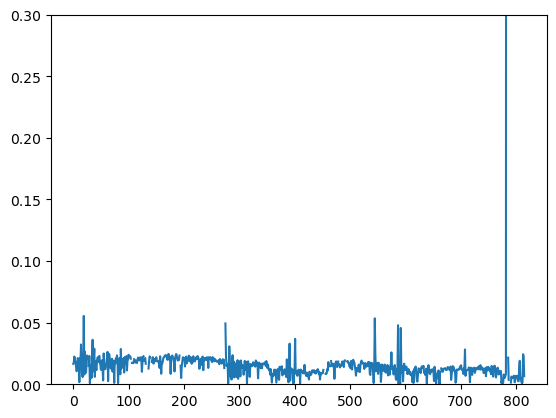

In [68]:
Distance = []
for i in range(21, len(data4)):
    x = data4.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers4))
    Distance.append(dist)
    
plt.plot(Distance)  
plt.ylim(0, .3)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(0.0, 0.2)

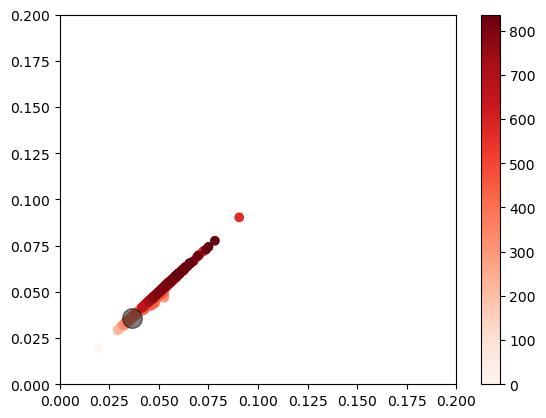

In [82]:
data5 = df5_FC2
p_cluster5 = data5[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster5)


index = np.arange(len(data5))
# p_cluster.shape
plt.scatter(data5['RMS'], data5['Stv'],c= index, cmap='Reds')
plt.colorbar()
centers5 = kmeans.cluster_centers_

plt.scatter(centers5[:, 0], centers5[:, 1], c='black', s=200, alpha=0.5);

plt.xlim(0, .2)
plt.ylim(0, .2)

(0.0, 0.3)

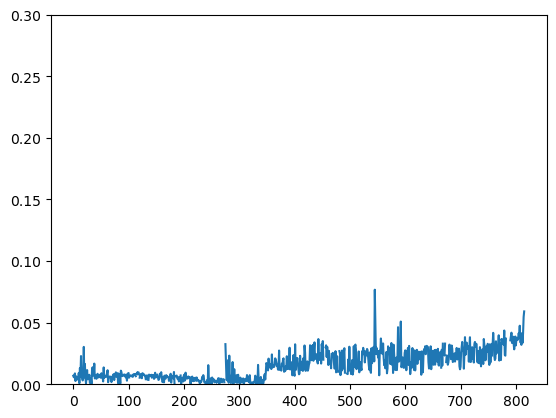

In [84]:
Distance = []
for i in range(21, len(data5)):
    x = data5.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers5))
    Distance.append(dist)
    
plt.plot(Distance)  
plt.ylim(0, .3)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


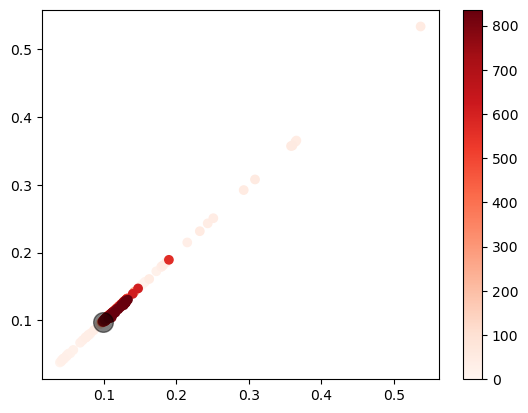

In [79]:
data6 = df6_FC2
p_cluster6 = data6[0:20]
kmeans = KMeans(n_clusters=1)
kmeans.fit(p_cluster6)


index = np.arange(len(data6))
# p_cluster.shape
plt.scatter(data6['RMS'], data6['Stv'],c= index, cmap='Reds')
plt.colorbar()
centers6 = kmeans.cluster_centers_

plt.scatter(centers6[:, 0], centers6[:, 1], c='black', s=200, alpha=0.5);

# plt.xlim(0, .2)
# plt.ylim(0, .2)

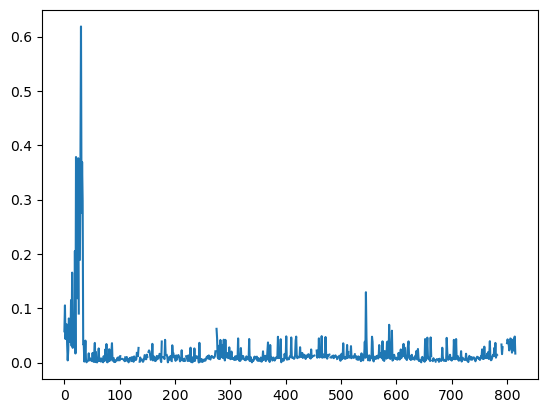

In [80]:
Distance = []
for i in range(21, len(data6)):
    x = data6.iloc[i].to_numpy() 
    dist = (np.linalg.norm(x-centers6))
    Distance.append(dist)
    
plt.plot(Distance)  


In [ ]:
data = df1[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .15)
plt.ylim(0, .1)
print(kmeans.labels_)

In [ ]:
data = df2[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .2)
plt.ylim(0, .2)
print(kmeans.labels_)


In [ ]:
data = df3[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .15)
plt.ylim(0, .1)
print(kmeans.labels_)

In [ ]:
data = df4[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .15)
plt.ylim(0, .1)
print(kmeans.labels_)

In [62]:
data = df5_FC2
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .15)
plt.ylim(0, .1)
print(kmeans.labels_)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
data = df6[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
plt.xlim(0, .15)
plt.ylim(0, .1)
print(kmeans.labels_)

In [ ]:
feature = pd.concat([df1[['RMS','Stv']],df2[['RMS','Stv']],df3[['RMS','Stv']],df4[['RMS','Stv']],df5[['RMS','Stv']],df6[['RMS','Stv']]], axis=0)
feature

In [ ]:
pd.set_option('max_colwidth',100)
inertias = []

pd.set_option('display.max_columns', None)

pd.set_option('display.max_rows', None)
for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(feature)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(feature)

plt.scatter(feature['RMS'], feature['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
print(kmeans.labels_)

In [ ]:
import datetime

d = datetime.date(2019, 5, 9)
print(d)
n = 0
df1
df = df1
df  

In [ ]:

df.insert(6, 'Anomaly', value = [True if i < d else False for i in df1.index])
df

In [ ]:
data = df[['RMS','Stv']]
data

inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

plt.scatter(data['RMS'], data['Stv'],c=kmeans.labels_)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);
print(kmeans.labels_)

In [ ]:
File_test = '04-64139_DIAGDATA_20170920_180212__MCC.zip'
feature_list_axis1 = []

from datetime import timedelta
with ZipFile(File_test) as File:
    for file in File.namelist():
        print(file)
        with File.open(file) as f:
            header = read_header(f)
            date = header['date_time']
            print(date.date())
            data = read_data(f)
            mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])
            series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
            plt.figure(figsize=(10,2)) 
            if ax2 in file:
                    # Extract features for axis1
                d = series.normalized_torque()            
                time_index = series.time_index
                   

plt.plot(time_index, d)
plt.show()
plt.hist(d, bins=50)
plt.title('Histogram')
from sklearn.neighbors import KernelDensity




In [ ]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)
dd = d.reshape(-1, 1)
kde = KernelDensity(kernel='gaussian', bandwidth=0.75).fit(dd)
log_dens = kde.score_samples(dd)
ax[1, 1].fill(dd[:, 0], np.exp(log_dens), fc="#AAAAFF")
ax[1, 1].text(-3.5, 0.31, "Gaussian Kernel Density")
plt.show()



In [ ]:
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139'
ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
d1,d2,d3,d4,d5,d6 = [],[],[],[],[],[]
columns=['axis1','axis2','axis3','axis4','axis5','axis6']
divergence_kullbackleibler = pd.DataFrame(columns=columns)
conditional_entropy = pd.DataFrame(columns=columns)
entropy = pd.DataFrame(columns=columns)
mutual_information = pd.DataFrame(columns=columns)
Jensen_Shannon_divergence = pd.DataFrame(columns=columns)
i = 0    
for loop_file in os.listdir(File_path):
    route = os.path.join(File_path,loop_file)
    print(route)
    if '04-64139_DIAGDATA_20170918_135452_3ece932f-a030-4c95-bd2c-e6d899ed8871_MCC.zip' in route:
        ref1,ref2,ref3,ref4,ref5,ref6 = find_reference_point(route)
    else:
        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    if ax1 in file:
                    # Extract features for axis1
                        DATA1 = series.normalized_torque()
                        print(ref1)
                        divergence_kullbackleibler.loc[i, 'axis1'] = drv.entropy_conditional(ref1,DATA1)
                        break
#                         Skewness_value.loc[i, 'axis1'] = tsfresh.feature_extraction.feature_calculators.skewness(d1)
#                         Kurtosis_value.loc[i, 'axis1'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d1)
#                         Crest_factor.loc[i, 'axis1'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d1)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d1)
#                     elif ax2 in file:
#                     # Extract features for axis1
#                         DATA2 = series.torque
#                         d2 = np.concatenate((d2,DATA2), axis=None)
#                         RMS_Value.loc[i, 'axis2'] = tsfresh.feature_extraction.feature_calculators.root_mean_square(d2)
#                         Skewness_value.loc[i, 'axis2'] = tsfresh.feature_extraction.feature_calculators.skewness(d2)
#                         Kurtosis_value.loc[i, 'axis2'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d2)
#                         Crest_factor.loc[i, 'axis2'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d2)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d2)
#                     elif ax3 in file:
#                     # Extract features for axis1
#                         DATA3 = series.torque
#                         d3 = np.concatenate((d3,DATA3), axis=None)
#                         RMS_Value.loc[i, 'axis3'] = tsfresh.feature_extraction.feature_calculators.root_mean_square(d3)
#                         Skewness_value.loc[i, 'axis3'] = tsfresh.feature_extraction.feature_calculators.skewness(d3)
#                         Kurtosis_value.loc[i, 'axis3'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d3)
#                         Crest_factor.loc[i, 'axis3'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d3)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d3)
#                     elif ax4 in file:
#                     # Extract features for axis1
#                         DATA4 = series.torque
#                         d4 = np.concatenate((d4,DATA4), axis=None)
#                         RMS_Value.loc[i, 'axis4'] = tsfresh.feature_extraction.feature_calculators.root_mean_square(d4)
#                         Skewness_value.loc[i, 'axis4'] = tsfresh.feature_extraction.feature_calculators.skewness(d4)
#                         Kurtosis_value.loc[i, 'axis4'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d4)
#                         Crest_factor.loc[i, 'axis4'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d4)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d4)
#                     elif ax5 in file:
#                     # Extract features for axis1
#                         DATA5 = series.torque
#                         d5 = np.concatenate((d5,DATA5), axis=None)
#                         RMS_Value.loc[i, 'axis5'] = tsfresh.feature_extraction.feature_calculators.root_mean_square(d5)
#                         Skewness_value.loc[i, 'axis5'] = tsfresh.feature_extraction.feature_calculators.skewness(d5)
#                         Kurtosis_value.loc[i, 'axis5'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d5)
#                         Crest_factor.loc[i, 'axis5'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d5)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d5)
#                     elif ax6 in file:
#                     # Extract features for axis1
#                         DATA6 = series.torque
#                         d6 = np.concatenate((d6,DATA6), axis=None)
#                         RMS_Value.loc[i, 'axis6'] = tsfresh.feature_extraction.feature_calculators.root_mean_square(d6)
#                         Skewness_value.loc[i, 'axis6'] = tsfresh.feature_extraction.feature_calculators.skewness(d6)
#                         Kurtosis_value.loc[i, 'axis6'] = tsfresh.feature_extraction.feature_calculators.kurtosis(d6)
#                         Crest_factor.loc[i, 'axis6'] = tsfresh.feature_extraction.feature_calculators.absolute_maximum(d6)/tsfresh.feature_extraction.feature_calculators.root_mean_square(d6)
#             i = i + 1
               

In [ ]:
A = DATA1-ref1
A

In [ ]:
np.sum(rel_entr(DATA1,ref1))


In [ ]:
plt.figure(figsize=(10,2))
plt.plot(DATA1)
plt.plot(ref1)
# drv.entropy_conditional(ref1, DATA1)

In [ ]:
len(DATA1)